# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 1000
dtc_w2 = 100

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    deeply_inject_disentengled_latents = False,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 3zbmzunl
Name: classic-vortex-624
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/3zbmzunl
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_121054-3zbmzunl/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 222,393,447,186,396,300,555,146,467,378,416,387,238,297,47,207,449,289,269,541,240,266,141,47,312,145,104,282,110,89,186,194,53,329,228,165,268,135,83,192,368,444,327,967,136,387,171,191,283,327,229,153,371,270,259,389,324,632,310,291,221,594,245,151,267,333,299,727,372,373,257,366,361,351,140,220,225,149,57,122,196,489,293,293,348,207,152,232,392,176,139,93,245,396,150,159,447,71,155,295,180,366,107,236,188,218,317,127,142,308,290,112,121,347,329,366,261,42,46,221,220,253,67,201,318,256,190,241,296,216,966,273,195,518,312,152,510,350,503,452,204,452,473,256,359,241,350,243,277,307,263,242,250,404,383,252,246,195,154,625,247,243,142,152,169,169,535,249,371,215,285,390,597,410,292,257,231,243,179,181,210,186,205,229,591,336,336,366,365,7195,425,302,200,163,352,174,265,268,164,31

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 54,88,111,46,99,79,132,29,115,85,117,77,63,61,12,57,113,76,79,122,66,69,47,17,98,39,30,82,16,18,44,51,11,83,58,46,63,45,31,45,100,122,88,252,43,88,44,50,72,71,56,25,99,58,70,89,63,155,72,75,69,137,52,32,55,92,55,178,69,72,67,93,90,94,19,64,52,42,14,29,51,141,89,52,78,65,40,63,87,40,36,37,84,98,42,41,105,25,38,73,35,97,19,67,49,56,93,40,41,60,59,28,20,98,98,78,66,12,13,45,58,76,29,53,77,55,47,57,65,47,231,64,46,129,63,40,113,82,123,129,57,119,106,82,92,59,94,59,86,59,76,60,69,96,114,61,52,42,38,145,63,50,34,34,46,33,132,66,109,54,60,122,153,103,80,65,53,48,39,41,54,50,50,76,172,98,76,80,98,1712,105,47,45,48,94,43,66,64,36,91,33,78,59,73,88,136,64,60,84,21,16,49,49,74,19,55,64,97,39,52,82,69,58,68,62,59,75,65,49,62,70,113,55,71,9,42,35,136,147,143,100,76,66,55,196,106,29,56,51,

Epoch 1/1000:   0%|          | 1/1000 [00:12<3:28:52, 12.54s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:12<3:28:52, 12.54s/it, v_num=nl_1, total_loss_train=1.45e+3, kl_local_train=137]

Epoch 2/1000:   0%|          | 1/1000 [00:12<3:28:52, 12.54s/it, v_num=nl_1, total_loss_train=1.45e+3, kl_local_train=137]

Epoch 2/1000:   0%|          | 2/1000 [00:19<2:32:22,  9.16s/it, v_num=nl_1, total_loss_train=1.45e+3, kl_local_train=137]

Epoch 2/1000:   0%|          | 2/1000 [00:19<2:32:22,  9.16s/it, v_num=nl_1, total_loss_train=1.3e+3, kl_local_train=54.8]

Epoch 3/1000:   0%|          | 2/1000 [00:19<2:32:22,  9.16s/it, v_num=nl_1, total_loss_train=1.3e+3, kl_local_train=54.8]

Epoch 3/1000:   0%|          | 3/1000 [00:26<2:14:11,  8.08s/it, v_num=nl_1, total_loss_train=1.3e+3, kl_local_train=54.8]

Epoch 3/1000:   0%|          | 3/1000 [00:26<2:14:11,  8.08s/it, v_num=nl_1, total_loss_train=1.29e+3, kl_local_train=4.37]

Epoch 4/1000:   0%|          | 3/1000 [00:26<2:14:11,  8.08s/it, v_num=nl_1, total_loss_train=1.29e+3, kl_local_train=4.37]

Epoch 4/1000:   0%|          | 4/1000 [00:32<2:05:32,  7.56s/it, v_num=nl_1, total_loss_train=1.29e+3, kl_local_train=4.37]

Epoch 4/1000:   0%|          | 4/1000 [00:32<2:05:32,  7.56s/it, v_num=nl_1, total_loss_train=1.29e+3, kl_local_train=1.72]

Epoch 5/1000:   0%|          | 4/1000 [00:32<2:05:32,  7.56s/it, v_num=nl_1, total_loss_train=1.29e+3, kl_local_train=1.72]

Epoch 5/1000:   0%|          | 5/1000 [00:39<2:00:37,  7.27s/it, v_num=nl_1, total_loss_train=1.29e+3, kl_local_train=1.72]

Epoch 5/1000:   0%|          | 5/1000 [00:39<2:00:37,  7.27s/it, v_num=nl_1, total_loss_train=1.27e+3, kl_local_train=22.3]

Epoch 6/1000:   0%|          | 5/1000 [00:39<2:00:37,  7.27s/it, v_num=nl_1, total_loss_train=1.27e+3, kl_local_train=22.3]

Epoch 6/1000:   1%|          | 6/1000 [00:46<1:57:31,  7.09s/it, v_num=nl_1, total_loss_train=1.27e+3, kl_local_train=22.3]

Epoch 6/1000:   1%|          | 6/1000 [00:46<1:57:31,  7.09s/it, v_num=nl_1, total_loss_train=1.25e+3, kl_local_train=30.3]

Epoch 7/1000:   1%|          | 6/1000 [00:46<1:57:31,  7.09s/it, v_num=nl_1, total_loss_train=1.25e+3, kl_local_train=30.3]

Epoch 7/1000:   1%|          | 7/1000 [00:53<1:55:44,  6.99s/it, v_num=nl_1, total_loss_train=1.25e+3, kl_local_train=30.3]

Epoch 7/1000:   1%|          | 7/1000 [00:53<1:55:44,  6.99s/it, v_num=nl_1, total_loss_train=1.24e+3, kl_local_train=35]  

Epoch 8/1000:   1%|          | 7/1000 [00:53<1:55:44,  6.99s/it, v_num=nl_1, total_loss_train=1.24e+3, kl_local_train=35]

Epoch 8/1000:   1%|          | 8/1000 [00:59<1:54:28,  6.92s/it, v_num=nl_1, total_loss_train=1.24e+3, kl_local_train=35]

Epoch 8/1000:   1%|          | 8/1000 [00:59<1:54:28,  6.92s/it, v_num=nl_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 9/1000:   1%|          | 8/1000 [00:59<1:54:28,  6.92s/it, v_num=nl_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 9/1000:   1%|          | 9/1000 [01:06<1:53:27,  6.87s/it, v_num=nl_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 9/1000:   1%|          | 9/1000 [01:06<1:53:27,  6.87s/it, v_num=nl_1, total_loss_train=1.21e+3, kl_local_train=40]  

Epoch 10/1000:   1%|          | 9/1000 [01:06<1:53:27,  6.87s/it, v_num=nl_1, total_loss_train=1.21e+3, kl_local_train=40]

Epoch 10/1000:   1%|          | 10/1000 [01:13<1:52:40,  6.83s/it, v_num=nl_1, total_loss_train=1.21e+3, kl_local_train=40]

Epoch 10/1000:   1%|          | 10/1000 [01:13<1:52:40,  6.83s/it, v_num=nl_1, total_loss_train=1.21e+3, kl_local_train=38.7]

Epoch 11/1000:   1%|          | 10/1000 [01:13<1:52:40,  6.83s/it, v_num=nl_1, total_loss_train=1.21e+3, kl_local_train=38.7]

Epoch 11/1000:   1%|          | 11/1000 [01:20<1:52:26,  6.82s/it, v_num=nl_1, total_loss_train=1.21e+3, kl_local_train=38.7]

Epoch 11/1000:   1%|          | 11/1000 [01:20<1:52:26,  6.82s/it, v_num=nl_1, total_loss_train=1.2e+3, kl_local_train=40.4] 

Epoch 12/1000:   1%|          | 11/1000 [01:20<1:52:26,  6.82s/it, v_num=nl_1, total_loss_train=1.2e+3, kl_local_train=40.4]

Epoch 12/1000:   1%|          | 12/1000 [01:27<1:51:59,  6.80s/it, v_num=nl_1, total_loss_train=1.2e+3, kl_local_train=40.4]

Epoch 12/1000:   1%|          | 12/1000 [01:27<1:51:59,  6.80s/it, v_num=nl_1, total_loss_train=1.19e+3, kl_local_train=41.4]

Epoch 13/1000:   1%|          | 12/1000 [01:27<1:51:59,  6.80s/it, v_num=nl_1, total_loss_train=1.19e+3, kl_local_train=41.4]

Epoch 13/1000:   1%|▏         | 13/1000 [01:33<1:51:12,  6.76s/it, v_num=nl_1, total_loss_train=1.19e+3, kl_local_train=41.4]

Epoch 13/1000:   1%|▏         | 13/1000 [01:33<1:51:12,  6.76s/it, v_num=nl_1, total_loss_train=1.18e+3, kl_local_train=40.9]

Epoch 14/1000:   1%|▏         | 13/1000 [01:33<1:51:12,  6.76s/it, v_num=nl_1, total_loss_train=1.18e+3, kl_local_train=40.9]

Epoch 14/1000:   1%|▏         | 14/1000 [01:40<1:51:05,  6.76s/it, v_num=nl_1, total_loss_train=1.18e+3, kl_local_train=40.9]

Epoch 14/1000:   1%|▏         | 14/1000 [01:40<1:51:05,  6.76s/it, v_num=nl_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 15/1000:   1%|▏         | 14/1000 [01:40<1:51:05,  6.76s/it, v_num=nl_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 15/1000:   2%|▏         | 15/1000 [01:47<1:51:08,  6.77s/it, v_num=nl_1, total_loss_train=1.21e+3, kl_local_train=43.4]

Epoch 15/1000:   2%|▏         | 15/1000 [01:47<1:51:08,  6.77s/it, v_num=nl_1, total_loss_train=1.23e+3, kl_local_train=52]  

Epoch 16/1000:   2%|▏         | 15/1000 [01:47<1:51:08,  6.77s/it, v_num=nl_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 16/1000:   2%|▏         | 16/1000 [01:54<1:51:11,  6.78s/it, v_num=nl_1, total_loss_train=1.23e+3, kl_local_train=52]

Epoch 16/1000:   2%|▏         | 16/1000 [01:54<1:51:11,  6.78s/it, v_num=nl_1, total_loss_train=1.25e+3, kl_local_train=62]

Epoch 17/1000:   2%|▏         | 16/1000 [01:54<1:51:11,  6.78s/it, v_num=nl_1, total_loss_train=1.25e+3, kl_local_train=62]

Epoch 17/1000:   2%|▏         | 17/1000 [02:00<1:50:40,  6.76s/it, v_num=nl_1, total_loss_train=1.25e+3, kl_local_train=62]

Epoch 17/1000:   2%|▏         | 17/1000 [02:00<1:50:40,  6.76s/it, v_num=nl_1, total_loss_train=1.27e+3, kl_local_train=77.3]

Epoch 18/1000:   2%|▏         | 17/1000 [02:00<1:50:40,  6.76s/it, v_num=nl_1, total_loss_train=1.27e+3, kl_local_train=77.3]

Epoch 18/1000:   2%|▏         | 18/1000 [02:07<1:50:35,  6.76s/it, v_num=nl_1, total_loss_train=1.27e+3, kl_local_train=77.3]

Epoch 18/1000:   2%|▏         | 18/1000 [02:07<1:50:35,  6.76s/it, v_num=nl_1, total_loss_train=1.3e+3, kl_local_train=95.3] 

Epoch 19/1000:   2%|▏         | 18/1000 [02:07<1:50:35,  6.76s/it, v_num=nl_1, total_loss_train=1.3e+3, kl_local_train=95.3]

Epoch 19/1000:   2%|▏         | 19/1000 [02:14<1:50:43,  6.77s/it, v_num=nl_1, total_loss_train=1.3e+3, kl_local_train=95.3]

Epoch 19/1000:   2%|▏         | 19/1000 [02:14<1:50:43,  6.77s/it, v_num=nl_1, total_loss_train=1.32e+3, kl_local_train=115]

Epoch 20/1000:   2%|▏         | 19/1000 [02:14<1:50:43,  6.77s/it, v_num=nl_1, total_loss_train=1.32e+3, kl_local_train=115]

Epoch 20/1000:   2%|▏         | 20/1000 [02:21<1:50:24,  6.76s/it, v_num=nl_1, total_loss_train=1.32e+3, kl_local_train=115]

Epoch 20/1000:   2%|▏         | 20/1000 [02:21<1:50:24,  6.76s/it, v_num=nl_1, total_loss_train=1.35e+3, kl_local_train=127]

Epoch 21/1000:   2%|▏         | 20/1000 [02:21<1:50:24,  6.76s/it, v_num=nl_1, total_loss_train=1.35e+3, kl_local_train=127]

Epoch 21/1000:   2%|▏         | 21/1000 [02:27<1:50:22,  6.76s/it, v_num=nl_1, total_loss_train=1.35e+3, kl_local_train=127]

Epoch 21/1000:   2%|▏         | 21/1000 [02:27<1:50:22,  6.76s/it, v_num=nl_1, total_loss_train=1.37e+3, kl_local_train=166]

Epoch 22/1000:   2%|▏         | 21/1000 [02:27<1:50:22,  6.76s/it, v_num=nl_1, total_loss_train=1.37e+3, kl_local_train=166]

Epoch 22/1000:   2%|▏         | 22/1000 [02:34<1:50:19,  6.77s/it, v_num=nl_1, total_loss_train=1.37e+3, kl_local_train=166]

Epoch 22/1000:   2%|▏         | 22/1000 [02:34<1:50:19,  6.77s/it, v_num=nl_1, total_loss_train=1.4e+3, kl_local_train=175] 

Epoch 23/1000:   2%|▏         | 22/1000 [02:34<1:50:19,  6.77s/it, v_num=nl_1, total_loss_train=1.4e+3, kl_local_train=175]

Epoch 23/1000:   2%|▏         | 23/1000 [02:41<1:50:20,  6.78s/it, v_num=nl_1, total_loss_train=1.4e+3, kl_local_train=175]

Epoch 23/1000:   2%|▏         | 23/1000 [02:41<1:50:20,  6.78s/it, v_num=nl_1, total_loss_train=1.42e+3, kl_local_train=166]

Epoch 24/1000:   2%|▏         | 23/1000 [02:41<1:50:20,  6.78s/it, v_num=nl_1, total_loss_train=1.42e+3, kl_local_train=166]

Epoch 24/1000:   2%|▏         | 24/1000 [02:48<1:50:19,  6.78s/it, v_num=nl_1, total_loss_train=1.42e+3, kl_local_train=166]

Epoch 24/1000:   2%|▏         | 24/1000 [02:48<1:50:19,  6.78s/it, v_num=nl_1, total_loss_train=1.44e+3, kl_local_train=178]

Epoch 25/1000:   2%|▏         | 24/1000 [02:48<1:50:19,  6.78s/it, v_num=nl_1, total_loss_train=1.44e+3, kl_local_train=178]

Epoch 25/1000:   2%|▎         | 25/1000 [02:54<1:50:03,  6.77s/it, v_num=nl_1, total_loss_train=1.44e+3, kl_local_train=178]

Epoch 25/1000:   2%|▎         | 25/1000 [02:54<1:50:03,  6.77s/it, v_num=nl_1, total_loss_train=1.47e+3, kl_local_train=173]

Epoch 26/1000:   2%|▎         | 25/1000 [02:54<1:50:03,  6.77s/it, v_num=nl_1, total_loss_train=1.47e+3, kl_local_train=173]

Epoch 26/1000:   3%|▎         | 26/1000 [03:01<1:49:47,  6.76s/it, v_num=nl_1, total_loss_train=1.47e+3, kl_local_train=173]

Epoch 26/1000:   3%|▎         | 26/1000 [03:01<1:49:47,  6.76s/it, v_num=nl_1, total_loss_train=1.49e+3, kl_local_train=193]

Epoch 27/1000:   3%|▎         | 26/1000 [03:01<1:49:47,  6.76s/it, v_num=nl_1, total_loss_train=1.49e+3, kl_local_train=193]

Epoch 27/1000:   3%|▎         | 27/1000 [03:08<1:49:52,  6.78s/it, v_num=nl_1, total_loss_train=1.49e+3, kl_local_train=193]

Epoch 27/1000:   3%|▎         | 27/1000 [03:08<1:49:52,  6.78s/it, v_num=nl_1, total_loss_train=1.52e+3, kl_local_train=190]

Epoch 28/1000:   3%|▎         | 27/1000 [03:08<1:49:52,  6.78s/it, v_num=nl_1, total_loss_train=1.52e+3, kl_local_train=190]

Epoch 28/1000:   3%|▎         | 28/1000 [03:15<1:49:16,  6.74s/it, v_num=nl_1, total_loss_train=1.52e+3, kl_local_train=190]

Epoch 28/1000:   3%|▎         | 28/1000 [03:15<1:49:16,  6.74s/it, v_num=nl_1, total_loss_train=1.54e+3, kl_local_train=192]

Epoch 29/1000:   3%|▎         | 28/1000 [03:15<1:49:16,  6.74s/it, v_num=nl_1, total_loss_train=1.54e+3, kl_local_train=192]

Epoch 29/1000:   3%|▎         | 29/1000 [03:21<1:49:18,  6.75s/it, v_num=nl_1, total_loss_train=1.54e+3, kl_local_train=192]

Epoch 29/1000:   3%|▎         | 29/1000 [03:21<1:49:18,  6.75s/it, v_num=nl_1, total_loss_train=1.57e+3, kl_local_train=197]

Epoch 30/1000:   3%|▎         | 29/1000 [03:21<1:49:18,  6.75s/it, v_num=nl_1, total_loss_train=1.57e+3, kl_local_train=197]

Epoch 30/1000:   3%|▎         | 30/1000 [03:28<1:49:07,  6.75s/it, v_num=nl_1, total_loss_train=1.57e+3, kl_local_train=197]

Epoch 30/1000:   3%|▎         | 30/1000 [03:28<1:49:07,  6.75s/it, v_num=nl_1, total_loss_train=1.6e+3, kl_local_train=217] 

Epoch 31/1000:   3%|▎         | 30/1000 [03:28<1:49:07,  6.75s/it, v_num=nl_1, total_loss_train=1.6e+3, kl_local_train=217]

Epoch 31/1000:   3%|▎         | 31/1000 [03:35<1:49:12,  6.76s/it, v_num=nl_1, total_loss_train=1.6e+3, kl_local_train=217]

Epoch 31/1000:   3%|▎         | 31/1000 [03:35<1:49:12,  6.76s/it, v_num=nl_1, total_loss_train=1.62e+3, kl_local_train=216]

Epoch 32/1000:   3%|▎         | 31/1000 [03:35<1:49:12,  6.76s/it, v_num=nl_1, total_loss_train=1.62e+3, kl_local_train=216]

Epoch 32/1000:   3%|▎         | 32/1000 [03:42<1:49:12,  6.77s/it, v_num=nl_1, total_loss_train=1.62e+3, kl_local_train=216]

Epoch 32/1000:   3%|▎         | 32/1000 [03:42<1:49:12,  6.77s/it, v_num=nl_1, total_loss_train=1.65e+3, kl_local_train=223]

Epoch 33/1000:   3%|▎         | 32/1000 [03:42<1:49:12,  6.77s/it, v_num=nl_1, total_loss_train=1.65e+3, kl_local_train=223]

Epoch 33/1000:   3%|▎         | 33/1000 [03:49<1:49:07,  6.77s/it, v_num=nl_1, total_loss_train=1.65e+3, kl_local_train=223]

Epoch 33/1000:   3%|▎         | 33/1000 [03:49<1:49:07,  6.77s/it, v_num=nl_1, total_loss_train=1.67e+3, kl_local_train=239]

Epoch 34/1000:   3%|▎         | 33/1000 [03:49<1:49:07,  6.77s/it, v_num=nl_1, total_loss_train=1.67e+3, kl_local_train=239]

Epoch 34/1000:   3%|▎         | 34/1000 [03:55<1:48:30,  6.74s/it, v_num=nl_1, total_loss_train=1.67e+3, kl_local_train=239]

Epoch 34/1000:   3%|▎         | 34/1000 [03:55<1:48:30,  6.74s/it, v_num=nl_1, total_loss_train=1.7e+3, kl_local_train=245] 

Epoch 35/1000:   3%|▎         | 34/1000 [03:55<1:48:30,  6.74s/it, v_num=nl_1, total_loss_train=1.7e+3, kl_local_train=245]

Epoch 35/1000:   4%|▎         | 35/1000 [04:02<1:48:32,  6.75s/it, v_num=nl_1, total_loss_train=1.7e+3, kl_local_train=245]

Epoch 35/1000:   4%|▎         | 35/1000 [04:02<1:48:32,  6.75s/it, v_num=nl_1, total_loss_train=1.72e+3, kl_local_train=242]

Epoch 36/1000:   4%|▎         | 35/1000 [04:02<1:48:32,  6.75s/it, v_num=nl_1, total_loss_train=1.72e+3, kl_local_train=242]

Epoch 36/1000:   4%|▎         | 36/1000 [04:09<1:48:21,  6.74s/it, v_num=nl_1, total_loss_train=1.72e+3, kl_local_train=242]

Epoch 36/1000:   4%|▎         | 36/1000 [04:09<1:48:21,  6.74s/it, v_num=nl_1, total_loss_train=1.75e+3, kl_local_train=236]

Epoch 37/1000:   4%|▎         | 36/1000 [04:09<1:48:21,  6.74s/it, v_num=nl_1, total_loss_train=1.75e+3, kl_local_train=236]

Epoch 37/1000:   4%|▎         | 37/1000 [04:15<1:48:19,  6.75s/it, v_num=nl_1, total_loss_train=1.75e+3, kl_local_train=236]

Epoch 37/1000:   4%|▎         | 37/1000 [04:15<1:48:19,  6.75s/it, v_num=nl_1, total_loss_train=1.77e+3, kl_local_train=224]

Epoch 38/1000:   4%|▎         | 37/1000 [04:15<1:48:19,  6.75s/it, v_num=nl_1, total_loss_train=1.77e+3, kl_local_train=224]

Epoch 38/1000:   4%|▍         | 38/1000 [04:22<1:48:30,  6.77s/it, v_num=nl_1, total_loss_train=1.77e+3, kl_local_train=224]

Epoch 38/1000:   4%|▍         | 38/1000 [04:22<1:48:30,  6.77s/it, v_num=nl_1, total_loss_train=1.8e+3, kl_local_train=243] 

Epoch 39/1000:   4%|▍         | 38/1000 [04:22<1:48:30,  6.77s/it, v_num=nl_1, total_loss_train=1.8e+3, kl_local_train=243]

Epoch 39/1000:   4%|▍         | 39/1000 [04:29<1:48:35,  6.78s/it, v_num=nl_1, total_loss_train=1.8e+3, kl_local_train=243]

Epoch 39/1000:   4%|▍         | 39/1000 [04:29<1:48:35,  6.78s/it, v_num=nl_1, total_loss_train=1.82e+3, kl_local_train=235]

Epoch 40/1000:   4%|▍         | 39/1000 [04:29<1:48:35,  6.78s/it, v_num=nl_1, total_loss_train=1.82e+3, kl_local_train=235]

Epoch 40/1000:   4%|▍         | 40/1000 [04:36<1:48:37,  6.79s/it, v_num=nl_1, total_loss_train=1.82e+3, kl_local_train=235]

Epoch 40/1000:   4%|▍         | 40/1000 [04:36<1:48:37,  6.79s/it, v_num=nl_1, total_loss_train=1.85e+3, kl_local_train=227]

Epoch 41/1000:   4%|▍         | 40/1000 [04:36<1:48:37,  6.79s/it, v_num=nl_1, total_loss_train=1.85e+3, kl_local_train=227]

Epoch 41/1000:   4%|▍         | 41/1000 [04:43<1:48:51,  6.81s/it, v_num=nl_1, total_loss_train=1.85e+3, kl_local_train=227]

Epoch 41/1000:   4%|▍         | 41/1000 [04:43<1:48:51,  6.81s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=263]

Epoch 42/1000:   4%|▍         | 41/1000 [04:43<1:48:51,  6.81s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=263]

Epoch 42/1000:   4%|▍         | 42/1000 [04:50<1:49:15,  6.84s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=263]

Epoch 42/1000:   4%|▍         | 42/1000 [04:50<1:49:15,  6.84s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=246] 

Epoch 43/1000:   4%|▍         | 42/1000 [04:50<1:49:15,  6.84s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=246]

Epoch 43/1000:   4%|▍         | 43/1000 [04:56<1:49:08,  6.84s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=246]

Epoch 43/1000:   4%|▍         | 43/1000 [04:56<1:49:08,  6.84s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=236]

Epoch 44/1000:   4%|▍         | 43/1000 [04:57<1:49:08,  6.84s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=236]

Epoch 44/1000:   4%|▍         | 44/1000 [05:03<1:48:57,  6.84s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=236]

Epoch 44/1000:   4%|▍         | 44/1000 [05:03<1:48:57,  6.84s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=237]

Epoch 45/1000:   4%|▍         | 44/1000 [05:03<1:48:57,  6.84s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=237]

Epoch 45/1000:   4%|▍         | 45/1000 [05:10<1:48:41,  6.83s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=237]

Epoch 45/1000:   4%|▍         | 45/1000 [05:10<1:48:41,  6.83s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=230]

Epoch 46/1000:   4%|▍         | 45/1000 [05:10<1:48:41,  6.83s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=230]

Epoch 46/1000:   5%|▍         | 46/1000 [05:17<1:49:00,  6.86s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=230]

Epoch 46/1000:   5%|▍         | 46/1000 [05:17<1:49:00,  6.86s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=237]   

Epoch 47/1000:   5%|▍         | 46/1000 [05:17<1:49:00,  6.86s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=237]

Epoch 47/1000:   5%|▍         | 47/1000 [05:24<1:48:25,  6.83s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=237]

Epoch 47/1000:   5%|▍         | 47/1000 [05:24<1:48:25,  6.83s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=269]

Epoch 48/1000:   5%|▍         | 47/1000 [05:24<1:48:25,  6.83s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=269]

Epoch 48/1000:   5%|▍         | 48/1000 [05:31<1:47:41,  6.79s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=269]

Epoch 48/1000:   5%|▍         | 48/1000 [05:31<1:47:41,  6.79s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=245]

Epoch 49/1000:   5%|▍         | 48/1000 [05:31<1:47:41,  6.79s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=245]

Epoch 49/1000:   5%|▍         | 49/1000 [05:37<1:47:01,  6.75s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=245]

Epoch 49/1000:   5%|▍         | 49/1000 [05:37<1:47:01,  6.75s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=253]

Epoch 50/1000:   5%|▍         | 49/1000 [05:37<1:47:01,  6.75s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=253]

Epoch 50/1000:   5%|▌         | 50/1000 [05:44<1:46:39,  6.74s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=253]

Epoch 50/1000:   5%|▌         | 50/1000 [05:44<1:46:39,  6.74s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=203]

Epoch 51/1000:   5%|▌         | 50/1000 [05:44<1:46:39,  6.74s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=203]

Epoch 51/1000:   5%|▌         | 51/1000 [05:51<1:46:16,  6.72s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=203]

Epoch 51/1000:   5%|▌         | 51/1000 [05:51<1:46:16,  6.72s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=223]

Epoch 52/1000:   5%|▌         | 51/1000 [05:51<1:46:16,  6.72s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=223]

Epoch 52/1000:   5%|▌         | 52/1000 [05:57<1:45:49,  6.70s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=223]

Epoch 52/1000:   5%|▌         | 52/1000 [05:57<1:45:49,  6.70s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=215]

Epoch 53/1000:   5%|▌         | 52/1000 [05:57<1:45:49,  6.70s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=215]

Epoch 53/1000:   5%|▌         | 53/1000 [06:04<1:45:49,  6.70s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=215]

Epoch 53/1000:   5%|▌         | 53/1000 [06:04<1:45:49,  6.70s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=248]

Epoch 54/1000:   5%|▌         | 53/1000 [06:04<1:45:49,  6.70s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=248]

Epoch 54/1000:   5%|▌         | 54/1000 [06:11<1:45:28,  6.69s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=248]

Epoch 54/1000:   5%|▌         | 54/1000 [06:11<1:45:28,  6.69s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=236]

Epoch 55/1000:   5%|▌         | 54/1000 [06:11<1:45:28,  6.69s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=236]

Epoch 55/1000:   6%|▌         | 55/1000 [06:17<1:45:15,  6.68s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=236]

Epoch 55/1000:   6%|▌         | 55/1000 [06:17<1:45:15,  6.68s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=245]

Epoch 56/1000:   6%|▌         | 55/1000 [06:17<1:45:15,  6.68s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=245]

Epoch 56/1000:   6%|▌         | 56/1000 [06:24<1:44:53,  6.67s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=245]

Epoch 56/1000:   6%|▌         | 56/1000 [06:24<1:44:53,  6.67s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=221]

Epoch 57/1000:   6%|▌         | 56/1000 [06:24<1:44:53,  6.67s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=221]

Epoch 57/1000:   6%|▌         | 57/1000 [06:31<1:44:49,  6.67s/it, v_num=nl_1, total_loss_train=2.09e+3, kl_local_train=221]

Epoch 57/1000:   6%|▌         | 57/1000 [06:31<1:44:49,  6.67s/it, v_num=nl_1, total_loss_train=2.08e+3, kl_local_train=199]

Epoch 58/1000:   6%|▌         | 57/1000 [06:31<1:44:49,  6.67s/it, v_num=nl_1, total_loss_train=2.08e+3, kl_local_train=199]

Epoch 58/1000:   6%|▌         | 58/1000 [06:37<1:45:00,  6.69s/it, v_num=nl_1, total_loss_train=2.08e+3, kl_local_train=199]

Epoch 58/1000:   6%|▌         | 58/1000 [06:37<1:45:00,  6.69s/it, v_num=nl_1, total_loss_train=2.08e+3, kl_local_train=186]

Epoch 59/1000:   6%|▌         | 58/1000 [06:37<1:45:00,  6.69s/it, v_num=nl_1, total_loss_train=2.08e+3, kl_local_train=186]

Epoch 59/1000:   6%|▌         | 59/1000 [06:44<1:44:47,  6.68s/it, v_num=nl_1, total_loss_train=2.08e+3, kl_local_train=186]

Epoch 59/1000:   6%|▌         | 59/1000 [06:44<1:44:47,  6.68s/it, v_num=nl_1, total_loss_train=2.08e+3, kl_local_train=201]

Epoch 60/1000:   6%|▌         | 59/1000 [06:44<1:44:47,  6.68s/it, v_num=nl_1, total_loss_train=2.08e+3, kl_local_train=201]

Epoch 60/1000:   6%|▌         | 60/1000 [06:51<1:44:47,  6.69s/it, v_num=nl_1, total_loss_train=2.08e+3, kl_local_train=201]

Epoch 60/1000:   6%|▌         | 60/1000 [06:51<1:44:47,  6.69s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=190]

Epoch 61/1000:   6%|▌         | 60/1000 [06:51<1:44:47,  6.69s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=190]

Epoch 61/1000:   6%|▌         | 61/1000 [06:57<1:44:37,  6.69s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=190]

Epoch 61/1000:   6%|▌         | 61/1000 [06:57<1:44:37,  6.69s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=170]

Epoch 62/1000:   6%|▌         | 61/1000 [06:57<1:44:37,  6.69s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=170]

Epoch 62/1000:   6%|▌         | 62/1000 [07:04<1:44:23,  6.68s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=170]

Epoch 62/1000:   6%|▌         | 62/1000 [07:04<1:44:23,  6.68s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=182]

Epoch 63/1000:   6%|▌         | 62/1000 [07:04<1:44:23,  6.68s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=182]

Epoch 63/1000:   6%|▋         | 63/1000 [07:11<1:44:32,  6.69s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=182]

Epoch 63/1000:   6%|▋         | 63/1000 [07:11<1:44:32,  6.69s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=176]

Epoch 64/1000:   6%|▋         | 63/1000 [07:11<1:44:32,  6.69s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=176]

Epoch 64/1000:   6%|▋         | 64/1000 [07:17<1:44:17,  6.69s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=176]

Epoch 64/1000:   6%|▋         | 64/1000 [07:17<1:44:17,  6.69s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=177]

Epoch 65/1000:   6%|▋         | 64/1000 [07:17<1:44:17,  6.69s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=177]

Epoch 65/1000:   6%|▋         | 65/1000 [07:24<1:44:10,  6.68s/it, v_num=nl_1, total_loss_train=2.07e+3, kl_local_train=177]

Epoch 65/1000:   6%|▋         | 65/1000 [07:24<1:44:10,  6.68s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=162]

Epoch 66/1000:   6%|▋         | 65/1000 [07:24<1:44:10,  6.68s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=162]

Epoch 66/1000:   7%|▋         | 66/1000 [07:31<1:44:09,  6.69s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=162]

Epoch 66/1000:   7%|▋         | 66/1000 [07:31<1:44:09,  6.69s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=179]

Epoch 67/1000:   7%|▋         | 66/1000 [07:31<1:44:09,  6.69s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=179]

Epoch 67/1000:   7%|▋         | 67/1000 [07:38<1:44:17,  6.71s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=179]

Epoch 67/1000:   7%|▋         | 67/1000 [07:38<1:44:17,  6.71s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=177]

Epoch 68/1000:   7%|▋         | 67/1000 [07:38<1:44:17,  6.71s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=177]

Epoch 68/1000:   7%|▋         | 68/1000 [07:44<1:44:02,  6.70s/it, v_num=nl_1, total_loss_train=2.06e+3, kl_local_train=177]

Epoch 68/1000:   7%|▋         | 68/1000 [07:44<1:44:02,  6.70s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=153]

Epoch 69/1000:   7%|▋         | 68/1000 [07:44<1:44:02,  6.70s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=153]

Epoch 69/1000:   7%|▋         | 69/1000 [07:51<1:43:40,  6.68s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=153]

Epoch 69/1000:   7%|▋         | 69/1000 [07:51<1:43:40,  6.68s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=159]

Epoch 70/1000:   7%|▋         | 69/1000 [07:51<1:43:40,  6.68s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=159]

Epoch 70/1000:   7%|▋         | 70/1000 [07:58<1:43:31,  6.68s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=159]

Epoch 70/1000:   7%|▋         | 70/1000 [07:58<1:43:31,  6.68s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=156]

Epoch 71/1000:   7%|▋         | 70/1000 [07:58<1:43:31,  6.68s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=156]

Epoch 71/1000:   7%|▋         | 71/1000 [08:04<1:43:33,  6.69s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=156]

Epoch 71/1000:   7%|▋         | 71/1000 [08:04<1:43:33,  6.69s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=147]

Epoch 72/1000:   7%|▋         | 71/1000 [08:04<1:43:33,  6.69s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=147]

Epoch 72/1000:   7%|▋         | 72/1000 [08:11<1:43:18,  6.68s/it, v_num=nl_1, total_loss_train=2.05e+3, kl_local_train=147]

Epoch 72/1000:   7%|▋         | 72/1000 [08:11<1:43:18,  6.68s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=144]

Epoch 73/1000:   7%|▋         | 72/1000 [08:11<1:43:18,  6.68s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=144]

Epoch 73/1000:   7%|▋         | 73/1000 [08:18<1:43:27,  6.70s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=144]

Epoch 73/1000:   7%|▋         | 73/1000 [08:18<1:43:27,  6.70s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=148]

Epoch 74/1000:   7%|▋         | 73/1000 [08:18<1:43:27,  6.70s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=148]

Epoch 74/1000:   7%|▋         | 74/1000 [08:24<1:43:13,  6.69s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=148]

Epoch 74/1000:   7%|▋         | 74/1000 [08:24<1:43:13,  6.69s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=146]

Epoch 75/1000:   7%|▋         | 74/1000 [08:24<1:43:13,  6.69s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=146]

Epoch 75/1000:   8%|▊         | 75/1000 [08:31<1:43:03,  6.68s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=146]

Epoch 75/1000:   8%|▊         | 75/1000 [08:31<1:43:03,  6.68s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=148]

Epoch 76/1000:   8%|▊         | 75/1000 [08:31<1:43:03,  6.68s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=148]

Epoch 76/1000:   8%|▊         | 76/1000 [08:38<1:43:01,  6.69s/it, v_num=nl_1, total_loss_train=2.04e+3, kl_local_train=148]

Epoch 76/1000:   8%|▊         | 76/1000 [08:38<1:43:01,  6.69s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=128]

Epoch 77/1000:   8%|▊         | 76/1000 [08:38<1:43:01,  6.69s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=128]

Epoch 77/1000:   8%|▊         | 77/1000 [08:44<1:43:01,  6.70s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=128]

Epoch 77/1000:   8%|▊         | 77/1000 [08:44<1:43:01,  6.70s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=134]

Epoch 78/1000:   8%|▊         | 77/1000 [08:44<1:43:01,  6.70s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=134]

Epoch 78/1000:   8%|▊         | 78/1000 [08:51<1:42:42,  6.68s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=134]

Epoch 78/1000:   8%|▊         | 78/1000 [08:51<1:42:42,  6.68s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=131]

Epoch 79/1000:   8%|▊         | 78/1000 [08:51<1:42:42,  6.68s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=131]

Epoch 79/1000:   8%|▊         | 79/1000 [08:58<1:42:29,  6.68s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=131]

Epoch 79/1000:   8%|▊         | 79/1000 [08:58<1:42:29,  6.68s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=129]

Epoch 80/1000:   8%|▊         | 79/1000 [08:58<1:42:29,  6.68s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=129]

Epoch 80/1000:   8%|▊         | 80/1000 [09:04<1:42:20,  6.67s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=129]

Epoch 80/1000:   8%|▊         | 80/1000 [09:04<1:42:20,  6.67s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=137]

Epoch 81/1000:   8%|▊         | 80/1000 [09:04<1:42:20,  6.67s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=137]

Epoch 81/1000:   8%|▊         | 81/1000 [09:11<1:42:10,  6.67s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=137]

Epoch 81/1000:   8%|▊         | 81/1000 [09:11<1:42:10,  6.67s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=124]

Epoch 82/1000:   8%|▊         | 81/1000 [09:11<1:42:10,  6.67s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=124]

Epoch 82/1000:   8%|▊         | 82/1000 [09:18<1:42:08,  6.68s/it, v_num=nl_1, total_loss_train=2.03e+3, kl_local_train=124]

Epoch 82/1000:   8%|▊         | 82/1000 [09:18<1:42:08,  6.68s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=132]

Epoch 83/1000:   8%|▊         | 82/1000 [09:18<1:42:08,  6.68s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=132]

Epoch 83/1000:   8%|▊         | 83/1000 [09:24<1:42:11,  6.69s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=132]

Epoch 83/1000:   8%|▊         | 83/1000 [09:24<1:42:11,  6.69s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=127]

Epoch 84/1000:   8%|▊         | 83/1000 [09:24<1:42:11,  6.69s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=127]

Epoch 84/1000:   8%|▊         | 84/1000 [09:31<1:42:03,  6.69s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=127]

Epoch 84/1000:   8%|▊         | 84/1000 [09:31<1:42:03,  6.69s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=118]

Epoch 85/1000:   8%|▊         | 84/1000 [09:31<1:42:03,  6.69s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=118]

Epoch 85/1000:   8%|▊         | 85/1000 [09:38<1:41:53,  6.68s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=118]

Epoch 85/1000:   8%|▊         | 85/1000 [09:38<1:41:53,  6.68s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=125]

Epoch 86/1000:   8%|▊         | 85/1000 [09:38<1:41:53,  6.68s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=125]

Epoch 86/1000:   9%|▊         | 86/1000 [09:44<1:41:40,  6.67s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=125]

Epoch 86/1000:   9%|▊         | 86/1000 [09:44<1:41:40,  6.67s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=122]

Epoch 87/1000:   9%|▊         | 86/1000 [09:44<1:41:40,  6.67s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=122]

Epoch 87/1000:   9%|▊         | 87/1000 [09:51<1:41:59,  6.70s/it, v_num=nl_1, total_loss_train=2.02e+3, kl_local_train=122]

Epoch 87/1000:   9%|▊         | 87/1000 [09:51<1:41:59,  6.70s/it, v_num=nl_1, total_loss_train=2.01e+3, kl_local_train=122]

Epoch 88/1000:   9%|▊         | 87/1000 [09:51<1:41:59,  6.70s/it, v_num=nl_1, total_loss_train=2.01e+3, kl_local_train=122]

Epoch 88/1000:   9%|▉         | 88/1000 [09:58<1:41:48,  6.70s/it, v_num=nl_1, total_loss_train=2.01e+3, kl_local_train=122]

Epoch 88/1000:   9%|▉         | 88/1000 [09:58<1:41:48,  6.70s/it, v_num=nl_1, total_loss_train=2.01e+3, kl_local_train=114]

Epoch 89/1000:   9%|▉         | 88/1000 [09:58<1:41:48,  6.70s/it, v_num=nl_1, total_loss_train=2.01e+3, kl_local_train=114]

Epoch 89/1000:   9%|▉         | 89/1000 [10:05<1:42:19,  6.74s/it, v_num=nl_1, total_loss_train=2.01e+3, kl_local_train=114]

Epoch 89/1000:   9%|▉         | 89/1000 [10:05<1:42:19,  6.74s/it, v_num=nl_1, total_loss_train=2.01e+3, kl_local_train=117]

Epoch 90/1000:   9%|▉         | 89/1000 [10:05<1:42:19,  6.74s/it, v_num=nl_1, total_loss_train=2.01e+3, kl_local_train=117]

Epoch 90/1000:   9%|▉         | 90/1000 [10:12<1:42:30,  6.76s/it, v_num=nl_1, total_loss_train=2.01e+3, kl_local_train=117]

Epoch 90/1000:   9%|▉         | 90/1000 [10:12<1:42:30,  6.76s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=107]   

Epoch 91/1000:   9%|▉         | 90/1000 [10:12<1:42:30,  6.76s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=107]

Epoch 91/1000:   9%|▉         | 91/1000 [10:19<1:43:27,  6.83s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=107]

Epoch 91/1000:   9%|▉         | 91/1000 [10:19<1:43:27,  6.83s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=114]

Epoch 92/1000:   9%|▉         | 91/1000 [10:19<1:43:27,  6.83s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=114]

Epoch 92/1000:   9%|▉         | 92/1000 [10:25<1:43:18,  6.83s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=114]

Epoch 92/1000:   9%|▉         | 92/1000 [10:25<1:43:18,  6.83s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=119]

Epoch 93/1000:   9%|▉         | 92/1000 [10:25<1:43:18,  6.83s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=119]

Epoch 93/1000:   9%|▉         | 93/1000 [10:32<1:43:08,  6.82s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=119]

Epoch 93/1000:   9%|▉         | 93/1000 [10:32<1:43:08,  6.82s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=118]

Epoch 94/1000:   9%|▉         | 93/1000 [10:32<1:43:08,  6.82s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=118]

Epoch 94/1000:   9%|▉         | 94/1000 [10:39<1:42:47,  6.81s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=118]

Epoch 94/1000:   9%|▉         | 94/1000 [10:39<1:42:47,  6.81s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=110]

Epoch 95/1000:   9%|▉         | 94/1000 [10:39<1:42:47,  6.81s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=110]

Epoch 95/1000:  10%|▉         | 95/1000 [10:46<1:42:43,  6.81s/it, v_num=nl_1, total_loss_train=2e+3, kl_local_train=110]

Epoch 95/1000:  10%|▉         | 95/1000 [10:46<1:42:43,  6.81s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=105]

Epoch 96/1000:  10%|▉         | 95/1000 [10:46<1:42:43,  6.81s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=105]

Epoch 96/1000:  10%|▉         | 96/1000 [10:52<1:42:17,  6.79s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=105]

Epoch 96/1000:  10%|▉         | 96/1000 [10:52<1:42:17,  6.79s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=102]

Epoch 97/1000:  10%|▉         | 96/1000 [10:52<1:42:17,  6.79s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=102]

Epoch 97/1000:  10%|▉         | 97/1000 [10:59<1:42:03,  6.78s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=102]

Epoch 97/1000:  10%|▉         | 97/1000 [10:59<1:42:03,  6.78s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=106]

Epoch 98/1000:  10%|▉         | 97/1000 [10:59<1:42:03,  6.78s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=106]

Epoch 98/1000:  10%|▉         | 98/1000 [11:06<1:41:54,  6.78s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=106]

Epoch 98/1000:  10%|▉         | 98/1000 [11:06<1:41:54,  6.78s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=90.9]

Epoch 99/1000:  10%|▉         | 98/1000 [11:06<1:41:54,  6.78s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=90.9]

Epoch 99/1000:  10%|▉         | 99/1000 [11:13<1:41:55,  6.79s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=90.9]

Epoch 99/1000:  10%|▉         | 99/1000 [11:13<1:41:55,  6.79s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=104] 

Epoch 100/1000:  10%|▉         | 99/1000 [11:13<1:41:55,  6.79s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=104]

Epoch 100/1000:  10%|█         | 100/1000 [11:20<1:41:48,  6.79s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=104]

Epoch 100/1000:  10%|█         | 100/1000 [11:20<1:41:48,  6.79s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=104]

Epoch 101/1000:  10%|█         | 100/1000 [11:20<1:41:48,  6.79s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=104]

Epoch 101/1000:  10%|█         | 101/1000 [11:26<1:41:33,  6.78s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=104]

Epoch 101/1000:  10%|█         | 101/1000 [11:26<1:41:33,  6.78s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=107]

Epoch 102/1000:  10%|█         | 101/1000 [11:26<1:41:33,  6.78s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=107]

Epoch 102/1000:  10%|█         | 102/1000 [11:33<1:41:36,  6.79s/it, v_num=nl_1, total_loss_train=1.99e+3, kl_local_train=107]

Epoch 102/1000:  10%|█         | 102/1000 [11:33<1:41:36,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=97.3]

Epoch 103/1000:  10%|█         | 102/1000 [11:33<1:41:36,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=97.3]

Epoch 103/1000:  10%|█         | 103/1000 [11:40<1:41:30,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=97.3]

Epoch 103/1000:  10%|█         | 103/1000 [11:40<1:41:30,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=99.4]

Epoch 104/1000:  10%|█         | 103/1000 [11:40<1:41:30,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=99.4]

Epoch 104/1000:  10%|█         | 104/1000 [11:47<1:41:21,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=99.4]

Epoch 104/1000:  10%|█         | 104/1000 [11:47<1:41:21,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=99]  

Epoch 105/1000:  10%|█         | 104/1000 [11:47<1:41:21,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=99]

Epoch 105/1000:  10%|█         | 105/1000 [11:54<1:41:14,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=99]

Epoch 105/1000:  10%|█         | 105/1000 [11:54<1:41:14,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=94.1]

Epoch 106/1000:  10%|█         | 105/1000 [11:54<1:41:14,  6.79s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=94.1]

Epoch 106/1000:  11%|█         | 106/1000 [12:00<1:41:03,  6.78s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=94.1]

Epoch 106/1000:  11%|█         | 106/1000 [12:00<1:41:03,  6.78s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=95.7]

Epoch 107/1000:  11%|█         | 106/1000 [12:00<1:41:03,  6.78s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=95.7]

Epoch 107/1000:  11%|█         | 107/1000 [12:07<1:40:54,  6.78s/it, v_num=nl_1, total_loss_train=1.98e+3, kl_local_train=95.7]

Epoch 107/1000:  11%|█         | 107/1000 [12:07<1:40:54,  6.78s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=95.3]

Epoch 108/1000:  11%|█         | 107/1000 [12:07<1:40:54,  6.78s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=95.3]

Epoch 108/1000:  11%|█         | 108/1000 [12:14<1:40:48,  6.78s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=95.3]

Epoch 108/1000:  11%|█         | 108/1000 [12:14<1:40:48,  6.78s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=93.4]

Epoch 109/1000:  11%|█         | 108/1000 [12:14<1:40:48,  6.78s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=93.4]

Epoch 109/1000:  11%|█         | 109/1000 [12:21<1:40:39,  6.78s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=93.4]

Epoch 109/1000:  11%|█         | 109/1000 [12:21<1:40:39,  6.78s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=96.1]

Epoch 110/1000:  11%|█         | 109/1000 [12:21<1:40:39,  6.78s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=96.1]

Epoch 110/1000:  11%|█         | 110/1000 [12:27<1:40:27,  6.77s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=96.1]

Epoch 110/1000:  11%|█         | 110/1000 [12:27<1:40:27,  6.77s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=90.9]

Epoch 111/1000:  11%|█         | 110/1000 [12:27<1:40:27,  6.77s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=90.9]

Epoch 111/1000:  11%|█         | 111/1000 [12:34<1:40:08,  6.76s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=90.9]

Epoch 111/1000:  11%|█         | 111/1000 [12:34<1:40:08,  6.76s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=94.9]

Epoch 112/1000:  11%|█         | 111/1000 [12:34<1:40:08,  6.76s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=94.9]

Epoch 112/1000:  11%|█         | 112/1000 [12:41<1:40:14,  6.77s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=94.9]

Epoch 112/1000:  11%|█         | 112/1000 [12:41<1:40:14,  6.77s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=94.5]

Epoch 113/1000:  11%|█         | 112/1000 [12:41<1:40:14,  6.77s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=94.5]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:48<1:39:58,  6.76s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=94.5]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:48<1:39:58,  6.76s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=91.5]

Epoch 114/1000:  11%|█▏        | 113/1000 [12:48<1:39:58,  6.76s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=91.5]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:54<1:39:44,  6.75s/it, v_num=nl_1, total_loss_train=1.97e+3, kl_local_train=91.5]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:54<1:39:44,  6.75s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=85.2]

Epoch 115/1000:  11%|█▏        | 114/1000 [12:54<1:39:44,  6.75s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=85.2]

Epoch 115/1000:  12%|█▏        | 115/1000 [13:01<1:39:34,  6.75s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=85.2]

Epoch 115/1000:  12%|█▏        | 115/1000 [13:01<1:39:34,  6.75s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=89.1]

Epoch 116/1000:  12%|█▏        | 115/1000 [13:01<1:39:34,  6.75s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=89.1]

Epoch 116/1000:  12%|█▏        | 116/1000 [13:08<1:39:33,  6.76s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=89.1]

Epoch 116/1000:  12%|█▏        | 116/1000 [13:08<1:39:33,  6.76s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=89.3]

Epoch 117/1000:  12%|█▏        | 116/1000 [13:08<1:39:33,  6.76s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=89.3]

Epoch 117/1000:  12%|█▏        | 117/1000 [13:15<1:39:29,  6.76s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=89.3]

Epoch 117/1000:  12%|█▏        | 117/1000 [13:15<1:39:29,  6.76s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=82.8]

Epoch 118/1000:  12%|█▏        | 117/1000 [13:15<1:39:29,  6.76s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=82.8]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:21<1:39:19,  6.76s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=82.8]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:21<1:39:19,  6.76s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=86.8]

Epoch 119/1000:  12%|█▏        | 118/1000 [13:21<1:39:19,  6.76s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=86.8]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:28<1:39:06,  6.75s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=86.8]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:28<1:39:06,  6.75s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=86.5]

Epoch 120/1000:  12%|█▏        | 119/1000 [13:28<1:39:06,  6.75s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=86.5]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:35<1:39:14,  6.77s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=86.5]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:35<1:39:14,  6.77s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=83.1]

Epoch 121/1000:  12%|█▏        | 120/1000 [13:35<1:39:14,  6.77s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=83.1]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:42<1:39:00,  6.76s/it, v_num=nl_1, total_loss_train=1.96e+3, kl_local_train=83.1]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:42<1:39:00,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=83.4]

Epoch 122/1000:  12%|█▏        | 121/1000 [13:42<1:39:00,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=83.4]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:49<1:39:00,  6.77s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=83.4]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:49<1:39:00,  6.77s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=86.7]

Epoch 123/1000:  12%|█▏        | 122/1000 [13:49<1:39:00,  6.77s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=86.7]

Epoch 123/1000:  12%|█▏        | 123/1000 [13:55<1:38:46,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=86.7]

Epoch 123/1000:  12%|█▏        | 123/1000 [13:55<1:38:46,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=83]  

Epoch 124/1000:  12%|█▏        | 123/1000 [13:55<1:38:46,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=83]

Epoch 124/1000:  12%|█▏        | 124/1000 [14:02<1:38:44,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=83]

Epoch 124/1000:  12%|█▏        | 124/1000 [14:02<1:38:44,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=77.1]

Epoch 125/1000:  12%|█▏        | 124/1000 [14:02<1:38:44,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=77.1]

Epoch 125/1000:  12%|█▎        | 125/1000 [14:09<1:38:30,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=77.1]

Epoch 125/1000:  12%|█▎        | 125/1000 [14:09<1:38:30,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.8]

Epoch 126/1000:  12%|█▎        | 125/1000 [14:09<1:38:30,  6.76s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.8]

Epoch 126/1000:  13%|█▎        | 126/1000 [14:16<1:38:19,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.8]

Epoch 126/1000:  13%|█▎        | 126/1000 [14:16<1:38:19,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=85.4]

Epoch 127/1000:  13%|█▎        | 126/1000 [14:16<1:38:19,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=85.4]

Epoch 127/1000:  13%|█▎        | 127/1000 [14:22<1:38:13,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=85.4]

Epoch 127/1000:  13%|█▎        | 127/1000 [14:22<1:38:13,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.7]

Epoch 128/1000:  13%|█▎        | 127/1000 [14:22<1:38:13,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.7]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:29<1:38:04,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.7]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:29<1:38:04,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.3]

Epoch 129/1000:  13%|█▎        | 128/1000 [14:29<1:38:04,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.3]

Epoch 129/1000:  13%|█▎        | 129/1000 [14:36<1:37:57,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.3]

Epoch 129/1000:  13%|█▎        | 129/1000 [14:36<1:37:57,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.7]

Epoch 130/1000:  13%|█▎        | 129/1000 [14:36<1:37:57,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.7]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:42<1:37:48,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=81.7]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:42<1:37:48,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=80.3]

Epoch 131/1000:  13%|█▎        | 130/1000 [14:42<1:37:48,  6.75s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=80.3]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:49<1:38:05,  6.77s/it, v_num=nl_1, total_loss_train=1.95e+3, kl_local_train=80.3]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:49<1:38:05,  6.77s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.9]

Epoch 132/1000:  13%|█▎        | 131/1000 [14:49<1:38:05,  6.77s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.9]

Epoch 132/1000:  13%|█▎        | 132/1000 [14:56<1:38:06,  6.78s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.9]

Epoch 132/1000:  13%|█▎        | 132/1000 [14:56<1:38:06,  6.78s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=80.6]

Epoch 133/1000:  13%|█▎        | 132/1000 [14:56<1:38:06,  6.78s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=80.6]

Epoch 133/1000:  13%|█▎        | 133/1000 [15:03<1:38:03,  6.79s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=80.6]

Epoch 133/1000:  13%|█▎        | 133/1000 [15:03<1:38:03,  6.79s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=84.8]

Epoch 134/1000:  13%|█▎        | 133/1000 [15:03<1:38:03,  6.79s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=84.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [15:10<1:37:59,  6.79s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=84.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [15:10<1:37:59,  6.79s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=78.1]

Epoch 135/1000:  13%|█▎        | 134/1000 [15:10<1:37:59,  6.79s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=78.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [15:17<1:38:15,  6.82s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=78.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [15:17<1:38:15,  6.82s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.7]

Epoch 136/1000:  14%|█▎        | 135/1000 [15:17<1:38:15,  6.82s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.7]

Epoch 136/1000:  14%|█▎        | 136/1000 [15:23<1:37:58,  6.80s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.7]

Epoch 136/1000:  14%|█▎        | 136/1000 [15:23<1:37:58,  6.80s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=81.4]

Epoch 137/1000:  14%|█▎        | 136/1000 [15:23<1:37:58,  6.80s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=81.4]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:30<1:37:51,  6.80s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=81.4]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:30<1:37:51,  6.80s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=78.2]

Epoch 138/1000:  14%|█▎        | 137/1000 [15:30<1:37:51,  6.80s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=78.2]

Epoch 138/1000:  14%|█▍        | 138/1000 [15:37<1:37:22,  6.78s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=78.2]

Epoch 138/1000:  14%|█▍        | 138/1000 [15:37<1:37:22,  6.78s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.2]

Epoch 139/1000:  14%|█▍        | 138/1000 [15:37<1:37:22,  6.78s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.2]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:44<1:36:55,  6.75s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.2]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:44<1:36:55,  6.75s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.3]

Epoch 140/1000:  14%|█▍        | 139/1000 [15:44<1:36:55,  6.75s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.3]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:50<1:36:49,  6.76s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.3]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:50<1:36:49,  6.76s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.2]

Epoch 141/1000:  14%|█▍        | 140/1000 [15:50<1:36:49,  6.76s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.2]

Epoch 141/1000:  14%|█▍        | 141/1000 [15:57<1:36:34,  6.75s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=77.2]

Epoch 141/1000:  14%|█▍        | 141/1000 [15:57<1:36:34,  6.75s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.1]

Epoch 142/1000:  14%|█▍        | 141/1000 [15:57<1:36:34,  6.75s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.1]

Epoch 142/1000:  14%|█▍        | 142/1000 [16:04<1:36:12,  6.73s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.1]

Epoch 142/1000:  14%|█▍        | 142/1000 [16:04<1:36:12,  6.73s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.7]

Epoch 143/1000:  14%|█▍        | 142/1000 [16:04<1:36:12,  6.73s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.7]

Epoch 143/1000:  14%|█▍        | 143/1000 [16:10<1:36:09,  6.73s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.7]

Epoch 143/1000:  14%|█▍        | 143/1000 [16:11<1:36:09,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=75]  

Epoch 144/1000:  14%|█▍        | 143/1000 [16:11<1:36:09,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=75]

Epoch 144/1000:  14%|█▍        | 144/1000 [16:17<1:36:02,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=75]

Epoch 144/1000:  14%|█▍        | 144/1000 [16:17<1:36:02,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=73.2]

Epoch 145/1000:  14%|█▍        | 144/1000 [16:17<1:36:02,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=73.2]

Epoch 145/1000:  14%|█▍        | 145/1000 [16:24<1:35:50,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=73.2]

Epoch 145/1000:  14%|█▍        | 145/1000 [16:24<1:35:50,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=78]  

Epoch 146/1000:  14%|█▍        | 145/1000 [16:24<1:35:50,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=78]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:31<1:35:45,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=78]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:31<1:35:45,  6.73s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.1]

Epoch 147/1000:  15%|█▍        | 146/1000 [16:31<1:35:45,  6.73s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.1]

Epoch 147/1000:  15%|█▍        | 147/1000 [16:37<1:35:48,  6.74s/it, v_num=nl_1, total_loss_train=1.94e+3, kl_local_train=76.1]

Epoch 147/1000:  15%|█▍        | 147/1000 [16:37<1:35:48,  6.74s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=76.6]

Epoch 148/1000:  15%|█▍        | 147/1000 [16:37<1:35:48,  6.74s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=76.6]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:44<1:35:33,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=76.6]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:44<1:35:33,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=70.6]

Epoch 149/1000:  15%|█▍        | 148/1000 [16:44<1:35:33,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=70.6]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:51<1:35:47,  6.75s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=70.6]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:51<1:35:47,  6.75s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=71.4]

Epoch 150/1000:  15%|█▍        | 149/1000 [16:51<1:35:47,  6.75s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=71.4]

Epoch 150/1000:  15%|█▌        | 150/1000 [16:58<1:35:31,  6.74s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=71.4]

Epoch 150/1000:  15%|█▌        | 150/1000 [16:58<1:35:31,  6.74s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=75.7]

Epoch 151/1000:  15%|█▌        | 150/1000 [16:58<1:35:31,  6.74s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=75.7]

Epoch 151/1000:  15%|█▌        | 151/1000 [17:04<1:35:14,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=75.7]

Epoch 151/1000:  15%|█▌        | 151/1000 [17:04<1:35:14,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=72.6]

Epoch 152/1000:  15%|█▌        | 151/1000 [17:04<1:35:14,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=72.6]

Epoch 152/1000:  15%|█▌        | 152/1000 [17:11<1:35:00,  6.72s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=72.6]

Epoch 152/1000:  15%|█▌        | 152/1000 [17:11<1:35:00,  6.72s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=73.6]

Epoch 153/1000:  15%|█▌        | 152/1000 [17:11<1:35:00,  6.72s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=73.6]

Epoch 153/1000:  15%|█▌        | 153/1000 [17:18<1:34:53,  6.72s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=73.6]

Epoch 153/1000:  15%|█▌        | 153/1000 [17:18<1:34:53,  6.72s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=74.3]

Epoch 154/1000:  15%|█▌        | 153/1000 [17:18<1:34:53,  6.72s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=74.3]

Epoch 154/1000:  15%|█▌        | 154/1000 [17:25<1:34:56,  6.73s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=74.3]

Epoch 154/1000:  15%|█▌        | 154/1000 [17:25<1:34:56,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=72]  

Epoch 155/1000:  15%|█▌        | 154/1000 [17:25<1:34:56,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=72]

Epoch 155/1000:  16%|█▌        | 155/1000 [17:31<1:34:39,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=72]

Epoch 155/1000:  16%|█▌        | 155/1000 [17:31<1:34:39,  6.72s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=72.5]

Epoch 156/1000:  16%|█▌        | 155/1000 [17:31<1:34:39,  6.72s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=72.5]

Epoch 156/1000:  16%|█▌        | 156/1000 [17:38<1:34:30,  6.72s/it, v_num=nl_1, total_loss_train=1.93e+3, kl_local_train=72.5]

Epoch 156/1000:  16%|█▌        | 156/1000 [17:38<1:34:30,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.1]

Epoch 157/1000:  16%|█▌        | 156/1000 [17:38<1:34:30,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.1]

Epoch 157/1000:  16%|█▌        | 157/1000 [17:45<1:34:36,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.1]

Epoch 157/1000:  16%|█▌        | 157/1000 [17:45<1:34:36,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=72.7]

Epoch 158/1000:  16%|█▌        | 157/1000 [17:45<1:34:36,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=72.7]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:51<1:34:23,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=72.7]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:51<1:34:23,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=72]  

Epoch 159/1000:  16%|█▌        | 158/1000 [17:51<1:34:23,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=72]

Epoch 159/1000:  16%|█▌        | 159/1000 [17:58<1:34:11,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=72]

Epoch 159/1000:  16%|█▌        | 159/1000 [17:58<1:34:11,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=73.3]

Epoch 160/1000:  16%|█▌        | 159/1000 [17:58<1:34:11,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=73.3]

Epoch 160/1000:  16%|█▌        | 160/1000 [18:05<1:34:08,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=73.3]

Epoch 160/1000:  16%|█▌        | 160/1000 [18:05<1:34:08,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=74.1]

Epoch 161/1000:  16%|█▌        | 160/1000 [18:05<1:34:08,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=74.1]

Epoch 161/1000:  16%|█▌        | 161/1000 [18:12<1:34:10,  6.74s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=74.1]

Epoch 161/1000:  16%|█▌        | 161/1000 [18:12<1:34:10,  6.74s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=71.8]

Epoch 162/1000:  16%|█▌        | 161/1000 [18:12<1:34:10,  6.74s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=71.8]

Epoch 162/1000:  16%|█▌        | 162/1000 [18:18<1:34:03,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=71.8]

Epoch 162/1000:  16%|█▌        | 162/1000 [18:18<1:34:03,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.3]

Epoch 163/1000:  16%|█▌        | 162/1000 [18:18<1:34:03,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.3]

Epoch 163/1000:  16%|█▋        | 163/1000 [18:25<1:33:50,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.3]

Epoch 163/1000:  16%|█▋        | 163/1000 [18:25<1:33:50,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.2]

Epoch 164/1000:  16%|█▋        | 163/1000 [18:25<1:33:50,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.2]

Epoch 164/1000:  16%|█▋        | 164/1000 [18:32<1:33:40,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.2]

Epoch 164/1000:  16%|█▋        | 164/1000 [18:32<1:33:40,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.2]

Epoch 165/1000:  16%|█▋        | 164/1000 [18:32<1:33:40,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.2]

Epoch 165/1000:  16%|█▋        | 165/1000 [18:39<1:33:28,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.2]

Epoch 165/1000:  16%|█▋        | 165/1000 [18:39<1:33:28,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=71.6]

Epoch 166/1000:  16%|█▋        | 165/1000 [18:39<1:33:28,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=71.6]

Epoch 166/1000:  17%|█▋        | 166/1000 [18:45<1:33:20,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=71.6]

Epoch 166/1000:  17%|█▋        | 166/1000 [18:45<1:33:20,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=68.7]

Epoch 167/1000:  17%|█▋        | 166/1000 [18:45<1:33:20,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=68.7]

Epoch 167/1000:  17%|█▋        | 167/1000 [18:52<1:33:15,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=68.7]

Epoch 167/1000:  17%|█▋        | 167/1000 [18:52<1:33:15,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.7]

Epoch 168/1000:  17%|█▋        | 167/1000 [18:52<1:33:15,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.7]

Epoch 168/1000:  17%|█▋        | 168/1000 [18:59<1:33:13,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.7]

Epoch 168/1000:  17%|█▋        | 168/1000 [18:59<1:33:13,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69]  

Epoch 169/1000:  17%|█▋        | 168/1000 [18:59<1:33:13,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69]

Epoch 169/1000:  17%|█▋        | 169/1000 [19:05<1:33:15,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69]

Epoch 169/1000:  17%|█▋        | 169/1000 [19:05<1:33:15,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.9]

Epoch 170/1000:  17%|█▋        | 169/1000 [19:05<1:33:15,  6.73s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.9]

Epoch 170/1000:  17%|█▋        | 170/1000 [19:12<1:32:56,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.9]

Epoch 170/1000:  17%|█▋        | 170/1000 [19:12<1:32:56,  6.72s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.7]

Epoch 171/1000:  17%|█▋        | 170/1000 [19:12<1:32:56,  6.72s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.7]

Epoch 171/1000:  17%|█▋        | 171/1000 [19:19<1:32:45,  6.71s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.7]

Epoch 171/1000:  17%|█▋        | 171/1000 [19:19<1:32:45,  6.71s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=71.9]

Epoch 172/1000:  17%|█▋        | 171/1000 [19:19<1:32:45,  6.71s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=71.9]

Epoch 172/1000:  17%|█▋        | 172/1000 [19:26<1:32:43,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=71.9]

Epoch 172/1000:  17%|█▋        | 172/1000 [19:26<1:32:43,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.6]

Epoch 173/1000:  17%|█▋        | 172/1000 [19:26<1:32:43,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.6]

Epoch 173/1000:  17%|█▋        | 173/1000 [19:32<1:32:40,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.6]

Epoch 173/1000:  17%|█▋        | 173/1000 [19:32<1:32:40,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=68.2]

Epoch 174/1000:  17%|█▋        | 173/1000 [19:32<1:32:40,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=68.2]

Epoch 174/1000:  17%|█▋        | 174/1000 [19:39<1:32:27,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=68.2]

Epoch 174/1000:  17%|█▋        | 174/1000 [19:39<1:32:27,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.3]

Epoch 175/1000:  17%|█▋        | 174/1000 [19:39<1:32:27,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.3]

Epoch 175/1000:  18%|█▊        | 175/1000 [19:46<1:32:24,  6.72s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.3]

Epoch 175/1000:  18%|█▊        | 175/1000 [19:46<1:32:24,  6.72s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.6]

Epoch 176/1000:  18%|█▊        | 175/1000 [19:46<1:32:24,  6.72s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.6]

Epoch 176/1000:  18%|█▊        | 176/1000 [19:53<1:32:39,  6.75s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.6]

Epoch 176/1000:  18%|█▊        | 176/1000 [19:53<1:32:39,  6.75s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.8]

Epoch 177/1000:  18%|█▊        | 176/1000 [19:53<1:32:39,  6.75s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.8]

Epoch 177/1000:  18%|█▊        | 177/1000 [19:59<1:32:30,  6.74s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=70.8]

Epoch 177/1000:  18%|█▊        | 177/1000 [19:59<1:32:30,  6.74s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.5]

Epoch 178/1000:  18%|█▊        | 177/1000 [19:59<1:32:30,  6.74s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.5]

Epoch 178/1000:  18%|█▊        | 178/1000 [20:06<1:32:26,  6.75s/it, v_num=nl_1, total_loss_train=1.92e+3, kl_local_train=69.5]

Epoch 178/1000:  18%|█▊        | 178/1000 [20:06<1:32:26,  6.75s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.7]

Epoch 179/1000:  18%|█▊        | 178/1000 [20:06<1:32:26,  6.75s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.7]

Epoch 179/1000:  18%|█▊        | 179/1000 [20:13<1:32:28,  6.76s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.7]

Epoch 179/1000:  18%|█▊        | 179/1000 [20:13<1:32:28,  6.76s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.1]

Epoch 180/1000:  18%|█▊        | 179/1000 [20:13<1:32:28,  6.76s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.1]

Epoch 180/1000:  18%|█▊        | 180/1000 [20:20<1:32:29,  6.77s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.1]

Epoch 180/1000:  18%|█▊        | 180/1000 [20:20<1:32:29,  6.77s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.7]

Epoch 181/1000:  18%|█▊        | 180/1000 [20:20<1:32:29,  6.77s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.7]

Epoch 181/1000:  18%|█▊        | 181/1000 [20:26<1:32:35,  6.78s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.7]

Epoch 181/1000:  18%|█▊        | 181/1000 [20:26<1:32:35,  6.78s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.4]

Epoch 182/1000:  18%|█▊        | 181/1000 [20:26<1:32:35,  6.78s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.4]

Epoch 182/1000:  18%|█▊        | 182/1000 [20:33<1:33:33,  6.86s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.4]

Epoch 182/1000:  18%|█▊        | 182/1000 [20:33<1:33:33,  6.86s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.2]

Epoch 183/1000:  18%|█▊        | 182/1000 [20:33<1:33:33,  6.86s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.2]

Epoch 183/1000:  18%|█▊        | 183/1000 [20:40<1:33:18,  6.85s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.2]

Epoch 183/1000:  18%|█▊        | 183/1000 [20:40<1:33:18,  6.85s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.5]

Epoch 184/1000:  18%|█▊        | 183/1000 [20:40<1:33:18,  6.85s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.5]

Epoch 184/1000:  18%|█▊        | 184/1000 [20:47<1:33:01,  6.84s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.5]

Epoch 184/1000:  18%|█▊        | 184/1000 [20:47<1:33:01,  6.84s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.7]

Epoch 185/1000:  18%|█▊        | 184/1000 [20:47<1:33:01,  6.84s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.7]

Epoch 185/1000:  18%|█▊        | 185/1000 [20:54<1:32:47,  6.83s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.7]

Epoch 185/1000:  18%|█▊        | 185/1000 [20:54<1:32:47,  6.83s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.5]

Epoch 186/1000:  18%|█▊        | 185/1000 [20:54<1:32:47,  6.83s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.5]

Epoch 186/1000:  19%|█▊        | 186/1000 [21:01<1:32:26,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=68.5]

Epoch 186/1000:  19%|█▊        | 186/1000 [21:01<1:32:26,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.2]

Epoch 187/1000:  19%|█▊        | 186/1000 [21:01<1:32:26,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.2]

Epoch 187/1000:  19%|█▊        | 187/1000 [21:07<1:32:00,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.2]

Epoch 187/1000:  19%|█▊        | 187/1000 [21:07<1:32:00,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.3]

Epoch 188/1000:  19%|█▊        | 187/1000 [21:07<1:32:00,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.3]

Epoch 188/1000:  19%|█▉        | 188/1000 [21:14<1:31:51,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.3]

Epoch 188/1000:  19%|█▉        | 188/1000 [21:14<1:31:51,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.5]

Epoch 189/1000:  19%|█▉        | 188/1000 [21:14<1:31:51,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.5]

Epoch 189/1000:  19%|█▉        | 189/1000 [21:21<1:31:46,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.5]

Epoch 189/1000:  19%|█▉        | 189/1000 [21:21<1:31:46,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.8]

Epoch 190/1000:  19%|█▉        | 189/1000 [21:21<1:31:46,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.8]

Epoch 190/1000:  19%|█▉        | 190/1000 [21:28<1:31:39,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.8]

Epoch 190/1000:  19%|█▉        | 190/1000 [21:28<1:31:39,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.2]

Epoch 191/1000:  19%|█▉        | 190/1000 [21:28<1:31:39,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.2]

Epoch 191/1000:  19%|█▉        | 191/1000 [21:35<1:31:32,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.2]

Epoch 191/1000:  19%|█▉        | 191/1000 [21:35<1:31:32,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.5]

Epoch 192/1000:  19%|█▉        | 191/1000 [21:35<1:31:32,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.5]

Epoch 192/1000:  19%|█▉        | 192/1000 [21:41<1:31:19,  6.78s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.5]

Epoch 192/1000:  19%|█▉        | 192/1000 [21:41<1:31:19,  6.78s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.8]

Epoch 193/1000:  19%|█▉        | 192/1000 [21:41<1:31:19,  6.78s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.8]

Epoch 193/1000:  19%|█▉        | 193/1000 [21:48<1:31:13,  6.78s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.8]

Epoch 193/1000:  19%|█▉        | 193/1000 [21:48<1:31:13,  6.78s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.5]

Epoch 194/1000:  19%|█▉        | 193/1000 [21:48<1:31:13,  6.78s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.5]

Epoch 194/1000:  19%|█▉        | 194/1000 [21:55<1:31:09,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=67.5]

Epoch 194/1000:  19%|█▉        | 194/1000 [21:55<1:31:09,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.8]

Epoch 195/1000:  19%|█▉        | 194/1000 [21:55<1:31:09,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.8]

Epoch 195/1000:  20%|█▉        | 195/1000 [22:02<1:31:16,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.8]

Epoch 195/1000:  20%|█▉        | 195/1000 [22:02<1:31:16,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.1]

Epoch 196/1000:  20%|█▉        | 195/1000 [22:02<1:31:16,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.1]

Epoch 196/1000:  20%|█▉        | 196/1000 [22:09<1:31:05,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=66.1]

Epoch 196/1000:  20%|█▉        | 196/1000 [22:09<1:31:05,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65.2]

Epoch 197/1000:  20%|█▉        | 196/1000 [22:09<1:31:05,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65.2]

Epoch 197/1000:  20%|█▉        | 197/1000 [22:15<1:30:55,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65.2]

Epoch 197/1000:  20%|█▉        | 197/1000 [22:15<1:30:55,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65.8]

Epoch 198/1000:  20%|█▉        | 197/1000 [22:15<1:30:55,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65.8]

Epoch 198/1000:  20%|█▉        | 198/1000 [22:22<1:30:52,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65.8]

Epoch 198/1000:  20%|█▉        | 198/1000 [22:22<1:30:52,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65]  

Epoch 199/1000:  20%|█▉        | 198/1000 [22:22<1:30:52,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65]

Epoch 199/1000:  20%|█▉        | 199/1000 [22:29<1:30:41,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65]

Epoch 199/1000:  20%|█▉        | 199/1000 [22:29<1:30:41,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.7]

Epoch 200/1000:  20%|█▉        | 199/1000 [22:29<1:30:41,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.7]

Epoch 200/1000:  20%|██        | 200/1000 [22:36<1:30:34,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.7]

Epoch 200/1000:  20%|██        | 200/1000 [22:36<1:30:34,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=66.2]

Epoch 201/1000:  20%|██        | 200/1000 [22:36<1:30:34,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=66.2]

Epoch 201/1000:  20%|██        | 201/1000 [22:42<1:30:22,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=66.2]

Epoch 201/1000:  20%|██        | 201/1000 [22:42<1:30:22,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.4]

Epoch 202/1000:  20%|██        | 201/1000 [22:42<1:30:22,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.4]

Epoch 202/1000:  20%|██        | 202/1000 [22:49<1:30:12,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.4]

Epoch 202/1000:  20%|██        | 202/1000 [22:49<1:30:12,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.7]

Epoch 203/1000:  20%|██        | 202/1000 [22:49<1:30:12,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.7]

Epoch 203/1000:  20%|██        | 203/1000 [22:56<1:30:12,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.7]

Epoch 203/1000:  20%|██        | 203/1000 [22:56<1:30:12,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.2]

Epoch 204/1000:  20%|██        | 203/1000 [22:56<1:30:12,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.2]

Epoch 204/1000:  20%|██        | 204/1000 [23:03<1:30:02,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.2]

Epoch 204/1000:  20%|██        | 204/1000 [23:03<1:30:02,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.7] 

Epoch 205/1000:  20%|██        | 204/1000 [23:03<1:30:02,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.7]

Epoch 205/1000:  20%|██        | 205/1000 [23:10<1:30:04,  6.80s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.7]

Epoch 205/1000:  20%|██        | 205/1000 [23:10<1:30:04,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65.5]

Epoch 206/1000:  20%|██        | 205/1000 [23:10<1:30:04,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65.5]

Epoch 206/1000:  21%|██        | 206/1000 [23:16<1:29:52,  6.79s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65.5]

Epoch 206/1000:  21%|██        | 206/1000 [23:16<1:29:52,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.6] 

Epoch 207/1000:  21%|██        | 206/1000 [23:16<1:29:52,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.6]

Epoch 207/1000:  21%|██        | 207/1000 [23:23<1:29:53,  6.80s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.6]

Epoch 207/1000:  21%|██        | 207/1000 [23:23<1:29:53,  6.80s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.3]

Epoch 208/1000:  21%|██        | 207/1000 [23:23<1:29:53,  6.80s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.3]

Epoch 208/1000:  21%|██        | 208/1000 [23:30<1:29:55,  6.81s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=65.3]

Epoch 208/1000:  21%|██        | 208/1000 [23:30<1:29:55,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65] 

Epoch 209/1000:  21%|██        | 208/1000 [23:30<1:29:55,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65]

Epoch 209/1000:  21%|██        | 209/1000 [23:37<1:29:45,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=65]

Epoch 209/1000:  21%|██        | 209/1000 [23:37<1:29:45,  6.81s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.8]

Epoch 210/1000:  21%|██        | 209/1000 [23:37<1:29:45,  6.81s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.8]

Epoch 210/1000:  21%|██        | 210/1000 [23:44<1:29:28,  6.80s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.8]

Epoch 210/1000:  21%|██        | 210/1000 [23:44<1:29:28,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.4]

Epoch 211/1000:  21%|██        | 210/1000 [23:44<1:29:28,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.4]

Epoch 211/1000:  21%|██        | 211/1000 [23:50<1:29:30,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.4]

Epoch 211/1000:  21%|██        | 211/1000 [23:51<1:29:30,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.6]

Epoch 212/1000:  21%|██        | 211/1000 [23:51<1:29:30,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.6]

Epoch 212/1000:  21%|██        | 212/1000 [23:57<1:29:19,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.6]

Epoch 212/1000:  21%|██        | 212/1000 [23:57<1:29:19,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.6]

Epoch 213/1000:  21%|██        | 212/1000 [23:57<1:29:19,  6.80s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.6]

Epoch 213/1000:  21%|██▏       | 213/1000 [24:04<1:29:16,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.6]

Epoch 213/1000:  21%|██▏       | 213/1000 [24:04<1:29:16,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.9]

Epoch 214/1000:  21%|██▏       | 213/1000 [24:04<1:29:16,  6.81s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.9]

Epoch 214/1000:  21%|██▏       | 214/1000 [24:11<1:28:46,  6.78s/it, v_num=nl_1, total_loss_train=1.91e+3, kl_local_train=64.9]

Epoch 214/1000:  21%|██▏       | 214/1000 [24:11<1:28:46,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.1] 

Epoch 215/1000:  21%|██▏       | 214/1000 [24:11<1:28:46,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.1]

Epoch 215/1000:  22%|██▏       | 215/1000 [24:18<1:28:33,  6.77s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.1]

Epoch 215/1000:  22%|██▏       | 215/1000 [24:18<1:28:33,  6.77s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.3]

Epoch 216/1000:  22%|██▏       | 215/1000 [24:18<1:28:33,  6.77s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.3]

Epoch 216/1000:  22%|██▏       | 216/1000 [24:24<1:28:29,  6.77s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.3]

Epoch 216/1000:  22%|██▏       | 216/1000 [24:24<1:28:29,  6.77s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.4]

Epoch 217/1000:  22%|██▏       | 216/1000 [24:24<1:28:29,  6.77s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.4]

Epoch 217/1000:  22%|██▏       | 217/1000 [24:31<1:28:25,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.4]

Epoch 217/1000:  22%|██▏       | 217/1000 [24:31<1:28:25,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.5]

Epoch 218/1000:  22%|██▏       | 217/1000 [24:31<1:28:25,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.5]

Epoch 218/1000:  22%|██▏       | 218/1000 [24:38<1:28:26,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.5]

Epoch 218/1000:  22%|██▏       | 218/1000 [24:38<1:28:26,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.9]

Epoch 219/1000:  22%|██▏       | 218/1000 [24:38<1:28:26,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.9]

Epoch 219/1000:  22%|██▏       | 219/1000 [24:45<1:28:14,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.9]

Epoch 219/1000:  22%|██▏       | 219/1000 [24:45<1:28:14,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.8]

Epoch 220/1000:  22%|██▏       | 219/1000 [24:45<1:28:14,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.8]

Epoch 220/1000:  22%|██▏       | 220/1000 [24:51<1:27:55,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.8]

Epoch 220/1000:  22%|██▏       | 220/1000 [24:51<1:27:55,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.1]

Epoch 221/1000:  22%|██▏       | 220/1000 [24:51<1:27:55,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.1]

Epoch 221/1000:  22%|██▏       | 221/1000 [24:58<1:28:11,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.1]

Epoch 221/1000:  22%|██▏       | 221/1000 [24:58<1:28:11,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.4]

Epoch 222/1000:  22%|██▏       | 221/1000 [24:58<1:28:11,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.4]

Epoch 222/1000:  22%|██▏       | 222/1000 [25:05<1:27:52,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.4]

Epoch 222/1000:  22%|██▏       | 222/1000 [25:05<1:27:52,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.4]

Epoch 223/1000:  22%|██▏       | 222/1000 [25:05<1:27:52,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.4]

Epoch 223/1000:  22%|██▏       | 223/1000 [25:12<1:27:46,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.4]

Epoch 223/1000:  22%|██▏       | 223/1000 [25:12<1:27:46,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.3]

Epoch 224/1000:  22%|██▏       | 223/1000 [25:12<1:27:46,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.3]

Epoch 224/1000:  22%|██▏       | 224/1000 [25:19<1:27:29,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.3]

Epoch 224/1000:  22%|██▏       | 224/1000 [25:19<1:27:29,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.4]

Epoch 225/1000:  22%|██▏       | 224/1000 [25:19<1:27:29,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.4]

Epoch 225/1000:  22%|██▎       | 225/1000 [25:25<1:27:13,  6.75s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.4]

Epoch 225/1000:  22%|██▎       | 225/1000 [25:25<1:27:13,  6.75s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.7]

Epoch 226/1000:  22%|██▎       | 225/1000 [25:25<1:27:13,  6.75s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.7]

Epoch 226/1000:  23%|██▎       | 226/1000 [25:32<1:27:26,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.7]

Epoch 226/1000:  23%|██▎       | 226/1000 [25:32<1:27:26,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.3]

Epoch 227/1000:  23%|██▎       | 226/1000 [25:32<1:27:26,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.3]

Epoch 227/1000:  23%|██▎       | 227/1000 [25:39<1:27:24,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.3]

Epoch 227/1000:  23%|██▎       | 227/1000 [25:39<1:27:24,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.4]

Epoch 228/1000:  23%|██▎       | 227/1000 [25:39<1:27:24,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.4]

Epoch 228/1000:  23%|██▎       | 228/1000 [25:46<1:26:50,  6.75s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.4]

Epoch 228/1000:  23%|██▎       | 228/1000 [25:46<1:26:50,  6.75s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.3]

Epoch 229/1000:  23%|██▎       | 228/1000 [25:46<1:26:50,  6.75s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.3]

Epoch 229/1000:  23%|██▎       | 229/1000 [25:52<1:26:24,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.3]

Epoch 229/1000:  23%|██▎       | 229/1000 [25:52<1:26:24,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.1]

Epoch 230/1000:  23%|██▎       | 229/1000 [25:52<1:26:24,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.1]

Epoch 230/1000:  23%|██▎       | 230/1000 [25:59<1:26:09,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=64.1]

Epoch 230/1000:  23%|██▎       | 230/1000 [25:59<1:26:09,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.3]

Epoch 231/1000:  23%|██▎       | 230/1000 [25:59<1:26:09,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.3]

Epoch 231/1000:  23%|██▎       | 231/1000 [26:06<1:25:50,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.3]

Epoch 231/1000:  23%|██▎       | 231/1000 [26:06<1:25:50,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.6]

Epoch 232/1000:  23%|██▎       | 231/1000 [26:06<1:25:50,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.6]

Epoch 232/1000:  23%|██▎       | 232/1000 [26:12<1:25:23,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.6]

Epoch 232/1000:  23%|██▎       | 232/1000 [26:12<1:25:23,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.1]

Epoch 233/1000:  23%|██▎       | 232/1000 [26:12<1:25:23,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.1]

Epoch 233/1000:  23%|██▎       | 233/1000 [26:19<1:25:12,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.1]

Epoch 233/1000:  23%|██▎       | 233/1000 [26:19<1:25:12,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.7]

Epoch 234/1000:  23%|██▎       | 233/1000 [26:19<1:25:12,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.7]

Epoch 234/1000:  23%|██▎       | 234/1000 [26:26<1:25:03,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.7]

Epoch 234/1000:  23%|██▎       | 234/1000 [26:26<1:25:03,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.8]

Epoch 235/1000:  23%|██▎       | 234/1000 [26:26<1:25:03,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.8]

Epoch 235/1000:  24%|██▎       | 235/1000 [26:32<1:25:04,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.8]

Epoch 235/1000:  24%|██▎       | 235/1000 [26:32<1:25:04,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.7]

Epoch 236/1000:  24%|██▎       | 235/1000 [26:32<1:25:04,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.7]

Epoch 236/1000:  24%|██▎       | 236/1000 [26:39<1:25:03,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.7]

Epoch 236/1000:  24%|██▎       | 236/1000 [26:39<1:25:03,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.9]

Epoch 237/1000:  24%|██▎       | 236/1000 [26:39<1:25:03,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.9]

Epoch 237/1000:  24%|██▎       | 237/1000 [26:46<1:25:00,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.9]

Epoch 237/1000:  24%|██▎       | 237/1000 [26:46<1:25:00,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.6]

Epoch 238/1000:  24%|██▎       | 237/1000 [26:46<1:25:00,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.6]

Epoch 238/1000:  24%|██▍       | 238/1000 [26:52<1:24:47,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.6]

Epoch 238/1000:  24%|██▍       | 238/1000 [26:52<1:24:47,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.8]

Epoch 239/1000:  24%|██▍       | 238/1000 [26:52<1:24:47,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.8]

Epoch 239/1000:  24%|██▍       | 239/1000 [26:59<1:24:39,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.8]

Epoch 239/1000:  24%|██▍       | 239/1000 [26:59<1:24:39,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.6]

Epoch 240/1000:  24%|██▍       | 239/1000 [26:59<1:24:39,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.6]

Epoch 240/1000:  24%|██▍       | 240/1000 [27:06<1:24:43,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.6]

Epoch 240/1000:  24%|██▍       | 240/1000 [27:06<1:24:43,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.8]

Epoch 241/1000:  24%|██▍       | 240/1000 [27:06<1:24:43,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.8]

Epoch 241/1000:  24%|██▍       | 241/1000 [27:12<1:24:35,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.8]

Epoch 241/1000:  24%|██▍       | 241/1000 [27:12<1:24:35,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.3]

Epoch 242/1000:  24%|██▍       | 241/1000 [27:12<1:24:35,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.3]

Epoch 242/1000:  24%|██▍       | 242/1000 [27:19<1:24:32,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=63.3]

Epoch 242/1000:  24%|██▍       | 242/1000 [27:19<1:24:32,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.2]

Epoch 243/1000:  24%|██▍       | 242/1000 [27:19<1:24:32,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.2]

Epoch 243/1000:  24%|██▍       | 243/1000 [27:26<1:24:31,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.2]

Epoch 243/1000:  24%|██▍       | 243/1000 [27:26<1:24:31,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 244/1000:  24%|██▍       | 243/1000 [27:26<1:24:31,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 244/1000:  24%|██▍       | 244/1000 [27:32<1:24:14,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 244/1000:  24%|██▍       | 244/1000 [27:32<1:24:14,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.7]

Epoch 245/1000:  24%|██▍       | 244/1000 [27:32<1:24:14,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.7]

Epoch 245/1000:  24%|██▍       | 245/1000 [27:39<1:24:00,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.7]

Epoch 245/1000:  24%|██▍       | 245/1000 [27:39<1:24:00,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.1]

Epoch 246/1000:  24%|██▍       | 245/1000 [27:39<1:24:00,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.1]

Epoch 246/1000:  25%|██▍       | 246/1000 [27:46<1:23:55,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=62.1]

Epoch 246/1000:  25%|██▍       | 246/1000 [27:46<1:23:55,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.9]

Epoch 247/1000:  25%|██▍       | 246/1000 [27:46<1:23:55,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.9]

Epoch 247/1000:  25%|██▍       | 247/1000 [27:52<1:23:57,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.9]

Epoch 247/1000:  25%|██▍       | 247/1000 [27:52<1:23:57,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.4]

Epoch 248/1000:  25%|██▍       | 247/1000 [27:52<1:23:57,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.4]

Epoch 248/1000:  25%|██▍       | 248/1000 [27:59<1:23:57,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.4]

Epoch 248/1000:  25%|██▍       | 248/1000 [27:59<1:23:57,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.9]

Epoch 249/1000:  25%|██▍       | 248/1000 [27:59<1:23:57,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.9]

Epoch 249/1000:  25%|██▍       | 249/1000 [28:06<1:23:47,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.9]

Epoch 249/1000:  25%|██▍       | 249/1000 [28:06<1:23:47,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.8]

Epoch 250/1000:  25%|██▍       | 249/1000 [28:06<1:23:47,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.8]

Epoch 250/1000:  25%|██▌       | 250/1000 [28:13<1:23:35,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.8]

Epoch 250/1000:  25%|██▌       | 250/1000 [28:13<1:23:35,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.9]

Epoch 251/1000:  25%|██▌       | 250/1000 [28:13<1:23:35,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.9]

Epoch 251/1000:  25%|██▌       | 251/1000 [28:19<1:23:24,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.9]

Epoch 251/1000:  25%|██▌       | 251/1000 [28:19<1:23:24,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61]  

Epoch 252/1000:  25%|██▌       | 251/1000 [28:19<1:23:24,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61]

Epoch 252/1000:  25%|██▌       | 252/1000 [28:26<1:23:32,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61]

Epoch 252/1000:  25%|██▌       | 252/1000 [28:26<1:23:32,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 253/1000:  25%|██▌       | 252/1000 [28:26<1:23:32,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 253/1000:  25%|██▌       | 253/1000 [28:33<1:23:05,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 253/1000:  25%|██▌       | 253/1000 [28:33<1:23:05,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 254/1000:  25%|██▌       | 253/1000 [28:33<1:23:05,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 254/1000:  25%|██▌       | 254/1000 [28:39<1:22:47,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.7]

Epoch 254/1000:  25%|██▌       | 254/1000 [28:39<1:22:47,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.4]

Epoch 255/1000:  25%|██▌       | 254/1000 [28:39<1:22:47,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.4]

Epoch 255/1000:  26%|██▌       | 255/1000 [28:46<1:22:41,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.4]

Epoch 255/1000:  26%|██▌       | 255/1000 [28:46<1:22:41,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.8]

Epoch 256/1000:  26%|██▌       | 255/1000 [28:46<1:22:41,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.8]

Epoch 256/1000:  26%|██▌       | 256/1000 [28:53<1:22:36,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.8]

Epoch 256/1000:  26%|██▌       | 256/1000 [28:53<1:22:36,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.2]

Epoch 257/1000:  26%|██▌       | 256/1000 [28:53<1:22:36,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.2]

Epoch 257/1000:  26%|██▌       | 257/1000 [28:59<1:22:24,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=61.2]

Epoch 257/1000:  26%|██▌       | 257/1000 [28:59<1:22:24,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.3]

Epoch 258/1000:  26%|██▌       | 257/1000 [28:59<1:22:24,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.3]

Epoch 258/1000:  26%|██▌       | 258/1000 [29:06<1:22:09,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.3]

Epoch 258/1000:  26%|██▌       | 258/1000 [29:06<1:22:09,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.6]

Epoch 259/1000:  26%|██▌       | 258/1000 [29:06<1:22:09,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.6]

Epoch 259/1000:  26%|██▌       | 259/1000 [29:12<1:21:58,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.6]

Epoch 259/1000:  26%|██▌       | 259/1000 [29:12<1:21:58,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.3]

Epoch 260/1000:  26%|██▌       | 259/1000 [29:12<1:21:58,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.3]

Epoch 260/1000:  26%|██▌       | 260/1000 [29:19<1:22:16,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.3]

Epoch 260/1000:  26%|██▌       | 260/1000 [29:19<1:22:16,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.1]

Epoch 261/1000:  26%|██▌       | 260/1000 [29:19<1:22:16,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.1]

Epoch 261/1000:  26%|██▌       | 261/1000 [29:26<1:22:22,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.1]

Epoch 261/1000:  26%|██▌       | 261/1000 [29:26<1:22:22,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.9]

Epoch 262/1000:  26%|██▌       | 261/1000 [29:26<1:22:22,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.9]

Epoch 262/1000:  26%|██▌       | 262/1000 [29:33<1:22:04,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.9]

Epoch 262/1000:  26%|██▌       | 262/1000 [29:33<1:22:04,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.5]

Epoch 263/1000:  26%|██▌       | 262/1000 [29:33<1:22:04,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.5]

Epoch 263/1000:  26%|██▋       | 263/1000 [29:39<1:21:47,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.5]

Epoch 263/1000:  26%|██▋       | 263/1000 [29:39<1:21:47,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.9]

Epoch 264/1000:  26%|██▋       | 263/1000 [29:39<1:21:47,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.9]

Epoch 264/1000:  26%|██▋       | 264/1000 [29:46<1:22:04,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.9]

Epoch 264/1000:  26%|██▋       | 264/1000 [29:46<1:22:04,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 265/1000:  26%|██▋       | 264/1000 [29:46<1:22:04,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 265/1000:  26%|██▋       | 265/1000 [29:53<1:21:49,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=60.4]

Epoch 265/1000:  26%|██▋       | 265/1000 [29:53<1:21:49,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=59.4]

Epoch 266/1000:  26%|██▋       | 265/1000 [29:53<1:21:49,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=59.4]

Epoch 266/1000:  27%|██▋       | 266/1000 [29:59<1:21:42,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=59.4]

Epoch 266/1000:  27%|██▋       | 266/1000 [29:59<1:21:42,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.6] 

Epoch 267/1000:  27%|██▋       | 266/1000 [29:59<1:21:42,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 267/1000:  27%|██▋       | 267/1000 [30:06<1:21:44,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 267/1000:  27%|██▋       | 267/1000 [30:06<1:21:44,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=58.5]

Epoch 268/1000:  27%|██▋       | 267/1000 [30:06<1:21:44,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=58.5]

Epoch 268/1000:  27%|██▋       | 268/1000 [30:13<1:21:46,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=58.5]

Epoch 268/1000:  27%|██▋       | 268/1000 [30:13<1:21:46,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=59.2]

Epoch 269/1000:  27%|██▋       | 268/1000 [30:13<1:21:46,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=59.2]

Epoch 269/1000:  27%|██▋       | 269/1000 [30:19<1:21:43,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=59.2]

Epoch 269/1000:  27%|██▋       | 269/1000 [30:19<1:21:43,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59]   

Epoch 270/1000:  27%|██▋       | 269/1000 [30:19<1:21:43,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59]

Epoch 270/1000:  27%|██▋       | 270/1000 [30:26<1:21:43,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59]

Epoch 270/1000:  27%|██▋       | 270/1000 [30:26<1:21:43,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.4]

Epoch 271/1000:  27%|██▋       | 270/1000 [30:26<1:21:43,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.4]

Epoch 271/1000:  27%|██▋       | 271/1000 [30:33<1:21:46,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.4]

Epoch 271/1000:  27%|██▋       | 271/1000 [30:33<1:21:46,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59]  

Epoch 272/1000:  27%|██▋       | 271/1000 [30:33<1:21:46,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59]

Epoch 272/1000:  27%|██▋       | 272/1000 [30:40<1:22:17,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59]

Epoch 272/1000:  27%|██▋       | 272/1000 [30:40<1:22:17,  6.78s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=58.5]

Epoch 273/1000:  27%|██▋       | 272/1000 [30:40<1:22:17,  6.78s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=58.5]

Epoch 273/1000:  27%|██▋       | 273/1000 [30:47<1:22:18,  6.79s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=58.5]

Epoch 273/1000:  27%|██▋       | 273/1000 [30:47<1:22:18,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.6] 

Epoch 274/1000:  27%|██▋       | 273/1000 [30:47<1:22:18,  6.79s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 274/1000:  27%|██▋       | 274/1000 [30:53<1:21:59,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.6]

Epoch 274/1000:  27%|██▋       | 274/1000 [30:53<1:21:59,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 275/1000:  27%|██▋       | 274/1000 [30:53<1:21:59,  6.78s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 275/1000:  28%|██▊       | 275/1000 [31:00<1:21:41,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 275/1000:  28%|██▊       | 275/1000 [31:00<1:21:41,  6.76s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=58.9]

Epoch 276/1000:  28%|██▊       | 275/1000 [31:00<1:21:41,  6.76s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=58.9]

Epoch 276/1000:  28%|██▊       | 276/1000 [31:07<1:21:21,  6.74s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=58.9]

Epoch 276/1000:  28%|██▊       | 276/1000 [31:07<1:21:21,  6.74s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=59]  

Epoch 277/1000:  28%|██▊       | 276/1000 [31:07<1:21:21,  6.74s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=59]

Epoch 277/1000:  28%|██▊       | 277/1000 [31:13<1:21:03,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=59]

Epoch 277/1000:  28%|██▊       | 277/1000 [31:13<1:21:03,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.3]

Epoch 278/1000:  28%|██▊       | 277/1000 [31:13<1:21:03,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.3]

Epoch 278/1000:  28%|██▊       | 278/1000 [31:20<1:20:51,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.3]

Epoch 278/1000:  28%|██▊       | 278/1000 [31:20<1:20:51,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.2]

Epoch 279/1000:  28%|██▊       | 278/1000 [31:20<1:20:51,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.2]

Epoch 279/1000:  28%|██▊       | 279/1000 [31:27<1:20:41,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=59.2]

Epoch 279/1000:  28%|██▊       | 279/1000 [31:27<1:20:41,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 280/1000:  28%|██▊       | 279/1000 [31:27<1:20:41,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 280/1000:  28%|██▊       | 280/1000 [31:34<1:20:46,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.5]

Epoch 280/1000:  28%|██▊       | 280/1000 [31:34<1:20:46,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 281/1000:  28%|██▊       | 280/1000 [31:34<1:20:46,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 281/1000:  28%|██▊       | 281/1000 [31:40<1:20:34,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 281/1000:  28%|██▊       | 281/1000 [31:40<1:20:34,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.7]

Epoch 282/1000:  28%|██▊       | 281/1000 [31:40<1:20:34,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.7]

Epoch 282/1000:  28%|██▊       | 282/1000 [31:47<1:20:27,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.7]

Epoch 282/1000:  28%|██▊       | 282/1000 [31:47<1:20:27,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 283/1000:  28%|██▊       | 282/1000 [31:47<1:20:27,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 283/1000:  28%|██▊       | 283/1000 [31:54<1:20:19,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.8]

Epoch 283/1000:  28%|██▊       | 283/1000 [31:54<1:20:19,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.1]

Epoch 284/1000:  28%|██▊       | 283/1000 [31:54<1:20:19,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.1]

Epoch 284/1000:  28%|██▊       | 284/1000 [32:01<1:20:09,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.1]

Epoch 284/1000:  28%|██▊       | 284/1000 [32:01<1:20:09,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 285/1000:  28%|██▊       | 284/1000 [32:01<1:20:09,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 285/1000:  28%|██▊       | 285/1000 [32:07<1:20:02,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 285/1000:  28%|██▊       | 285/1000 [32:07<1:20:02,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.4]

Epoch 286/1000:  28%|██▊       | 285/1000 [32:07<1:20:02,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.4]

Epoch 286/1000:  29%|██▊       | 286/1000 [32:14<1:19:51,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.4]

Epoch 286/1000:  29%|██▊       | 286/1000 [32:14<1:19:51,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 287/1000:  29%|██▊       | 286/1000 [32:14<1:19:51,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 287/1000:  29%|██▊       | 287/1000 [32:21<1:19:41,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58.2]

Epoch 287/1000:  29%|██▊       | 287/1000 [32:21<1:19:41,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.8]

Epoch 288/1000:  29%|██▊       | 287/1000 [32:21<1:19:41,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.8]

Epoch 288/1000:  29%|██▉       | 288/1000 [32:27<1:19:35,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.8]

Epoch 288/1000:  29%|██▉       | 288/1000 [32:27<1:19:35,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.9]

Epoch 289/1000:  29%|██▉       | 288/1000 [32:27<1:19:35,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.9]

Epoch 289/1000:  29%|██▉       | 289/1000 [32:34<1:19:27,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.9]

Epoch 289/1000:  29%|██▉       | 289/1000 [32:34<1:19:27,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.9]

Epoch 290/1000:  29%|██▉       | 289/1000 [32:34<1:19:27,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.9]

Epoch 290/1000:  29%|██▉       | 290/1000 [32:41<1:19:27,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.9]

Epoch 290/1000:  29%|██▉       | 290/1000 [32:41<1:19:27,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 291/1000:  29%|██▉       | 290/1000 [32:41<1:19:27,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 291/1000:  29%|██▉       | 291/1000 [32:47<1:19:18,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 291/1000:  29%|██▉       | 291/1000 [32:47<1:19:18,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 292/1000:  29%|██▉       | 291/1000 [32:47<1:19:18,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 292/1000:  29%|██▉       | 292/1000 [32:54<1:19:12,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 292/1000:  29%|██▉       | 292/1000 [32:54<1:19:12,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58]  

Epoch 293/1000:  29%|██▉       | 292/1000 [32:54<1:19:12,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58]

Epoch 293/1000:  29%|██▉       | 293/1000 [33:01<1:19:08,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=58]

Epoch 293/1000:  29%|██▉       | 293/1000 [33:01<1:19:08,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 294/1000:  29%|██▉       | 293/1000 [33:01<1:19:08,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 294/1000:  29%|██▉       | 294/1000 [33:08<1:18:59,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.4]

Epoch 294/1000:  29%|██▉       | 294/1000 [33:08<1:18:59,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.2]

Epoch 295/1000:  29%|██▉       | 294/1000 [33:08<1:18:59,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.2]

Epoch 295/1000:  30%|██▉       | 295/1000 [33:14<1:18:51,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.2]

Epoch 295/1000:  30%|██▉       | 295/1000 [33:14<1:18:51,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.7]

Epoch 296/1000:  30%|██▉       | 295/1000 [33:14<1:18:51,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.7]

Epoch 296/1000:  30%|██▉       | 296/1000 [33:21<1:18:51,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.7]

Epoch 296/1000:  30%|██▉       | 296/1000 [33:21<1:18:51,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.8]

Epoch 297/1000:  30%|██▉       | 296/1000 [33:21<1:18:51,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.8]

Epoch 297/1000:  30%|██▉       | 297/1000 [33:28<1:18:42,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.8]

Epoch 297/1000:  30%|██▉       | 297/1000 [33:28<1:18:42,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.7]

Epoch 298/1000:  30%|██▉       | 297/1000 [33:28<1:18:42,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.7]

Epoch 298/1000:  30%|██▉       | 298/1000 [33:35<1:18:48,  6.74s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.7]

Epoch 298/1000:  30%|██▉       | 298/1000 [33:35<1:18:48,  6.74s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.9]

Epoch 299/1000:  30%|██▉       | 298/1000 [33:35<1:18:48,  6.74s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.9]

Epoch 299/1000:  30%|██▉       | 299/1000 [33:41<1:18:31,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.9]

Epoch 299/1000:  30%|██▉       | 299/1000 [33:41<1:18:31,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.2] 

Epoch 300/1000:  30%|██▉       | 299/1000 [33:41<1:18:31,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.2]

Epoch 300/1000:  30%|███       | 300/1000 [33:48<1:18:24,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.2]

Epoch 300/1000:  30%|███       | 300/1000 [33:48<1:18:24,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.2]

Epoch 301/1000:  30%|███       | 300/1000 [33:48<1:18:24,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.2]

Epoch 301/1000:  30%|███       | 301/1000 [33:55<1:18:11,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.2]

Epoch 301/1000:  30%|███       | 301/1000 [33:55<1:18:11,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 302/1000:  30%|███       | 301/1000 [33:55<1:18:11,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 302/1000:  30%|███       | 302/1000 [34:01<1:18:09,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=57.1]

Epoch 302/1000:  30%|███       | 302/1000 [34:01<1:18:09,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.6]

Epoch 303/1000:  30%|███       | 302/1000 [34:01<1:18:09,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.6]

Epoch 303/1000:  30%|███       | 303/1000 [34:08<1:17:57,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.6]

Epoch 303/1000:  30%|███       | 303/1000 [34:08<1:17:57,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.6]

Epoch 304/1000:  30%|███       | 303/1000 [34:08<1:17:57,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.6]

Epoch 304/1000:  30%|███       | 304/1000 [34:15<1:17:54,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.6]

Epoch 304/1000:  30%|███       | 304/1000 [34:15<1:17:54,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56]  

Epoch 305/1000:  30%|███       | 304/1000 [34:15<1:17:54,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56]

Epoch 305/1000:  30%|███       | 305/1000 [34:22<1:17:55,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56]

Epoch 305/1000:  30%|███       | 305/1000 [34:22<1:17:55,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.3]

Epoch 306/1000:  30%|███       | 305/1000 [34:22<1:17:55,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.3]

Epoch 306/1000:  31%|███       | 306/1000 [34:28<1:17:45,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.3]

Epoch 306/1000:  31%|███       | 306/1000 [34:28<1:17:45,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.1]

Epoch 307/1000:  31%|███       | 306/1000 [34:28<1:17:45,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.1]

Epoch 307/1000:  31%|███       | 307/1000 [34:35<1:17:36,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.1]

Epoch 307/1000:  31%|███       | 307/1000 [34:35<1:17:36,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.9] 

Epoch 308/1000:  31%|███       | 307/1000 [34:35<1:17:36,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 308/1000:  31%|███       | 308/1000 [34:42<1:17:25,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.9]

Epoch 308/1000:  31%|███       | 308/1000 [34:42<1:17:25,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.2]

Epoch 309/1000:  31%|███       | 308/1000 [34:42<1:17:25,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.2]

Epoch 309/1000:  31%|███       | 309/1000 [34:48<1:17:22,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.2]

Epoch 309/1000:  31%|███       | 309/1000 [34:48<1:17:22,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.2]

Epoch 310/1000:  31%|███       | 309/1000 [34:48<1:17:22,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.2]

Epoch 310/1000:  31%|███       | 310/1000 [34:55<1:17:15,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=56.2]

Epoch 310/1000:  31%|███       | 310/1000 [34:55<1:17:15,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.6] 

Epoch 311/1000:  31%|███       | 310/1000 [34:55<1:17:15,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.6]

Epoch 311/1000:  31%|███       | 311/1000 [35:02<1:17:17,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.6]

Epoch 311/1000:  31%|███       | 311/1000 [35:02<1:17:17,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 312/1000:  31%|███       | 311/1000 [35:02<1:17:17,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 312/1000:  31%|███       | 312/1000 [35:09<1:17:03,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 312/1000:  31%|███       | 312/1000 [35:09<1:17:03,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.4]

Epoch 313/1000:  31%|███       | 312/1000 [35:09<1:17:03,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.4]

Epoch 313/1000:  31%|███▏      | 313/1000 [35:15<1:16:44,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.4]

Epoch 313/1000:  31%|███▏      | 313/1000 [35:15<1:16:44,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.8]

Epoch 314/1000:  31%|███▏      | 313/1000 [35:15<1:16:44,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.8]

Epoch 314/1000:  31%|███▏      | 314/1000 [35:22<1:16:31,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.8]

Epoch 314/1000:  31%|███▏      | 314/1000 [35:22<1:16:31,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.5]

Epoch 315/1000:  31%|███▏      | 314/1000 [35:22<1:16:31,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.5]

Epoch 315/1000:  32%|███▏      | 315/1000 [35:29<1:16:25,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.5]

Epoch 315/1000:  32%|███▏      | 315/1000 [35:29<1:16:25,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=55.6]

Epoch 316/1000:  32%|███▏      | 315/1000 [35:29<1:16:25,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=55.6]

Epoch 316/1000:  32%|███▏      | 316/1000 [35:35<1:16:26,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=55.6]

Epoch 316/1000:  32%|███▏      | 316/1000 [35:35<1:16:26,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.1] 

Epoch 317/1000:  32%|███▏      | 316/1000 [35:35<1:16:26,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.1]

Epoch 317/1000:  32%|███▏      | 317/1000 [35:42<1:16:36,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.1]

Epoch 317/1000:  32%|███▏      | 317/1000 [35:42<1:16:36,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55]  

Epoch 318/1000:  32%|███▏      | 317/1000 [35:42<1:16:36,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55]

Epoch 318/1000:  32%|███▏      | 318/1000 [35:49<1:16:37,  6.74s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55]

Epoch 318/1000:  32%|███▏      | 318/1000 [35:49<1:16:37,  6.74s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.5]

Epoch 319/1000:  32%|███▏      | 318/1000 [35:49<1:16:37,  6.74s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.5]

Epoch 319/1000:  32%|███▏      | 319/1000 [35:56<1:16:19,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=56.5]

Epoch 319/1000:  32%|███▏      | 319/1000 [35:56<1:16:19,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=55.9]

Epoch 320/1000:  32%|███▏      | 319/1000 [35:56<1:16:19,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=55.9]

Epoch 320/1000:  32%|███▏      | 320/1000 [36:02<1:16:12,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=55.9]

Epoch 320/1000:  32%|███▏      | 320/1000 [36:02<1:16:12,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.9] 

Epoch 321/1000:  32%|███▏      | 320/1000 [36:02<1:16:12,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 321/1000:  32%|███▏      | 321/1000 [36:09<1:16:02,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 321/1000:  32%|███▏      | 321/1000 [36:09<1:16:02,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=55] 

Epoch 322/1000:  32%|███▏      | 321/1000 [36:09<1:16:02,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=55]

Epoch 322/1000:  32%|███▏      | 322/1000 [36:16<1:15:46,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=55]

Epoch 322/1000:  32%|███▏      | 322/1000 [36:16<1:15:46,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.4]

Epoch 323/1000:  32%|███▏      | 322/1000 [36:16<1:15:46,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.4]

Epoch 323/1000:  32%|███▏      | 323/1000 [36:22<1:15:30,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.4]

Epoch 323/1000:  32%|███▏      | 323/1000 [36:22<1:15:30,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55]  

Epoch 324/1000:  32%|███▏      | 323/1000 [36:22<1:15:30,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55]

Epoch 324/1000:  32%|███▏      | 324/1000 [36:29<1:15:19,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55]

Epoch 324/1000:  32%|███▏      | 324/1000 [36:29<1:15:19,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 325/1000:  32%|███▏      | 324/1000 [36:29<1:15:19,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 325/1000:  32%|███▎      | 325/1000 [36:36<1:15:14,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55.5]

Epoch 325/1000:  32%|███▎      | 325/1000 [36:36<1:15:14,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 326/1000:  32%|███▎      | 325/1000 [36:36<1:15:14,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 326/1000:  33%|███▎      | 326/1000 [36:42<1:15:19,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 326/1000:  33%|███▎      | 326/1000 [36:42<1:15:19,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 327/1000:  33%|███▎      | 326/1000 [36:42<1:15:19,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 327/1000:  33%|███▎      | 327/1000 [36:49<1:15:16,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 327/1000:  33%|███▎      | 327/1000 [36:49<1:15:16,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 328/1000:  33%|███▎      | 327/1000 [36:49<1:15:16,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 328/1000:  33%|███▎      | 328/1000 [36:56<1:14:38,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 328/1000:  33%|███▎      | 328/1000 [36:56<1:14:38,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 329/1000:  33%|███▎      | 328/1000 [36:56<1:14:38,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 329/1000:  33%|███▎      | 329/1000 [37:02<1:14:21,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.9]

Epoch 329/1000:  33%|███▎      | 329/1000 [37:02<1:14:21,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.5]

Epoch 330/1000:  33%|███▎      | 329/1000 [37:02<1:14:21,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.5]

Epoch 330/1000:  33%|███▎      | 330/1000 [37:09<1:14:03,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.5]

Epoch 330/1000:  33%|███▎      | 330/1000 [37:09<1:14:03,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.6]

Epoch 331/1000:  33%|███▎      | 330/1000 [37:09<1:14:03,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.6]

Epoch 331/1000:  33%|███▎      | 331/1000 [37:16<1:14:10,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.6]

Epoch 331/1000:  33%|███▎      | 331/1000 [37:16<1:14:10,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.3] 

Epoch 332/1000:  33%|███▎      | 331/1000 [37:16<1:14:10,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.3]

Epoch 332/1000:  33%|███▎      | 332/1000 [37:22<1:13:49,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.3]

Epoch 332/1000:  33%|███▎      | 332/1000 [37:22<1:13:49,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 333/1000:  33%|███▎      | 332/1000 [37:22<1:13:49,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 333/1000:  33%|███▎      | 333/1000 [37:29<1:13:42,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 333/1000:  33%|███▎      | 333/1000 [37:29<1:13:42,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.4]

Epoch 334/1000:  33%|███▎      | 333/1000 [37:29<1:13:42,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.4]

Epoch 334/1000:  33%|███▎      | 334/1000 [37:36<1:13:51,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.4]

Epoch 334/1000:  33%|███▎      | 334/1000 [37:36<1:13:51,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.4] 

Epoch 335/1000:  33%|███▎      | 334/1000 [37:36<1:13:51,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.4]

Epoch 335/1000:  34%|███▎      | 335/1000 [37:42<1:13:28,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.4]

Epoch 335/1000:  34%|███▎      | 335/1000 [37:42<1:13:28,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 336/1000:  34%|███▎      | 335/1000 [37:42<1:13:28,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 336/1000:  34%|███▎      | 336/1000 [37:49<1:13:23,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 336/1000:  34%|███▎      | 336/1000 [37:49<1:13:23,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54]  

Epoch 337/1000:  34%|███▎      | 336/1000 [37:49<1:13:23,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54]

Epoch 337/1000:  34%|███▎      | 337/1000 [37:55<1:13:23,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54]

Epoch 337/1000:  34%|███▎      | 337/1000 [37:55<1:13:23,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.9]

Epoch 338/1000:  34%|███▎      | 337/1000 [37:55<1:13:23,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.9]

Epoch 338/1000:  34%|███▍      | 338/1000 [38:02<1:13:18,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.9]

Epoch 338/1000:  34%|███▍      | 338/1000 [38:02<1:13:18,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 339/1000:  34%|███▍      | 338/1000 [38:02<1:13:18,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 339/1000:  34%|███▍      | 339/1000 [38:09<1:13:15,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 339/1000:  34%|███▍      | 339/1000 [38:09<1:13:15,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.4]

Epoch 340/1000:  34%|███▍      | 339/1000 [38:09<1:13:15,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.4]

Epoch 340/1000:  34%|███▍      | 340/1000 [38:15<1:13:11,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.4]

Epoch 340/1000:  34%|███▍      | 340/1000 [38:15<1:13:11,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.8]

Epoch 341/1000:  34%|███▍      | 340/1000 [38:15<1:13:11,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.8]

Epoch 341/1000:  34%|███▍      | 341/1000 [38:22<1:12:48,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.8]

Epoch 341/1000:  34%|███▍      | 341/1000 [38:22<1:12:48,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55]  

Epoch 342/1000:  34%|███▍      | 341/1000 [38:22<1:12:48,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55]

Epoch 342/1000:  34%|███▍      | 342/1000 [38:29<1:12:45,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=55]

Epoch 342/1000:  34%|███▍      | 342/1000 [38:29<1:12:45,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.3]

Epoch 343/1000:  34%|███▍      | 342/1000 [38:29<1:12:45,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.3]

Epoch 343/1000:  34%|███▍      | 343/1000 [38:35<1:12:38,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=54.3]

Epoch 343/1000:  34%|███▍      | 343/1000 [38:35<1:12:38,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.6] 

Epoch 344/1000:  34%|███▍      | 343/1000 [38:35<1:12:38,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 344/1000:  34%|███▍      | 344/1000 [38:42<1:12:32,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 344/1000:  34%|███▍      | 344/1000 [38:42<1:12:32,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.2]

Epoch 345/1000:  34%|███▍      | 344/1000 [38:42<1:12:32,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.2]

Epoch 345/1000:  34%|███▍      | 345/1000 [38:49<1:12:34,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.2]

Epoch 345/1000:  34%|███▍      | 345/1000 [38:49<1:12:34,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=53] 

Epoch 346/1000:  34%|███▍      | 345/1000 [38:49<1:12:34,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=53]

Epoch 346/1000:  35%|███▍      | 346/1000 [38:55<1:12:15,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=53]

Epoch 346/1000:  35%|███▍      | 346/1000 [38:55<1:12:15,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=53.6]

Epoch 347/1000:  35%|███▍      | 346/1000 [38:55<1:12:15,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=53.6]

Epoch 347/1000:  35%|███▍      | 347/1000 [39:02<1:12:13,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=53.6]

Epoch 347/1000:  35%|███▍      | 347/1000 [39:02<1:12:13,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.5] 

Epoch 348/1000:  35%|███▍      | 347/1000 [39:02<1:12:13,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 348/1000:  35%|███▍      | 348/1000 [39:08<1:11:48,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 348/1000:  35%|███▍      | 348/1000 [39:08<1:11:48,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 349/1000:  35%|███▍      | 348/1000 [39:08<1:11:48,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 349/1000:  35%|███▍      | 349/1000 [39:15<1:11:47,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 349/1000:  35%|███▍      | 349/1000 [39:15<1:11:47,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 350/1000:  35%|███▍      | 349/1000 [39:15<1:11:47,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 350/1000:  35%|███▌      | 350/1000 [39:22<1:11:51,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 350/1000:  35%|███▌      | 350/1000 [39:22<1:11:51,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.8]

Epoch 351/1000:  35%|███▌      | 350/1000 [39:22<1:11:51,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.8]

Epoch 351/1000:  35%|███▌      | 351/1000 [39:28<1:11:34,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.8]

Epoch 351/1000:  35%|███▌      | 351/1000 [39:28<1:11:34,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 352/1000:  35%|███▌      | 351/1000 [39:28<1:11:34,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 352/1000:  35%|███▌      | 352/1000 [39:35<1:11:43,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 352/1000:  35%|███▌      | 352/1000 [39:35<1:11:43,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.1]

Epoch 353/1000:  35%|███▌      | 352/1000 [39:35<1:11:43,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.1]

Epoch 353/1000:  35%|███▌      | 353/1000 [39:42<1:11:35,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=53.1]

Epoch 353/1000:  35%|███▌      | 353/1000 [39:42<1:11:35,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 354/1000:  35%|███▌      | 353/1000 [39:42<1:11:35,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 354/1000:  35%|███▌      | 354/1000 [39:48<1:11:30,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 354/1000:  35%|███▌      | 354/1000 [39:48<1:11:30,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 355/1000:  35%|███▌      | 354/1000 [39:48<1:11:30,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 355/1000:  36%|███▌      | 355/1000 [39:55<1:11:18,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 355/1000:  36%|███▌      | 355/1000 [39:55<1:11:18,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=53.3]

Epoch 356/1000:  36%|███▌      | 355/1000 [39:55<1:11:18,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=53.3]

Epoch 356/1000:  36%|███▌      | 356/1000 [40:01<1:11:15,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=53.3]

Epoch 356/1000:  36%|███▌      | 356/1000 [40:01<1:11:15,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.6] 

Epoch 357/1000:  36%|███▌      | 356/1000 [40:01<1:11:15,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 357/1000:  36%|███▌      | 357/1000 [40:08<1:11:22,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 357/1000:  36%|███▌      | 357/1000 [40:08<1:11:22,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.5]

Epoch 358/1000:  36%|███▌      | 357/1000 [40:08<1:11:22,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.5]

Epoch 358/1000:  36%|███▌      | 358/1000 [40:15<1:11:27,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.5]

Epoch 358/1000:  36%|███▌      | 358/1000 [40:15<1:11:27,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 359/1000:  36%|███▌      | 358/1000 [40:15<1:11:27,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 359/1000:  36%|███▌      | 359/1000 [40:22<1:11:13,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 359/1000:  36%|███▌      | 359/1000 [40:22<1:11:13,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.7]

Epoch 360/1000:  36%|███▌      | 359/1000 [40:22<1:11:13,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.7]

Epoch 360/1000:  36%|███▌      | 360/1000 [40:28<1:11:17,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.7]

Epoch 360/1000:  36%|███▌      | 360/1000 [40:28<1:11:17,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]  

Epoch 361/1000:  36%|███▌      | 360/1000 [40:28<1:11:17,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 361/1000:  36%|███▌      | 361/1000 [40:35<1:11:17,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 361/1000:  36%|███▌      | 361/1000 [40:35<1:11:17,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 362/1000:  36%|███▌      | 361/1000 [40:35<1:11:17,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 362/1000:  36%|███▌      | 362/1000 [40:42<1:11:08,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 362/1000:  36%|███▌      | 362/1000 [40:42<1:11:08,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 363/1000:  36%|███▌      | 362/1000 [40:42<1:11:08,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 363/1000:  36%|███▋      | 363/1000 [40:49<1:11:45,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 363/1000:  36%|███▋      | 363/1000 [40:49<1:11:45,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 364/1000:  36%|███▋      | 363/1000 [40:49<1:11:45,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 364/1000:  36%|███▋      | 364/1000 [40:55<1:11:39,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 364/1000:  36%|███▋      | 364/1000 [40:55<1:11:39,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 365/1000:  36%|███▋      | 364/1000 [40:55<1:11:39,  6.76s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 365/1000:  36%|███▋      | 365/1000 [41:02<1:11:21,  6.74s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 365/1000:  36%|███▋      | 365/1000 [41:02<1:11:21,  6.74s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.3]

Epoch 366/1000:  36%|███▋      | 365/1000 [41:02<1:11:21,  6.74s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.3]

Epoch 366/1000:  37%|███▋      | 366/1000 [41:09<1:11:01,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.3]

Epoch 366/1000:  37%|███▋      | 366/1000 [41:09<1:11:01,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]  

Epoch 367/1000:  37%|███▋      | 366/1000 [41:09<1:11:01,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 367/1000:  37%|███▋      | 367/1000 [41:15<1:10:47,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 367/1000:  37%|███▋      | 367/1000 [41:15<1:10:47,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 368/1000:  37%|███▋      | 367/1000 [41:15<1:10:47,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 368/1000:  37%|███▋      | 368/1000 [41:22<1:10:36,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 368/1000:  37%|███▋      | 368/1000 [41:22<1:10:36,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 369/1000:  37%|███▋      | 368/1000 [41:22<1:10:36,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 369/1000:  37%|███▋      | 369/1000 [41:29<1:10:25,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 369/1000:  37%|███▋      | 369/1000 [41:29<1:10:25,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 370/1000:  37%|███▋      | 369/1000 [41:29<1:10:25,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 370/1000:  37%|███▋      | 370/1000 [41:35<1:10:14,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 370/1000:  37%|███▋      | 370/1000 [41:35<1:10:14,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 371/1000:  37%|███▋      | 370/1000 [41:35<1:10:14,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 371/1000:  37%|███▋      | 371/1000 [41:42<1:10:09,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 371/1000:  37%|███▋      | 371/1000 [41:42<1:10:09,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 372/1000:  37%|███▋      | 371/1000 [41:42<1:10:09,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 372/1000:  37%|███▋      | 372/1000 [41:49<1:10:07,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 372/1000:  37%|███▋      | 372/1000 [41:49<1:10:07,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=52] 

Epoch 373/1000:  37%|███▋      | 372/1000 [41:49<1:10:07,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=52]

Epoch 373/1000:  37%|███▋      | 373/1000 [41:56<1:10:06,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=52]

Epoch 373/1000:  37%|███▋      | 373/1000 [41:56<1:10:06,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 374/1000:  37%|███▋      | 373/1000 [41:56<1:10:06,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 374/1000:  37%|███▋      | 374/1000 [42:02<1:09:55,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=52.4]

Epoch 374/1000:  37%|███▋      | 374/1000 [42:02<1:09:55,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 375/1000:  37%|███▋      | 374/1000 [42:02<1:09:55,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 375/1000:  38%|███▊      | 375/1000 [42:09<1:09:48,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 375/1000:  38%|███▊      | 375/1000 [42:09<1:09:48,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 376/1000:  38%|███▊      | 375/1000 [42:09<1:09:48,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 376/1000:  38%|███▊      | 376/1000 [42:16<1:09:39,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 376/1000:  38%|███▊      | 376/1000 [42:16<1:09:39,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 377/1000:  38%|███▊      | 376/1000 [42:16<1:09:39,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 377/1000:  38%|███▊      | 377/1000 [42:22<1:09:27,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 377/1000:  38%|███▊      | 377/1000 [42:22<1:09:27,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 378/1000:  38%|███▊      | 377/1000 [42:22<1:09:27,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 378/1000:  38%|███▊      | 378/1000 [42:29<1:09:21,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 378/1000:  38%|███▊      | 378/1000 [42:29<1:09:21,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.2]

Epoch 379/1000:  38%|███▊      | 378/1000 [42:29<1:09:21,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.2]

Epoch 379/1000:  38%|███▊      | 379/1000 [42:36<1:09:15,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.2]

Epoch 379/1000:  38%|███▊      | 379/1000 [42:36<1:09:15,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 380/1000:  38%|███▊      | 379/1000 [42:36<1:09:15,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 380/1000:  38%|███▊      | 380/1000 [42:42<1:09:12,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 380/1000:  38%|███▊      | 380/1000 [42:42<1:09:12,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 381/1000:  38%|███▊      | 380/1000 [42:42<1:09:12,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 381/1000:  38%|███▊      | 381/1000 [42:49<1:09:05,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.8]

Epoch 381/1000:  38%|███▊      | 381/1000 [42:49<1:09:05,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 382/1000:  38%|███▊      | 381/1000 [42:49<1:09:05,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 382/1000:  38%|███▊      | 382/1000 [42:56<1:08:50,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 382/1000:  38%|███▊      | 382/1000 [42:56<1:08:50,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51]  

Epoch 383/1000:  38%|███▊      | 382/1000 [42:56<1:08:50,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 383/1000:  38%|███▊      | 383/1000 [43:03<1:08:50,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 383/1000:  38%|███▊      | 383/1000 [43:03<1:08:50,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 384/1000:  38%|███▊      | 383/1000 [43:03<1:08:50,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 384/1000:  38%|███▊      | 384/1000 [43:09<1:08:43,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 384/1000:  38%|███▊      | 384/1000 [43:09<1:08:43,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.2]

Epoch 385/1000:  38%|███▊      | 384/1000 [43:09<1:08:43,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.2]

Epoch 385/1000:  38%|███▊      | 385/1000 [43:16<1:08:30,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.2]

Epoch 385/1000:  38%|███▊      | 385/1000 [43:16<1:08:30,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 386/1000:  38%|███▊      | 385/1000 [43:16<1:08:30,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 386/1000:  39%|███▊      | 386/1000 [43:23<1:08:23,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 386/1000:  39%|███▊      | 386/1000 [43:23<1:08:23,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 387/1000:  39%|███▊      | 386/1000 [43:23<1:08:23,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 387/1000:  39%|███▊      | 387/1000 [43:29<1:08:22,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 387/1000:  39%|███▊      | 387/1000 [43:29<1:08:22,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 388/1000:  39%|███▊      | 387/1000 [43:29<1:08:22,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 388/1000:  39%|███▉      | 388/1000 [43:36<1:08:19,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 388/1000:  39%|███▉      | 388/1000 [43:36<1:08:19,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 389/1000:  39%|███▉      | 388/1000 [43:36<1:08:19,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 389/1000:  39%|███▉      | 389/1000 [43:43<1:08:07,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 389/1000:  39%|███▉      | 389/1000 [43:43<1:08:07,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51]  

Epoch 390/1000:  39%|███▉      | 389/1000 [43:43<1:08:07,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 390/1000:  39%|███▉      | 390/1000 [43:49<1:08:03,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 390/1000:  39%|███▉      | 390/1000 [43:49<1:08:03,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 391/1000:  39%|███▉      | 390/1000 [43:49<1:08:03,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 391/1000:  39%|███▉      | 391/1000 [43:56<1:07:52,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 391/1000:  39%|███▉      | 391/1000 [43:56<1:07:52,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 392/1000:  39%|███▉      | 391/1000 [43:56<1:07:52,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 392/1000:  39%|███▉      | 392/1000 [44:03<1:07:48,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 392/1000:  39%|███▉      | 392/1000 [44:03<1:07:48,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]  

Epoch 393/1000:  39%|███▉      | 392/1000 [44:03<1:07:48,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 393/1000:  39%|███▉      | 393/1000 [44:09<1:07:51,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 393/1000:  39%|███▉      | 393/1000 [44:09<1:07:51,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 394/1000:  39%|███▉      | 393/1000 [44:09<1:07:51,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 394/1000:  39%|███▉      | 394/1000 [44:16<1:07:41,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 394/1000:  39%|███▉      | 394/1000 [44:16<1:07:41,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 395/1000:  39%|███▉      | 394/1000 [44:16<1:07:41,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 395/1000:  40%|███▉      | 395/1000 [44:23<1:07:27,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 395/1000:  40%|███▉      | 395/1000 [44:23<1:07:27,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 396/1000:  40%|███▉      | 395/1000 [44:23<1:07:27,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 396/1000:  40%|███▉      | 396/1000 [44:30<1:07:17,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 396/1000:  40%|███▉      | 396/1000 [44:30<1:07:17,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 397/1000:  40%|███▉      | 396/1000 [44:30<1:07:17,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 397/1000:  40%|███▉      | 397/1000 [44:36<1:07:05,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 397/1000:  40%|███▉      | 397/1000 [44:36<1:07:05,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.5]

Epoch 398/1000:  40%|███▉      | 397/1000 [44:36<1:07:05,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.5]

Epoch 398/1000:  40%|███▉      | 398/1000 [44:43<1:07:03,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.5]

Epoch 398/1000:  40%|███▉      | 398/1000 [44:43<1:07:03,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]  

Epoch 399/1000:  40%|███▉      | 398/1000 [44:43<1:07:03,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 399/1000:  40%|███▉      | 399/1000 [44:50<1:06:51,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 399/1000:  40%|███▉      | 399/1000 [44:50<1:06:51,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 400/1000:  40%|███▉      | 399/1000 [44:50<1:06:51,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 400/1000:  40%|████      | 400/1000 [44:56<1:06:45,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 400/1000:  40%|████      | 400/1000 [44:56<1:06:45,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 401/1000:  40%|████      | 400/1000 [44:56<1:06:45,  6.68s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 401/1000:  40%|████      | 401/1000 [45:03<1:06:45,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 401/1000:  40%|████      | 401/1000 [45:03<1:06:45,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 402/1000:  40%|████      | 401/1000 [45:03<1:06:45,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 402/1000:  40%|████      | 402/1000 [45:10<1:06:56,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 402/1000:  40%|████      | 402/1000 [45:10<1:06:56,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 403/1000:  40%|████      | 402/1000 [45:10<1:06:56,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 403/1000:  40%|████      | 403/1000 [45:16<1:06:44,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 403/1000:  40%|████      | 403/1000 [45:16<1:06:44,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 404/1000:  40%|████      | 403/1000 [45:16<1:06:44,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 404/1000:  40%|████      | 404/1000 [45:23<1:06:36,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 404/1000:  40%|████      | 404/1000 [45:23<1:06:36,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 405/1000:  40%|████      | 404/1000 [45:23<1:06:36,  6.71s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 405/1000:  40%|████      | 405/1000 [45:30<1:06:23,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 405/1000:  40%|████      | 405/1000 [45:30<1:06:23,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 406/1000:  40%|████      | 405/1000 [45:30<1:06:23,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 406/1000:  41%|████      | 406/1000 [45:36<1:06:19,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 406/1000:  41%|████      | 406/1000 [45:36<1:06:19,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 407/1000:  41%|████      | 406/1000 [45:36<1:06:19,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 407/1000:  41%|████      | 407/1000 [45:43<1:06:09,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 407/1000:  41%|████      | 407/1000 [45:43<1:06:09,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 408/1000:  41%|████      | 407/1000 [45:43<1:06:09,  6.69s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 408/1000:  41%|████      | 408/1000 [45:50<1:06:26,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 408/1000:  41%|████      | 408/1000 [45:50<1:06:26,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 409/1000:  41%|████      | 408/1000 [45:50<1:06:26,  6.73s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 409/1000:  41%|████      | 409/1000 [45:57<1:06:28,  6.75s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 409/1000:  41%|████      | 409/1000 [45:57<1:06:28,  6.75s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 410/1000:  41%|████      | 409/1000 [45:57<1:06:28,  6.75s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 410/1000:  41%|████      | 410/1000 [46:03<1:06:02,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 410/1000:  41%|████      | 410/1000 [46:03<1:06:02,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 411/1000:  41%|████      | 410/1000 [46:03<1:06:02,  6.72s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 411/1000:  41%|████      | 411/1000 [46:10<1:05:48,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 411/1000:  41%|████      | 411/1000 [46:10<1:05:48,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 412/1000:  41%|████      | 411/1000 [46:10<1:05:48,  6.70s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 412/1000:  41%|████      | 412/1000 [46:17<1:05:23,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 412/1000:  41%|████      | 412/1000 [46:17<1:05:23,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 413/1000:  41%|████      | 412/1000 [46:17<1:05:23,  6.67s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 413/1000:  41%|████▏     | 413/1000 [46:23<1:05:06,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 413/1000:  41%|████▏     | 413/1000 [46:23<1:05:06,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]  

Epoch 414/1000:  41%|████▏     | 413/1000 [46:23<1:05:06,  6.66s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 414/1000:  41%|████▏     | 414/1000 [46:30<1:04:57,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 414/1000:  41%|████▏     | 414/1000 [46:30<1:04:57,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 415/1000:  41%|████▏     | 414/1000 [46:30<1:04:57,  6.65s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 415/1000:  42%|████▏     | 415/1000 [46:37<1:04:43,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 415/1000:  42%|████▏     | 415/1000 [46:37<1:04:43,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 416/1000:  42%|████▏     | 415/1000 [46:37<1:04:43,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 416/1000:  42%|████▏     | 416/1000 [46:43<1:04:35,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 416/1000:  42%|████▏     | 416/1000 [46:43<1:04:35,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 417/1000:  42%|████▏     | 416/1000 [46:43<1:04:35,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 417/1000:  42%|████▏     | 417/1000 [46:50<1:04:27,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 417/1000:  42%|████▏     | 417/1000 [46:50<1:04:27,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]  

Epoch 418/1000:  42%|████▏     | 417/1000 [46:50<1:04:27,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 418/1000:  42%|████▏     | 418/1000 [46:56<1:04:23,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 418/1000:  42%|████▏     | 418/1000 [46:56<1:04:23,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 419/1000:  42%|████▏     | 418/1000 [46:56<1:04:23,  6.64s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 419/1000:  42%|████▏     | 419/1000 [47:03<1:04:11,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 419/1000:  42%|████▏     | 419/1000 [47:03<1:04:11,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 420/1000:  42%|████▏     | 419/1000 [47:03<1:04:11,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 420/1000:  42%|████▏     | 420/1000 [47:10<1:04:04,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 420/1000:  42%|████▏     | 420/1000 [47:10<1:04:04,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]  

Epoch 421/1000:  42%|████▏     | 420/1000 [47:10<1:04:04,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 421/1000:  42%|████▏     | 421/1000 [47:16<1:03:54,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 421/1000:  42%|████▏     | 421/1000 [47:16<1:03:54,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 422/1000:  42%|████▏     | 421/1000 [47:16<1:03:54,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 422/1000:  42%|████▏     | 422/1000 [47:23<1:03:42,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 422/1000:  42%|████▏     | 422/1000 [47:23<1:03:42,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 423/1000:  42%|████▏     | 422/1000 [47:23<1:03:42,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 423/1000:  42%|████▏     | 423/1000 [47:29<1:03:30,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 423/1000:  42%|████▏     | 423/1000 [47:29<1:03:30,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 424/1000:  42%|████▏     | 423/1000 [47:29<1:03:30,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 424/1000:  42%|████▏     | 424/1000 [47:36<1:03:32,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 424/1000:  42%|████▏     | 424/1000 [47:36<1:03:32,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 425/1000:  42%|████▏     | 424/1000 [47:36<1:03:32,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 425/1000:  42%|████▎     | 425/1000 [47:43<1:03:20,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 425/1000:  42%|████▎     | 425/1000 [47:43<1:03:20,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50] 

Epoch 426/1000:  42%|████▎     | 425/1000 [47:43<1:03:20,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 426/1000:  43%|████▎     | 426/1000 [47:49<1:03:11,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 426/1000:  43%|████▎     | 426/1000 [47:49<1:03:11,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 427/1000:  43%|████▎     | 426/1000 [47:49<1:03:11,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 427/1000:  43%|████▎     | 427/1000 [47:56<1:03:01,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.2]

Epoch 427/1000:  43%|████▎     | 427/1000 [47:56<1:03:01,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 428/1000:  43%|████▎     | 427/1000 [47:56<1:03:01,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 428/1000:  43%|████▎     | 428/1000 [48:02<1:02:50,  6.59s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 428/1000:  43%|████▎     | 428/1000 [48:02<1:02:50,  6.59s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 429/1000:  43%|████▎     | 428/1000 [48:02<1:02:50,  6.59s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 429/1000:  43%|████▎     | 429/1000 [48:09<1:02:47,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 429/1000:  43%|████▎     | 429/1000 [48:09<1:02:47,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 430/1000:  43%|████▎     | 429/1000 [48:09<1:02:47,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 430/1000:  43%|████▎     | 430/1000 [48:16<1:02:44,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 430/1000:  43%|████▎     | 430/1000 [48:16<1:02:44,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 431/1000:  43%|████▎     | 430/1000 [48:16<1:02:44,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 431/1000:  43%|████▎     | 431/1000 [48:22<1:02:43,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 431/1000:  43%|████▎     | 431/1000 [48:22<1:02:43,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 432/1000:  43%|████▎     | 431/1000 [48:22<1:02:43,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 432/1000:  43%|████▎     | 432/1000 [48:29<1:02:34,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 432/1000:  43%|████▎     | 432/1000 [48:29<1:02:34,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]  

Epoch 433/1000:  43%|████▎     | 432/1000 [48:29<1:02:34,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 433/1000:  43%|████▎     | 433/1000 [48:36<1:02:25,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 433/1000:  43%|████▎     | 433/1000 [48:36<1:02:25,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 434/1000:  43%|████▎     | 433/1000 [48:36<1:02:25,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 434/1000:  43%|████▎     | 434/1000 [48:42<1:02:18,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 434/1000:  43%|████▎     | 434/1000 [48:42<1:02:18,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 435/1000:  43%|████▎     | 434/1000 [48:42<1:02:18,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 435/1000:  44%|████▎     | 435/1000 [48:49<1:02:16,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.4]

Epoch 435/1000:  44%|████▎     | 435/1000 [48:49<1:02:16,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 436/1000:  44%|████▎     | 435/1000 [48:49<1:02:16,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 436/1000:  44%|████▎     | 436/1000 [48:55<1:02:17,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 436/1000:  44%|████▎     | 436/1000 [48:55<1:02:17,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 437/1000:  44%|████▎     | 436/1000 [48:55<1:02:17,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 437/1000:  44%|████▎     | 437/1000 [49:02<1:02:10,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 437/1000:  44%|████▎     | 437/1000 [49:02<1:02:10,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.8] 

Epoch 438/1000:  44%|████▎     | 437/1000 [49:02<1:02:10,  6.63s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 438/1000:  44%|████▍     | 438/1000 [49:09<1:02:01,  6.62s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.8]

Epoch 438/1000:  44%|████▍     | 438/1000 [49:09<1:02:01,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 439/1000:  44%|████▍     | 438/1000 [49:09<1:02:01,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 439/1000:  44%|████▍     | 439/1000 [49:15<1:01:50,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 439/1000:  44%|████▍     | 439/1000 [49:15<1:01:50,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 440/1000:  44%|████▍     | 439/1000 [49:15<1:01:50,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 440/1000:  44%|████▍     | 440/1000 [49:22<1:01:38,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 440/1000:  44%|████▍     | 440/1000 [49:22<1:01:38,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 441/1000:  44%|████▍     | 440/1000 [49:22<1:01:38,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 441/1000:  44%|████▍     | 441/1000 [49:28<1:01:32,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 441/1000:  44%|████▍     | 441/1000 [49:28<1:01:32,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.3] 

Epoch 442/1000:  44%|████▍     | 441/1000 [49:28<1:01:32,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 442/1000:  44%|████▍     | 442/1000 [49:35<1:01:20,  6.60s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 442/1000:  44%|████▍     | 442/1000 [49:35<1:01:20,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 443/1000:  44%|████▍     | 442/1000 [49:35<1:01:20,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 443/1000:  44%|████▍     | 443/1000 [49:42<1:01:15,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 443/1000:  44%|████▍     | 443/1000 [49:42<1:01:15,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 444/1000:  44%|████▍     | 443/1000 [49:42<1:01:15,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 444/1000:  44%|████▍     | 444/1000 [49:48<1:01:17,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 444/1000:  44%|████▍     | 444/1000 [49:48<1:01:17,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.7] 

Epoch 445/1000:  44%|████▍     | 444/1000 [49:48<1:01:17,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 445/1000:  44%|████▍     | 445/1000 [49:55<1:01:06,  6.61s/it, v_num=nl_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 445/1000:  44%|████▍     | 445/1000 [49:55<1:01:06,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 446/1000:  44%|████▍     | 445/1000 [49:55<1:01:06,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 446/1000:  45%|████▍     | 446/1000 [50:01<1:01:03,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 446/1000:  45%|████▍     | 446/1000 [50:01<1:01:03,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 447/1000:  45%|████▍     | 446/1000 [50:01<1:01:03,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 447/1000:  45%|████▍     | 447/1000 [50:08<1:01:08,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 447/1000:  45%|████▍     | 447/1000 [50:08<1:01:08,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 448/1000:  45%|████▍     | 447/1000 [50:08<1:01:08,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 448/1000:  45%|████▍     | 448/1000 [50:15<1:01:12,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 448/1000:  45%|████▍     | 448/1000 [50:15<1:01:12,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 449/1000:  45%|████▍     | 448/1000 [50:15<1:01:12,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 449/1000:  45%|████▍     | 449/1000 [50:21<1:00:58,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 449/1000:  45%|████▍     | 449/1000 [50:21<1:00:58,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 450/1000:  45%|████▍     | 449/1000 [50:21<1:00:58,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 450/1000:  45%|████▌     | 450/1000 [50:28<1:00:46,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 450/1000:  45%|████▌     | 450/1000 [50:28<1:00:46,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 451/1000:  45%|████▌     | 450/1000 [50:28<1:00:46,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 451/1000:  45%|████▌     | 451/1000 [50:35<1:00:39,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 451/1000:  45%|████▌     | 451/1000 [50:35<1:00:39,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 452/1000:  45%|████▌     | 451/1000 [50:35<1:00:39,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 452/1000:  45%|████▌     | 452/1000 [50:41<1:00:38,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 452/1000:  45%|████▌     | 452/1000 [50:41<1:00:38,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 453/1000:  45%|████▌     | 452/1000 [50:41<1:00:38,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 453/1000:  45%|████▌     | 453/1000 [50:48<1:00:37,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 453/1000:  45%|████▌     | 453/1000 [50:48<1:00:37,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 454/1000:  45%|████▌     | 453/1000 [50:48<1:00:37,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 454/1000:  45%|████▌     | 454/1000 [50:55<1:01:16,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 454/1000:  45%|████▌     | 454/1000 [50:55<1:01:16,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 455/1000:  45%|████▌     | 454/1000 [50:55<1:01:16,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 455/1000:  46%|████▌     | 455/1000 [51:02<1:00:58,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 455/1000:  46%|████▌     | 455/1000 [51:02<1:00:58,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 456/1000:  46%|████▌     | 455/1000 [51:02<1:00:58,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 456/1000:  46%|████▌     | 456/1000 [51:08<1:00:44,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 456/1000:  46%|████▌     | 456/1000 [51:08<1:00:44,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 457/1000:  46%|████▌     | 456/1000 [51:08<1:00:44,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 457/1000:  46%|████▌     | 457/1000 [51:15<1:00:30,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 457/1000:  46%|████▌     | 457/1000 [51:15<1:00:30,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 458/1000:  46%|████▌     | 457/1000 [51:15<1:00:30,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 458/1000:  46%|████▌     | 458/1000 [51:22<1:00:14,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 458/1000:  46%|████▌     | 458/1000 [51:22<1:00:14,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 459/1000:  46%|████▌     | 458/1000 [51:22<1:00:14,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 459/1000:  46%|████▌     | 459/1000 [51:28<1:00:04,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 459/1000:  46%|████▌     | 459/1000 [51:28<1:00:04,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 460/1000:  46%|████▌     | 459/1000 [51:28<1:00:04,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 460/1000:  46%|████▌     | 460/1000 [51:35<59:53,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]  

Epoch 460/1000:  46%|████▌     | 460/1000 [51:35<59:53,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 461/1000:  46%|████▌     | 460/1000 [51:35<59:53,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 461/1000:  46%|████▌     | 461/1000 [51:41<59:35,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 461/1000:  46%|████▌     | 461/1000 [51:41<59:35,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 462/1000:  46%|████▌     | 461/1000 [51:41<59:35,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 462/1000:  46%|████▌     | 462/1000 [51:48<59:26,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 462/1000:  46%|████▌     | 462/1000 [51:48<59:26,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 463/1000:  46%|████▌     | 462/1000 [51:48<59:26,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 463/1000:  46%|████▋     | 463/1000 [51:55<59:21,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 463/1000:  46%|████▋     | 463/1000 [51:55<59:21,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 464/1000:  46%|████▋     | 463/1000 [51:55<59:21,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 464/1000:  46%|████▋     | 464/1000 [52:01<59:10,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 464/1000:  46%|████▋     | 464/1000 [52:01<59:10,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 465/1000:  46%|████▋     | 464/1000 [52:01<59:10,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 465/1000:  46%|████▋     | 465/1000 [52:08<59:21,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 465/1000:  46%|████▋     | 465/1000 [52:08<59:21,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 466/1000:  46%|████▋     | 465/1000 [52:08<59:21,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 466/1000:  47%|████▋     | 466/1000 [52:15<59:13,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 466/1000:  47%|████▋     | 466/1000 [52:15<59:13,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 467/1000:  47%|████▋     | 466/1000 [52:15<59:13,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 467/1000:  47%|████▋     | 467/1000 [52:21<59:02,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 467/1000:  47%|████▋     | 467/1000 [52:21<59:02,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 468/1000:  47%|████▋     | 467/1000 [52:21<59:02,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 468/1000:  47%|████▋     | 468/1000 [52:28<59:01,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 468/1000:  47%|████▋     | 468/1000 [52:28<59:01,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 469/1000:  47%|████▋     | 468/1000 [52:28<59:01,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 469/1000:  47%|████▋     | 469/1000 [52:35<58:49,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 469/1000:  47%|████▋     | 469/1000 [52:35<58:49,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 470/1000:  47%|████▋     | 469/1000 [52:35<58:49,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 470/1000:  47%|████▋     | 470/1000 [52:41<58:37,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 470/1000:  47%|████▋     | 470/1000 [52:41<58:37,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.9]

Epoch 471/1000:  47%|████▋     | 470/1000 [52:41<58:37,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.9]

Epoch 471/1000:  47%|████▋     | 471/1000 [52:48<58:28,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.9]

Epoch 471/1000:  47%|████▋     | 471/1000 [52:48<58:28,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 472/1000:  47%|████▋     | 471/1000 [52:48<58:28,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 472/1000:  47%|████▋     | 472/1000 [52:55<58:31,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 472/1000:  47%|████▋     | 472/1000 [52:55<58:31,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 473/1000:  47%|████▋     | 472/1000 [52:55<58:31,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 473/1000:  47%|████▋     | 473/1000 [53:01<58:13,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 473/1000:  47%|████▋     | 473/1000 [53:01<58:13,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 474/1000:  47%|████▋     | 473/1000 [53:01<58:13,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [53:08<58:00,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [53:08<58:00,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 475/1000:  47%|████▋     | 474/1000 [53:08<58:00,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 475/1000:  48%|████▊     | 475/1000 [53:14<57:51,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 475/1000:  48%|████▊     | 475/1000 [53:14<57:51,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 476/1000:  48%|████▊     | 475/1000 [53:14<57:51,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 476/1000:  48%|████▊     | 476/1000 [53:21<57:39,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 476/1000:  48%|████▊     | 476/1000 [53:21<57:39,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 477/1000:  48%|████▊     | 476/1000 [53:21<57:39,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 477/1000:  48%|████▊     | 477/1000 [53:28<57:33,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 477/1000:  48%|████▊     | 477/1000 [53:28<57:33,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 478/1000:  48%|████▊     | 477/1000 [53:28<57:33,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 478/1000:  48%|████▊     | 478/1000 [53:34<57:27,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 478/1000:  48%|████▊     | 478/1000 [53:34<57:27,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 479/1000:  48%|████▊     | 478/1000 [53:34<57:27,  6.60s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 479/1000:  48%|████▊     | 479/1000 [53:41<57:21,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 479/1000:  48%|████▊     | 479/1000 [53:41<57:21,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 480/1000:  48%|████▊     | 479/1000 [53:41<57:21,  6.61s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 480/1000:  48%|████▊     | 480/1000 [53:47<57:27,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 480/1000:  48%|████▊     | 480/1000 [53:47<57:27,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 481/1000:  48%|████▊     | 480/1000 [53:47<57:27,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 481/1000:  48%|████▊     | 481/1000 [53:54<57:25,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 481/1000:  48%|████▊     | 481/1000 [53:54<57:25,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 482/1000:  48%|████▊     | 481/1000 [53:54<57:25,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 482/1000:  48%|████▊     | 482/1000 [54:01<57:16,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 482/1000:  48%|████▊     | 482/1000 [54:01<57:16,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 483/1000:  48%|████▊     | 482/1000 [54:01<57:16,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 483/1000:  48%|████▊     | 483/1000 [54:07<57:08,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 483/1000:  48%|████▊     | 483/1000 [54:07<57:08,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 484/1000:  48%|████▊     | 483/1000 [54:07<57:08,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 484/1000:  48%|████▊     | 484/1000 [54:14<57:00,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 484/1000:  48%|████▊     | 484/1000 [54:14<57:00,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 485/1000:  48%|████▊     | 484/1000 [54:14<57:00,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 485/1000:  48%|████▊     | 485/1000 [54:21<56:59,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 485/1000:  48%|████▊     | 485/1000 [54:21<56:59,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 486/1000:  48%|████▊     | 485/1000 [54:21<56:59,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 486/1000:  49%|████▊     | 486/1000 [54:27<56:49,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 486/1000:  49%|████▊     | 486/1000 [54:27<56:49,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 487/1000:  49%|████▊     | 486/1000 [54:27<56:49,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 487/1000:  49%|████▊     | 487/1000 [54:34<56:49,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 487/1000:  49%|████▊     | 487/1000 [54:34<56:49,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 488/1000:  49%|████▊     | 487/1000 [54:34<56:49,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 488/1000:  49%|████▉     | 488/1000 [54:41<56:42,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 488/1000:  49%|████▉     | 488/1000 [54:41<56:42,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 489/1000:  49%|████▉     | 488/1000 [54:41<56:42,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 489/1000:  49%|████▉     | 489/1000 [54:47<56:32,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 489/1000:  49%|████▉     | 489/1000 [54:47<56:32,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 490/1000:  49%|████▉     | 489/1000 [54:47<56:32,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 490/1000:  49%|████▉     | 490/1000 [54:54<56:29,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 490/1000:  49%|████▉     | 490/1000 [54:54<56:29,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 491/1000:  49%|████▉     | 490/1000 [54:54<56:29,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 491/1000:  49%|████▉     | 491/1000 [55:00<56:16,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 491/1000:  49%|████▉     | 491/1000 [55:00<56:16,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 492/1000:  49%|████▉     | 491/1000 [55:00<56:16,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 492/1000:  49%|████▉     | 492/1000 [55:07<56:12,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 492/1000:  49%|████▉     | 492/1000 [55:07<56:12,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 493/1000:  49%|████▉     | 492/1000 [55:07<56:12,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 493/1000:  49%|████▉     | 493/1000 [55:14<56:17,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 493/1000:  49%|████▉     | 493/1000 [55:14<56:17,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 494/1000:  49%|████▉     | 493/1000 [55:14<56:17,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 494/1000:  49%|████▉     | 494/1000 [55:20<56:10,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 494/1000:  49%|████▉     | 494/1000 [55:20<56:10,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 495/1000:  49%|████▉     | 494/1000 [55:20<56:10,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 495/1000:  50%|████▉     | 495/1000 [55:27<56:03,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 495/1000:  50%|████▉     | 495/1000 [55:27<56:03,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 496/1000:  50%|████▉     | 495/1000 [55:27<56:03,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 496/1000:  50%|████▉     | 496/1000 [55:34<56:03,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 496/1000:  50%|████▉     | 496/1000 [55:34<56:03,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 497/1000:  50%|████▉     | 496/1000 [55:34<56:03,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 497/1000:  50%|████▉     | 497/1000 [55:40<55:54,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 497/1000:  50%|████▉     | 497/1000 [55:40<55:54,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 498/1000:  50%|████▉     | 497/1000 [55:40<55:54,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 498/1000:  50%|████▉     | 498/1000 [55:47<55:44,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 498/1000:  50%|████▉     | 498/1000 [55:47<55:44,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 499/1000:  50%|████▉     | 498/1000 [55:47<55:44,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 499/1000:  50%|████▉     | 499/1000 [55:54<55:38,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 499/1000:  50%|████▉     | 499/1000 [55:54<55:38,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 500/1000:  50%|████▉     | 499/1000 [55:54<55:38,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 500/1000:  50%|█████     | 500/1000 [56:01<56:24,  6.77s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 500/1000:  50%|█████     | 500/1000 [56:01<56:24,  6.77s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 501/1000:  50%|█████     | 500/1000 [56:01<56:24,  6.77s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 501/1000:  50%|█████     | 501/1000 [56:08<56:07,  6.75s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 501/1000:  50%|█████     | 501/1000 [56:08<56:07,  6.75s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 502/1000:  50%|█████     | 501/1000 [56:08<56:07,  6.75s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 502/1000:  50%|█████     | 502/1000 [56:14<55:47,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 502/1000:  50%|█████     | 502/1000 [56:14<55:47,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 503/1000:  50%|█████     | 502/1000 [56:14<55:47,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 503/1000:  50%|█████     | 503/1000 [56:21<55:31,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 503/1000:  50%|█████     | 503/1000 [56:21<55:31,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 504/1000:  50%|█████     | 503/1000 [56:21<55:31,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 504/1000:  50%|█████     | 504/1000 [56:27<55:14,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 504/1000:  50%|█████     | 504/1000 [56:27<55:14,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 505/1000:  50%|█████     | 504/1000 [56:27<55:14,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 505/1000:  50%|█████     | 505/1000 [56:34<55:06,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 505/1000:  50%|█████     | 505/1000 [56:34<55:06,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 506/1000:  50%|█████     | 505/1000 [56:34<55:06,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 506/1000:  51%|█████     | 506/1000 [56:41<54:57,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 506/1000:  51%|█████     | 506/1000 [56:41<54:57,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 507/1000:  51%|█████     | 506/1000 [56:41<54:57,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 507/1000:  51%|█████     | 507/1000 [56:47<54:47,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 507/1000:  51%|█████     | 507/1000 [56:47<54:47,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 508/1000:  51%|█████     | 507/1000 [56:47<54:47,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 508/1000:  51%|█████     | 508/1000 [56:54<54:37,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 508/1000:  51%|█████     | 508/1000 [56:54<54:37,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 509/1000:  51%|█████     | 508/1000 [56:54<54:37,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 509/1000:  51%|█████     | 509/1000 [57:01<54:36,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 509/1000:  51%|█████     | 509/1000 [57:01<54:36,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 510/1000:  51%|█████     | 509/1000 [57:01<54:36,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 510/1000:  51%|█████     | 510/1000 [57:07<54:32,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 510/1000:  51%|█████     | 510/1000 [57:07<54:32,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 511/1000:  51%|█████     | 510/1000 [57:08<54:32,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 511/1000:  51%|█████     | 511/1000 [57:14<54:37,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 511/1000:  51%|█████     | 511/1000 [57:14<54:37,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 512/1000:  51%|█████     | 511/1000 [57:14<54:37,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 512/1000:  51%|█████     | 512/1000 [57:21<54:20,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 512/1000:  51%|█████     | 512/1000 [57:21<54:20,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 513/1000:  51%|█████     | 512/1000 [57:21<54:20,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 513/1000:  51%|█████▏    | 513/1000 [57:28<54:05,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 513/1000:  51%|█████▏    | 513/1000 [57:28<54:05,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 514/1000:  51%|█████▏    | 513/1000 [57:28<54:05,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 514/1000:  51%|█████▏    | 514/1000 [57:34<53:53,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 514/1000:  51%|█████▏    | 514/1000 [57:34<53:53,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 515/1000:  51%|█████▏    | 514/1000 [57:34<53:53,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 515/1000:  52%|█████▏    | 515/1000 [57:41<53:52,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 515/1000:  52%|█████▏    | 515/1000 [57:41<53:52,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.9]

Epoch 516/1000:  52%|█████▏    | 515/1000 [57:41<53:52,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.9]

Epoch 516/1000:  52%|█████▏    | 516/1000 [57:47<53:42,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.9]

Epoch 516/1000:  52%|█████▏    | 516/1000 [57:47<53:42,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 517/1000:  52%|█████▏    | 516/1000 [57:47<53:42,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 517/1000:  52%|█████▏    | 517/1000 [57:54<53:34,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 517/1000:  52%|█████▏    | 517/1000 [57:54<53:34,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 518/1000:  52%|█████▏    | 517/1000 [57:54<53:34,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 518/1000:  52%|█████▏    | 518/1000 [58:01<53:24,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 518/1000:  52%|█████▏    | 518/1000 [58:01<53:24,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 519/1000:  52%|█████▏    | 518/1000 [58:01<53:24,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 519/1000:  52%|█████▏    | 519/1000 [58:07<53:14,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 519/1000:  52%|█████▏    | 519/1000 [58:07<53:14,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 520/1000:  52%|█████▏    | 519/1000 [58:07<53:14,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 520/1000:  52%|█████▏    | 520/1000 [58:14<53:07,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 520/1000:  52%|█████▏    | 520/1000 [58:14<53:07,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 521/1000:  52%|█████▏    | 520/1000 [58:14<53:07,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 521/1000:  52%|█████▏    | 521/1000 [58:21<52:58,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 521/1000:  52%|█████▏    | 521/1000 [58:21<52:58,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 522/1000:  52%|█████▏    | 521/1000 [58:21<52:58,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 522/1000:  52%|█████▏    | 522/1000 [58:27<52:57,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 522/1000:  52%|█████▏    | 522/1000 [58:27<52:57,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 523/1000:  52%|█████▏    | 522/1000 [58:27<52:57,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 523/1000:  52%|█████▏    | 523/1000 [58:34<52:47,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 523/1000:  52%|█████▏    | 523/1000 [58:34<52:47,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=51.1]

Epoch 524/1000:  52%|█████▏    | 523/1000 [58:34<52:47,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=51.1]

Epoch 524/1000:  52%|█████▏    | 524/1000 [58:41<52:37,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=51.1]

Epoch 524/1000:  52%|█████▏    | 524/1000 [58:41<52:37,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 525/1000:  52%|█████▏    | 524/1000 [58:41<52:37,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 525/1000:  52%|█████▎    | 525/1000 [58:47<52:24,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 525/1000:  52%|█████▎    | 525/1000 [58:47<52:24,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 526/1000:  52%|█████▎    | 525/1000 [58:47<52:24,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 526/1000:  53%|█████▎    | 526/1000 [58:54<52:19,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 526/1000:  53%|█████▎    | 526/1000 [58:54<52:19,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 527/1000:  53%|█████▎    | 526/1000 [58:54<52:19,  6.62s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 527/1000:  53%|█████▎    | 527/1000 [59:00<52:15,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 527/1000:  53%|█████▎    | 527/1000 [59:00<52:15,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 528/1000:  53%|█████▎    | 527/1000 [59:00<52:15,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 528/1000:  53%|█████▎    | 528/1000 [59:07<52:09,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 528/1000:  53%|█████▎    | 528/1000 [59:07<52:09,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 529/1000:  53%|█████▎    | 528/1000 [59:07<52:09,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 529/1000:  53%|█████▎    | 529/1000 [59:14<52:02,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 529/1000:  53%|█████▎    | 529/1000 [59:14<52:02,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 530/1000:  53%|█████▎    | 529/1000 [59:14<52:02,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 530/1000:  53%|█████▎    | 530/1000 [59:20<51:57,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 530/1000:  53%|█████▎    | 530/1000 [59:20<51:57,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 531/1000:  53%|█████▎    | 530/1000 [59:20<51:57,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 531/1000:  53%|█████▎    | 531/1000 [59:27<51:51,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 531/1000:  53%|█████▎    | 531/1000 [59:27<51:51,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 532/1000:  53%|█████▎    | 531/1000 [59:27<51:51,  6.63s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 532/1000:  53%|█████▎    | 532/1000 [59:34<51:48,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 532/1000:  53%|█████▎    | 532/1000 [59:34<51:48,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 533/1000:  53%|█████▎    | 532/1000 [59:34<51:48,  6.64s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 533/1000:  53%|█████▎    | 533/1000 [59:40<51:45,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 533/1000:  53%|█████▎    | 533/1000 [59:40<51:45,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 534/1000:  53%|█████▎    | 533/1000 [59:40<51:45,  6.65s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 534/1000:  53%|█████▎    | 534/1000 [59:47<51:42,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 534/1000:  53%|█████▎    | 534/1000 [59:47<51:42,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 535/1000:  53%|█████▎    | 534/1000 [59:47<51:42,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 535/1000:  54%|█████▎    | 535/1000 [59:54<51:38,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 535/1000:  54%|█████▎    | 535/1000 [59:54<51:38,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 536/1000:  54%|█████▎    | 535/1000 [59:54<51:38,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:00:00<51:38,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:00:00<51:38,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 537/1000:  54%|█████▎    | 536/1000 [1:00:00<51:38,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:00:07<51:25,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:00:07<51:25,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 538/1000:  54%|█████▎    | 537/1000 [1:00:07<51:25,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:00:14<51:21,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:00:14<51:21,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 539/1000:  54%|█████▍    | 538/1000 [1:00:14<51:21,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:00:20<51:24,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:00:20<51:24,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 540/1000:  54%|█████▍    | 539/1000 [1:00:20<51:24,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:00:27<51:14,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:00:27<51:14,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 541/1000:  54%|█████▍    | 540/1000 [1:00:27<51:14,  6.68s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:00:34<51:02,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:00:34<51:02,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 542/1000:  54%|█████▍    | 541/1000 [1:00:34<51:02,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:00:40<50:53,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:00:40<50:53,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 543/1000:  54%|█████▍    | 542/1000 [1:00:40<50:53,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:00:47<50:47,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:00:47<50:47,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 544/1000:  54%|█████▍    | 543/1000 [1:00:47<50:47,  6.67s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:00:54<50:38,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:00:54<50:38,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 545/1000:  54%|█████▍    | 544/1000 [1:00:54<50:38,  6.66s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:01:00<50:49,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:01:00<50:49,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:01:00<50:49,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:01:07<50:53,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:01:07<50:53,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:01:07<50:53,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:01:14<50:53,  6.74s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:01:14<50:53,  6.74s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:01:14<50:53,  6.74s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:01:21<50:41,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:01:21<50:41,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:01:21<50:41,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:01:27<50:31,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:01:27<50:31,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:01:27<50:31,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:01:34<50:23,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:01:34<50:23,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:01:34<50:23,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:01:41<50:21,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:01:41<50:21,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:01:41<50:21,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:01:48<50:10,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:01:48<50:10,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:01:48<50:10,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:01:54<50:07,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:01:54<50:07,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:01:54<50:07,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:02:01<49:54,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:02:01<49:54,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:02:01<49:54,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:02:08<49:50,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:02:08<49:50,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:02:08<49:50,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:02:14<49:42,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:02:14<49:42,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:02:14<49:42,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:02:21<49:39,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.4]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:02:21<49:39,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:02:21<49:39,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:02:28<49:35,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.2]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:02:28<49:35,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:02:28<49:35,  6.73s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:02:35<49:25,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:02:35<49:25,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:02:35<49:25,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:02:41<49:14,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:02:41<49:14,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:02:41<49:14,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:02:48<49:05,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.6]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:02:48<49:05,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:02:48<49:05,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:02:55<48:55,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:02:55<48:55,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:02:55<48:55,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:03:01<48:47,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:03:01<48:47,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:03:01<48:47,  6.70s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:03:08<48:46,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.5]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:03:08<48:46,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:03:08<48:46,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:03:15<48:44,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:03:15<48:44,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:03:15<48:44,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:03:22<48:40,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:03:22<48:40,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:03:22<48:40,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:03:28<48:26,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:03:28<48:26,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:03:28<48:26,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:03:35<48:12,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.8]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:03:35<48:12,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:03:35<48:12,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:03:42<48:05,  6.69s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.3]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:03:42<48:05,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:03:42<48:05,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:03:48<47:51,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:03:48<47:51,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:03:48<47:51,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:03:55<47:49,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:03:55<47:49,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:03:55<47:49,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:04:02<47:43,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:04:02<47:43,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:04:02<47:43,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:04:08<47:37,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:04:08<47:37,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:04:08<47:37,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:04:15<47:40,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:04:15<47:40,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:04:15<47:40,  6.71s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:04:22<47:34,  6.72s/it, v_num=nl_1, total_loss_train=1.89e+3, kl_local_train=50.7]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:04:22<47:34,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:04:22<47:34,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:04:29<47:29,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:04:29<47:29,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:04:29<47:29,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:04:35<47:25,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:04:35<47:25,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:04:35<47:25,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:04:42<47:13,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:04:42<47:13,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:04:42<47:13,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:04:49<47:08,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:04:49<47:08,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:04:49<47:08,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:04:55<46:56,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:04:56<46:56,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:04:56<46:56,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:05:02<46:49,  6.70s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:05:02<46:49,  6.70s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:05:02<46:49,  6.70s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:05:09<46:50,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:05:09<46:50,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:05:09<46:50,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:05:16<46:42,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:05:16<46:42,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:05:16<46:42,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:05:22<46:41,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:05:22<46:41,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:05:22<46:41,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:05:29<46:36,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:05:29<46:36,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:05:29<46:36,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:05:36<46:27,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:05:36<46:27,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:05:36<46:27,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:05:43<46:21,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:05:43<46:21,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:05:43<46:21,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:05:49<46:12,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:05:49<46:12,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:05:49<46:12,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:05:56<46:06,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:05:56<46:06,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:05:56<46:06,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:06:03<46:21,  6.79s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:06:03<46:21,  6.79s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:06:03<46:21,  6.79s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:06:10<46:06,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:06:10<46:06,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:06:10<46:06,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:06:17<46:14,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:06:17<46:14,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:06:17<46:14,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:06:23<45:58,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:06:23<45:58,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:06:23<45:58,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:06:30<45:49,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:06:30<45:49,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:06:30<45:49,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:06:37<45:38,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:06:37<45:38,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:06:37<45:38,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:06:44<45:34,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:06:44<45:34,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:06:44<45:34,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:06:50<45:23,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:06:50<45:23,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:06:50<45:23,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:06:57<45:13,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:06:57<45:13,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:06:57<45:13,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:07:04<45:03,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:07:04<45:03,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:07:04<45:03,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 600/1000:  60%|██████    | 600/1000 [1:07:11<45:01,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 600/1000:  60%|██████    | 600/1000 [1:07:11<45:01,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 601/1000:  60%|██████    | 600/1000 [1:07:11<45:01,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 601/1000:  60%|██████    | 601/1000 [1:07:17<44:58,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 601/1000:  60%|██████    | 601/1000 [1:07:17<44:58,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 602/1000:  60%|██████    | 601/1000 [1:07:17<44:58,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 602/1000:  60%|██████    | 602/1000 [1:07:24<44:52,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 602/1000:  60%|██████    | 602/1000 [1:07:24<44:52,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 603/1000:  60%|██████    | 602/1000 [1:07:24<44:52,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 603/1000:  60%|██████    | 603/1000 [1:07:31<44:42,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 603/1000:  60%|██████    | 603/1000 [1:07:31<44:42,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 604/1000:  60%|██████    | 603/1000 [1:07:31<44:42,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 604/1000:  60%|██████    | 604/1000 [1:07:38<44:32,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 604/1000:  60%|██████    | 604/1000 [1:07:38<44:32,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 605/1000:  60%|██████    | 604/1000 [1:07:38<44:32,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 605/1000:  60%|██████    | 605/1000 [1:07:44<44:25,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 605/1000:  60%|██████    | 605/1000 [1:07:44<44:25,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 606/1000:  60%|██████    | 605/1000 [1:07:44<44:25,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 606/1000:  61%|██████    | 606/1000 [1:07:51<44:15,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 606/1000:  61%|██████    | 606/1000 [1:07:51<44:15,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 607/1000:  61%|██████    | 606/1000 [1:07:51<44:15,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 607/1000:  61%|██████    | 607/1000 [1:07:58<44:12,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 607/1000:  61%|██████    | 607/1000 [1:07:58<44:12,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 608/1000:  61%|██████    | 607/1000 [1:07:58<44:12,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 608/1000:  61%|██████    | 608/1000 [1:08:05<44:04,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 608/1000:  61%|██████    | 608/1000 [1:08:05<44:04,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 609/1000:  61%|██████    | 608/1000 [1:08:05<44:04,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 609/1000:  61%|██████    | 609/1000 [1:08:11<44:01,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 609/1000:  61%|██████    | 609/1000 [1:08:11<44:01,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 610/1000:  61%|██████    | 609/1000 [1:08:11<44:01,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 610/1000:  61%|██████    | 610/1000 [1:08:18<43:50,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 610/1000:  61%|██████    | 610/1000 [1:08:18<43:50,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 611/1000:  61%|██████    | 610/1000 [1:08:18<43:50,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 611/1000:  61%|██████    | 611/1000 [1:08:25<43:45,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 611/1000:  61%|██████    | 611/1000 [1:08:25<43:45,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 612/1000:  61%|██████    | 611/1000 [1:08:25<43:45,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 612/1000:  61%|██████    | 612/1000 [1:08:32<43:41,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 612/1000:  61%|██████    | 612/1000 [1:08:32<43:41,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 613/1000:  61%|██████    | 612/1000 [1:08:32<43:41,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:08:38<43:31,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:08:38<43:31,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:08:38<43:31,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:08:45<43:28,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:08:45<43:28,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:08:45<43:28,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:08:52<43:18,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:08:52<43:18,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:08:52<43:18,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:08:59<43:13,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:08:59<43:13,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:08:59<43:13,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:09:05<43:04,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:09:05<43:04,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:09:05<43:04,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:09:12<42:53,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:09:12<42:53,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:09:12<42:53,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:09:19<42:54,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:09:19<42:54,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:09:19<42:54,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:09:26<42:46,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:09:26<42:46,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:09:26<42:46,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:09:32<42:39,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:09:32<42:39,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:09:32<42:39,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:09:39<42:35,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:09:39<42:35,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:09:39<42:35,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:09:46<42:25,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:09:46<42:25,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:09:46<42:25,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:09:53<42:16,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:09:53<42:16,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:09:53<42:16,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:09:59<42:09,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:09:59<42:09,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:09:59<42:09,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:10:06<42:05,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:10:06<42:05,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:10:06<42:05,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:10:13<42:06,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:10:13<42:06,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:10:13<42:06,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:10:20<42:00,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:10:20<42:00,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:10:20<42:00,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:10:27<42:02,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:10:27<42:02,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:10:27<42:02,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:10:33<41:54,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:10:33<41:54,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:10:33<41:54,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:10:40<41:39,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:10:40<41:39,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:10:40<41:39,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:10:47<41:33,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:10:47<41:33,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:10:47<41:33,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:10:54<41:23,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:10:54<41:23,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:10:54<41:23,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:11:00<41:18,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:11:00<41:18,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:11:00<41:18,  6.77s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:11:07<41:28,  6.82s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:11:07<41:28,  6.82s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:11:07<41:28,  6.82s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:11:14<41:14,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:11:14<41:14,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:11:14<41:14,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:11:21<41:02,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:11:21<41:02,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:11:21<41:02,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:11:28<41:00,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:11:28<41:00,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:11:28<41:00,  6.80s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:11:34<40:47,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:11:34<40:47,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:11:34<40:47,  6.78s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:11:41<40:31,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:11:41<40:31,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:11:41<40:31,  6.76s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:11:48<40:19,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:11:48<40:19,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:11:48<40:19,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:11:55<40:16,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:11:55<40:16,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:11:55<40:16,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:12:01<40:10,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:12:01<40:10,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:12:01<40:10,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:12:08<40:02,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:12:08<40:02,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:12:08<40:02,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:12:15<39:48,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:12:15<39:48,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:12:15<39:48,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:12:21<39:42,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:12:21<39:42,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:12:22<39:42,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:12:28<39:34,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:12:28<39:34,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.3]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:12:28<39:34,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.3]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:12:35<39:30,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.3]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:12:35<39:30,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:12:35<39:30,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:12:42<39:24,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:12:42<39:24,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:12:42<39:24,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:12:48<39:15,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:12:48<39:15,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:12:48<39:15,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:12:55<39:06,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:12:55<39:06,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:12:55<39:06,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:13:02<38:59,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:13:02<38:59,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:13:02<38:59,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:13:09<38:55,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:13:09<38:55,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:13:09<38:55,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:13:15<38:45,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:13:15<38:45,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:13:15<38:45,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:13:22<38:35,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:13:22<38:35,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:13:22<38:35,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:13:29<38:32,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:13:29<38:32,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:13:29<38:32,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:13:35<38:24,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:13:35<38:24,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:13:35<38:24,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:13:42<38:15,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:13:42<38:15,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:13:42<38:15,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:13:49<38:14,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:13:49<38:14,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:13:49<38:14,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:13:56<38:04,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:13:56<38:04,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:13:56<38:04,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:14:02<37:58,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:14:02<37:58,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:14:02<37:58,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:14:09<37:49,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:14:09<37:49,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:14:09<37:49,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:14:16<37:48,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:14:16<37:48,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:14:16<37:48,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:14:22<37:38,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:14:22<37:38,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:14:23<37:38,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:14:29<37:27,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:14:29<37:27,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:14:29<37:27,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:14:36<37:21,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:14:36<37:21,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:14:36<37:21,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:14:43<37:18,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:14:43<37:18,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:14:43<37:18,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:14:49<37:12,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:14:49<37:12,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:14:49<37:12,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:14:56<37:05,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:14:56<37:05,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:14:56<37:05,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:15:03<37:00,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:15:03<37:00,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:15:03<37:00,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:15:10<36:50,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:15:10<36:50,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:15:10<36:50,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:15:16<36:44,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.4]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:15:16<36:44,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:15:16<36:44,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:15:23<36:47,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:15:23<36:47,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:15:23<36:47,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:15:30<36:39,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:15:30<36:39,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:15:30<36:39,  6.75s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:15:36<36:27,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:15:37<36:27,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:15:37<36:27,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:15:43<36:14,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:15:43<36:14,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:15:43<36:14,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:15:50<36:11,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:15:50<36:11,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:15:50<36:11,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:15:57<36:00,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:15:57<36:00,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:15:57<36:00,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:16:03<35:56,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:16:03<35:56,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.3]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:16:03<35:56,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.3]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:16:10<35:58,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.3]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:16:10<35:58,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:16:10<35:58,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:16:17<35:47,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:16:17<35:47,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:16:17<35:47,  6.73s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:16:24<35:34,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:16:24<35:34,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:16:24<35:34,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:16:30<35:29,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:16:30<35:29,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:16:30<35:29,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:16:37<35:22,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:16:37<35:22,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:16:37<35:22,  6.72s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:16:44<35:05,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:16:44<35:05,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:16:44<35:05,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:16:50<34:58,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:16:50<34:58,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:16:50<34:58,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:16:57<34:44,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:16:57<34:44,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.4]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:16:57<34:44,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.4]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:17:03<34:35,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.4]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:17:03<34:35,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:17:03<34:35,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:17:10<34:34,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:17:10<34:34,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:17:10<34:34,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:17:17<34:28,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:17:17<34:28,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:17:17<34:28,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:17:24<34:19,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:17:24<34:19,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:17:24<34:19,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:17:30<34:19,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:17:30<34:19,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:17:30<34:19,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:17:37<34:14,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:17:37<34:14,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:17:37<34:14,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:17:44<34:04,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:17:44<34:04,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:17:44<34:04,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:17:50<33:57,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:17:50<33:57,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:17:50<33:57,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:17:57<33:46,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:17:57<33:46,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:17:57<33:46,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:18:04<33:39,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:18:04<33:39,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:18:04<33:39,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:18:10<33:31,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:18:10<33:31,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:18:10<33:31,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:18:17<33:23,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:18:17<33:23,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:18:17<33:23,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 700/1000:  70%|███████   | 700/1000 [1:18:24<33:16,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 700/1000:  70%|███████   | 700/1000 [1:18:24<33:16,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.6]

Epoch 701/1000:  70%|███████   | 700/1000 [1:18:24<33:16,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.6]

Epoch 701/1000:  70%|███████   | 701/1000 [1:18:30<33:07,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.6]

Epoch 701/1000:  70%|███████   | 701/1000 [1:18:30<33:07,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 702/1000:  70%|███████   | 701/1000 [1:18:30<33:07,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 702/1000:  70%|███████   | 702/1000 [1:18:37<33:04,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 702/1000:  70%|███████   | 702/1000 [1:18:37<33:04,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 703/1000:  70%|███████   | 702/1000 [1:18:37<33:04,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 703/1000:  70%|███████   | 703/1000 [1:18:44<32:59,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 703/1000:  70%|███████   | 703/1000 [1:18:44<32:59,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 704/1000:  70%|███████   | 703/1000 [1:18:44<32:59,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 704/1000:  70%|███████   | 704/1000 [1:18:50<32:51,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 704/1000:  70%|███████   | 704/1000 [1:18:50<32:51,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 705/1000:  70%|███████   | 704/1000 [1:18:50<32:51,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 705/1000:  70%|███████   | 705/1000 [1:18:57<32:42,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 705/1000:  70%|███████   | 705/1000 [1:18:57<32:42,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 706/1000:  70%|███████   | 705/1000 [1:18:57<32:42,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 706/1000:  71%|███████   | 706/1000 [1:19:03<32:38,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 706/1000:  71%|███████   | 706/1000 [1:19:04<32:38,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.5]

Epoch 707/1000:  71%|███████   | 706/1000 [1:19:04<32:38,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.5]

Epoch 707/1000:  71%|███████   | 707/1000 [1:19:10<32:32,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.5]

Epoch 707/1000:  71%|███████   | 707/1000 [1:19:10<32:32,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 708/1000:  71%|███████   | 707/1000 [1:19:10<32:32,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 708/1000:  71%|███████   | 708/1000 [1:19:17<32:23,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 708/1000:  71%|███████   | 708/1000 [1:19:17<32:23,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 709/1000:  71%|███████   | 708/1000 [1:19:17<32:23,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 709/1000:  71%|███████   | 709/1000 [1:19:23<32:19,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 709/1000:  71%|███████   | 709/1000 [1:19:23<32:19,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 710/1000:  71%|███████   | 709/1000 [1:19:23<32:19,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 710/1000:  71%|███████   | 710/1000 [1:19:30<32:09,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 710/1000:  71%|███████   | 710/1000 [1:19:30<32:09,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 711/1000:  71%|███████   | 710/1000 [1:19:30<32:09,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 711/1000:  71%|███████   | 711/1000 [1:19:37<32:04,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 711/1000:  71%|███████   | 711/1000 [1:19:37<32:04,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 712/1000:  71%|███████   | 711/1000 [1:19:37<32:04,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 712/1000:  71%|███████   | 712/1000 [1:19:43<31:54,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 712/1000:  71%|███████   | 712/1000 [1:19:43<31:54,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 713/1000:  71%|███████   | 712/1000 [1:19:43<31:54,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:19:50<31:53,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:19:50<31:53,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:19:50<31:53,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:19:57<31:43,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:19:57<31:43,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:19:57<31:43,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:20:03<31:36,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:20:03<31:36,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:20:03<31:36,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:20:10<31:29,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:20:10<31:29,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:20:10<31:29,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:20:17<31:23,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.2]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:20:17<31:23,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:20:17<31:23,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:20:23<31:23,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:20:23<31:23,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:20:23<31:23,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:20:30<31:16,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:20:30<31:16,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:20:30<31:16,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:20:37<31:09,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:20:37<31:09,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:20:37<31:09,  6.68s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:20:44<31:06,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:20:44<31:06,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:20:44<31:06,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:20:50<31:01,  6.70s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.9]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:20:50<31:01,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:20:50<31:01,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:20:57<30:55,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:20:57<30:55,  6.70s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:20:57<30:55,  6.70s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:21:04<30:46,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:21:04<30:46,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:21:04<30:46,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:21:10<30:40,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.7]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:21:10<30:40,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:21:10<30:40,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:21:17<30:46,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:21:17<30:46,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:21:17<30:46,  6.74s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:21:24<30:32,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:21:24<30:32,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:21:24<30:32,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:21:30<30:21,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:21:30<30:21,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:21:30<30:21,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:21:37<30:19,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:21:37<30:19,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:21:37<30:19,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:21:44<30:11,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:21:44<30:11,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:21:44<30:11,  6.71s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:21:51<30:02,  6.70s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:21:51<30:02,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:21:51<30:02,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:21:57<29:49,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:21:57<29:49,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:21:57<29:49,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:22:04<29:39,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:22:04<29:39,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]  

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:22:04<29:39,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:22:11<29:35,  6.67s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:22:11<29:35,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:22:11<29:35,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:22:17<29:25,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:22:17<29:25,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:22:17<29:25,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:22:24<29:16,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.8]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:22:24<29:16,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:22:24<29:16,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:22:30<29:08,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:22:30<29:08,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:22:30<29:08,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:22:37<29:05,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:22:37<29:05,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:22:37<29:05,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:22:44<28:58,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:22:44<28:58,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:22:44<28:58,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:22:50<28:52,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:22:50<28:52,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:22:50<28:52,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:22:57<28:45,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:22:57<28:45,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:22:57<28:45,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:23:04<28:37,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:23:04<28:37,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:23:04<28:37,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:23:10<28:32,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:23:10<28:32,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:23:10<28:32,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:23:17<28:24,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:23:17<28:24,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:23:17<28:24,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:23:24<28:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:23:24<28:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:23:24<28:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:23:30<28:12,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:23:30<28:12,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:23:30<28:12,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:23:37<28:05,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.5]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:23:37<28:05,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:23:37<28:05,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:23:44<27:57,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:23:44<27:57,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:23:44<27:57,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:23:50<27:48,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:23:50<27:48,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:23:50<27:48,  6.65s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:23:57<27:44,  6.66s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=51.1]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:23:57<27:44,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:23:57<27:44,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:24:04<27:34,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:24:04<27:34,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:24:04<27:34,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:24:10<27:27,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:24:10<27:27,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:24:10<27:27,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:24:17<27:20,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:24:17<27:20,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:24:17<27:20,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:24:24<27:13,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:24:24<27:13,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:24:24<27:13,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:24:30<27:08,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:24:30<27:08,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:24:30<27:08,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:24:37<27:03,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:24:37<27:03,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:24:37<27:03,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:24:44<26:54,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:24:44<26:54,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:24:44<26:54,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:24:50<26:47,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:24:50<26:47,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:24:50<26:47,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:24:57<26:44,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:24:57<26:44,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:24:57<26:44,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:25:04<26:37,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:25:04<26:37,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:25:04<26:37,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:25:10<26:30,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:25:10<26:30,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:25:10<26:30,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:25:17<26:28,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:25:17<26:28,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:25:17<26:28,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:25:23<26:17,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:25:23<26:17,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:25:24<26:17,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:25:30<26:16,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:25:30<26:16,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:25:30<26:16,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:25:37<26:09,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:25:37<26:09,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:25:37<26:09,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:25:44<26:07,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:25:44<26:07,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:25:44<26:07,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:25:50<26:01,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:25:50<26:01,  6.70s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:25:50<26:01,  6.70s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:25:57<25:51,  6.69s/it, v_num=nl_1, total_loss_train=1.88e+3, kl_local_train=50.6]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:25:57<25:51,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:25:57<25:51,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:26:04<25:42,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:26:04<25:42,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:26:04<25:42,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:26:10<25:38,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:26:10<25:38,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:26:10<25:38,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:26:17<25:33,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:26:17<25:33,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:26:17<25:33,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:26:24<25:37,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:26:24<25:37,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:26:24<25:37,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:26:31<25:25,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:26:31<25:25,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:26:31<25:25,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:26:37<25:15,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:26:37<25:15,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:26:37<25:15,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:26:44<25:12,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:26:44<25:12,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:26:44<25:12,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:26:51<25:02,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:26:51<25:02,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:26:51<25:02,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:26:57<24:58,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:26:57<24:58,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:26:57<24:58,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:27:04<24:53,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:27:04<24:53,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:27:04<24:53,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:27:11<24:44,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:27:11<24:44,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:27:11<24:44,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:27:18<24:41,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:27:18<24:41,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:27:18<24:41,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:27:24<24:31,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:27:24<24:31,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:27:24<24:31,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:27:31<24:23,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:27:31<24:23,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:27:31<24:23,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:27:38<24:16,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:27:38<24:16,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:27:38<24:16,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:27:45<24:12,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:27:45<24:12,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:27:45<24:12,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:27:51<24:08,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:27:51<24:08,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:27:51<24:08,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:27:58<24:06,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:27:58<24:06,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:27:58<24:06,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:28:05<23:58,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:28:05<23:58,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:28:05<23:58,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:28:12<23:51,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:28:12<23:51,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:28:12<23:51,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:28:18<23:41,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:28:18<23:41,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:28:18<23:41,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:28:25<23:31,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:28:25<23:31,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:28:25<23:31,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:28:32<23:26,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:28:32<23:26,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:28:32<23:26,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:28:38<23:16,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:28:38<23:16,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:28:38<23:16,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:28:45<23:07,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:28:45<23:07,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:28:45<23:07,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:28:52<23:03,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:28:52<23:03,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:28:52<23:03,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:28:59<22:58,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:28:59<22:58,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:28:59<22:58,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:29:05<22:52,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:29:05<22:52,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:29:05<22:52,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:29:12<22:46,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:29:12<22:46,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:29:12<22:46,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:29:19<22:37,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:29:19<22:37,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:29:19<22:37,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:29:25<22:32,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:29:25<22:32,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:29:26<22:32,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 800/1000:  80%|████████  | 800/1000 [1:29:32<22:25,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 800/1000:  80%|████████  | 800/1000 [1:29:32<22:25,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 801/1000:  80%|████████  | 800/1000 [1:29:32<22:25,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 801/1000:  80%|████████  | 801/1000 [1:29:39<22:16,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 801/1000:  80%|████████  | 801/1000 [1:29:39<22:16,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 802/1000:  80%|████████  | 801/1000 [1:29:39<22:16,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 802/1000:  80%|████████  | 802/1000 [1:29:46<22:10,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 802/1000:  80%|████████  | 802/1000 [1:29:46<22:10,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 803/1000:  80%|████████  | 802/1000 [1:29:46<22:10,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 803/1000:  80%|████████  | 803/1000 [1:29:52<22:01,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 803/1000:  80%|████████  | 803/1000 [1:29:52<22:01,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 804/1000:  80%|████████  | 803/1000 [1:29:52<22:01,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 804/1000:  80%|████████  | 804/1000 [1:29:59<21:56,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 804/1000:  80%|████████  | 804/1000 [1:29:59<21:56,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 805/1000:  80%|████████  | 804/1000 [1:29:59<21:56,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 805/1000:  80%|████████  | 805/1000 [1:30:06<21:50,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 805/1000:  80%|████████  | 805/1000 [1:30:06<21:50,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 806/1000:  80%|████████  | 805/1000 [1:30:06<21:50,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 806/1000:  81%|████████  | 806/1000 [1:30:13<21:45,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 806/1000:  81%|████████  | 806/1000 [1:30:13<21:45,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 807/1000:  81%|████████  | 806/1000 [1:30:13<21:45,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 807/1000:  81%|████████  | 807/1000 [1:30:19<21:38,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 807/1000:  81%|████████  | 807/1000 [1:30:19<21:38,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 808/1000:  81%|████████  | 807/1000 [1:30:19<21:38,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 808/1000:  81%|████████  | 808/1000 [1:30:26<21:33,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 808/1000:  81%|████████  | 808/1000 [1:30:26<21:33,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 809/1000:  81%|████████  | 808/1000 [1:30:26<21:33,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 809/1000:  81%|████████  | 809/1000 [1:30:33<21:29,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 809/1000:  81%|████████  | 809/1000 [1:30:33<21:29,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 810/1000:  81%|████████  | 809/1000 [1:30:33<21:29,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 810/1000:  81%|████████  | 810/1000 [1:30:39<21:18,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 810/1000:  81%|████████  | 810/1000 [1:30:39<21:18,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 811/1000:  81%|████████  | 810/1000 [1:30:39<21:18,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 811/1000:  81%|████████  | 811/1000 [1:30:46<21:11,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 811/1000:  81%|████████  | 811/1000 [1:30:46<21:11,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 812/1000:  81%|████████  | 811/1000 [1:30:46<21:11,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 812/1000:  81%|████████  | 812/1000 [1:30:53<21:05,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 812/1000:  81%|████████  | 812/1000 [1:30:53<21:05,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 813/1000:  81%|████████  | 812/1000 [1:30:53<21:05,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:31:00<20:56,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:31:00<20:56,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 814/1000:  81%|████████▏ | 813/1000 [1:31:00<20:56,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:31:06<20:48,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:31:06<20:48,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 815/1000:  81%|████████▏ | 814/1000 [1:31:06<20:48,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:31:13<20:38,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:31:13<20:38,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 816/1000:  82%|████████▏ | 815/1000 [1:31:13<20:38,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:31:20<20:28,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:31:20<20:28,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 817/1000:  82%|████████▏ | 816/1000 [1:31:20<20:28,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:31:26<20:28,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:31:26<20:28,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 818/1000:  82%|████████▏ | 817/1000 [1:31:26<20:28,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:31:33<20:19,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:31:33<20:19,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 819/1000:  82%|████████▏ | 818/1000 [1:31:33<20:19,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:31:40<20:10,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:31:40<20:10,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 820/1000:  82%|████████▏ | 819/1000 [1:31:40<20:10,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:31:47<20:08,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:31:47<20:08,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 821/1000:  82%|████████▏ | 820/1000 [1:31:47<20:08,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:31:53<19:59,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:31:53<19:59,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 822/1000:  82%|████████▏ | 821/1000 [1:31:53<19:59,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:32:00<19:58,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:32:00<19:58,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 823/1000:  82%|████████▏ | 822/1000 [1:32:00<19:58,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:32:07<19:52,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:32:07<19:52,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 824/1000:  82%|████████▏ | 823/1000 [1:32:07<19:52,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:32:13<19:46,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:32:13<19:46,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 825/1000:  82%|████████▏ | 824/1000 [1:32:14<19:46,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:32:20<19:40,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:32:20<19:40,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 826/1000:  82%|████████▎ | 825/1000 [1:32:20<19:40,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:32:27<19:33,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:32:27<19:33,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 827/1000:  83%|████████▎ | 826/1000 [1:32:27<19:33,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:32:34<19:28,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:32:34<19:28,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 828/1000:  83%|████████▎ | 827/1000 [1:32:34<19:28,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:32:41<19:23,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:32:41<19:23,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 829/1000:  83%|████████▎ | 828/1000 [1:32:41<19:23,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:32:47<19:17,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:32:47<19:17,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 830/1000:  83%|████████▎ | 829/1000 [1:32:47<19:17,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:32:54<19:11,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:32:54<19:11,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 831/1000:  83%|████████▎ | 830/1000 [1:32:54<19:11,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:33:01<19:04,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:33:01<19:04,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 832/1000:  83%|████████▎ | 831/1000 [1:33:01<19:04,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:33:08<18:58,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:33:08<18:58,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 833/1000:  83%|████████▎ | 832/1000 [1:33:08<18:58,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:33:14<18:48,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:33:14<18:48,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 834/1000:  83%|████████▎ | 833/1000 [1:33:14<18:48,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:33:21<18:43,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:33:21<18:43,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 835/1000:  83%|████████▎ | 834/1000 [1:33:21<18:43,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:33:28<18:33,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:33:28<18:33,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 836/1000:  84%|████████▎ | 835/1000 [1:33:28<18:33,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:33:35<18:28,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:33:35<18:28,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 837/1000:  84%|████████▎ | 836/1000 [1:33:35<18:28,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:33:41<18:18,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:33:41<18:18,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 838/1000:  84%|████████▎ | 837/1000 [1:33:41<18:18,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:33:48<18:11,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:33:48<18:11,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 839/1000:  84%|████████▍ | 838/1000 [1:33:48<18:11,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:33:55<18:03,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:33:55<18:03,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 840/1000:  84%|████████▍ | 839/1000 [1:33:55<18:03,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:34:02<17:57,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:34:02<17:57,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 841/1000:  84%|████████▍ | 840/1000 [1:34:02<17:57,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:34:08<17:48,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:34:08<17:48,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 842/1000:  84%|████████▍ | 841/1000 [1:34:08<17:48,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:34:15<17:44,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:34:15<17:44,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 843/1000:  84%|████████▍ | 842/1000 [1:34:15<17:44,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:34:22<17:37,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:34:22<17:37,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 844/1000:  84%|████████▍ | 843/1000 [1:34:22<17:37,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:34:29<17:31,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:34:29<17:31,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 845/1000:  84%|████████▍ | 844/1000 [1:34:29<17:31,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:34:35<17:27,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:34:35<17:27,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 846/1000:  84%|████████▍ | 845/1000 [1:34:35<17:27,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:34:42<17:19,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:34:42<17:19,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 847/1000:  85%|████████▍ | 846/1000 [1:34:42<17:19,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:34:49<17:11,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:34:49<17:11,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 848/1000:  85%|████████▍ | 847/1000 [1:34:49<17:11,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:34:55<17:03,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:34:55<17:03,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 849/1000:  85%|████████▍ | 848/1000 [1:34:55<17:03,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:35:02<16:58,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:35:02<16:58,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 850/1000:  85%|████████▍ | 849/1000 [1:35:02<16:58,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:35:09<16:50,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:35:09<16:50,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 851/1000:  85%|████████▌ | 850/1000 [1:35:09<16:50,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:35:16<16:43,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:35:16<16:43,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 852/1000:  85%|████████▌ | 851/1000 [1:35:16<16:43,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:35:22<16:36,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:35:22<16:36,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 853/1000:  85%|████████▌ | 852/1000 [1:35:22<16:36,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:35:29<16:35,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:35:29<16:35,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 854/1000:  85%|████████▌ | 853/1000 [1:35:29<16:35,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:35:36<16:26,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:35:36<16:26,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 855/1000:  85%|████████▌ | 854/1000 [1:35:36<16:26,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:35:43<16:20,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:35:43<16:20,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 856/1000:  86%|████████▌ | 855/1000 [1:35:43<16:20,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:35:49<16:12,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:35:50<16:12,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 857/1000:  86%|████████▌ | 856/1000 [1:35:50<16:12,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:35:56<16:07,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:35:56<16:07,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 858/1000:  86%|████████▌ | 857/1000 [1:35:56<16:07,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:36:03<15:58,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:36:03<15:58,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 859/1000:  86%|████████▌ | 858/1000 [1:36:03<15:58,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:36:10<15:50,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:36:10<15:50,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 860/1000:  86%|████████▌ | 859/1000 [1:36:10<15:50,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:36:16<15:43,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:36:16<15:43,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 861/1000:  86%|████████▌ | 860/1000 [1:36:16<15:43,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:36:23<15:35,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:36:23<15:35,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 862/1000:  86%|████████▌ | 861/1000 [1:36:23<15:35,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:36:30<15:34,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:36:30<15:34,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 863/1000:  86%|████████▌ | 862/1000 [1:36:30<15:34,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:36:37<15:27,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:36:37<15:27,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 864/1000:  86%|████████▋ | 863/1000 [1:36:37<15:27,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:36:43<15:16,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:36:43<15:16,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 865/1000:  86%|████████▋ | 864/1000 [1:36:43<15:16,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:36:50<15:11,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:36:50<15:11,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 866/1000:  86%|████████▋ | 865/1000 [1:36:50<15:11,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:36:57<15:04,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:36:57<15:04,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 867/1000:  87%|████████▋ | 866/1000 [1:36:57<15:04,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:37:04<14:57,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:37:04<14:57,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 868/1000:  87%|████████▋ | 867/1000 [1:37:04<14:57,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:37:10<14:48,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:37:10<14:48,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 869/1000:  87%|████████▋ | 868/1000 [1:37:10<14:48,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:37:17<14:42,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:37:17<14:42,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 870/1000:  87%|████████▋ | 869/1000 [1:37:17<14:42,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:37:24<14:32,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:37:24<14:32,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 871/1000:  87%|████████▋ | 870/1000 [1:37:24<14:32,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:37:31<14:26,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.4]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:37:31<14:26,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 872/1000:  87%|████████▋ | 871/1000 [1:37:31<14:26,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:37:37<14:18,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:37:37<14:18,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 873/1000:  87%|████████▋ | 872/1000 [1:37:37<14:18,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:37:44<14:10,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:37:44<14:10,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 874/1000:  87%|████████▋ | 873/1000 [1:37:44<14:10,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:37:51<14:04,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:37:51<14:04,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 875/1000:  87%|████████▋ | 874/1000 [1:37:51<14:04,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:37:57<14:00,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:37:57<14:00,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 876/1000:  88%|████████▊ | 875/1000 [1:37:57<14:00,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:38:04<13:54,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:38:04<13:54,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 877/1000:  88%|████████▊ | 876/1000 [1:38:04<13:54,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:38:11<13:48,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:38:11<13:48,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 878/1000:  88%|████████▊ | 877/1000 [1:38:11<13:48,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:38:18<13:42,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:38:18<13:42,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 879/1000:  88%|████████▊ | 878/1000 [1:38:18<13:42,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:38:24<13:33,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:38:24<13:33,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 880/1000:  88%|████████▊ | 879/1000 [1:38:24<13:33,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:38:31<13:28,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:38:31<13:28,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 881/1000:  88%|████████▊ | 880/1000 [1:38:31<13:28,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:38:38<13:21,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:38:38<13:21,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 882/1000:  88%|████████▊ | 881/1000 [1:38:38<13:21,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:38:45<13:15,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:38:45<13:15,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 883/1000:  88%|████████▊ | 882/1000 [1:38:45<13:15,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:38:51<13:08,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:38:51<13:08,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 884/1000:  88%|████████▊ | 883/1000 [1:38:51<13:08,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:38:58<13:00,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:38:58<13:00,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 885/1000:  88%|████████▊ | 884/1000 [1:38:58<13:00,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:39:05<12:52,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:39:05<12:52,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 886/1000:  88%|████████▊ | 885/1000 [1:39:05<12:52,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:39:11<12:46,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:39:11<12:46,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 887/1000:  89%|████████▊ | 886/1000 [1:39:11<12:46,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:39:18<12:40,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:39:18<12:40,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 888/1000:  89%|████████▊ | 887/1000 [1:39:18<12:40,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:39:25<12:32,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:39:25<12:32,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 889/1000:  89%|████████▉ | 888/1000 [1:39:25<12:32,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:39:32<12:24,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:39:32<12:24,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 890/1000:  89%|████████▉ | 889/1000 [1:39:32<12:24,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:39:38<12:18,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:39:38<12:18,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 891/1000:  89%|████████▉ | 890/1000 [1:39:38<12:18,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:39:45<12:10,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:39:45<12:10,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 892/1000:  89%|████████▉ | 891/1000 [1:39:45<12:10,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:39:52<12:03,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:39:52<12:03,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 893/1000:  89%|████████▉ | 892/1000 [1:39:52<12:03,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:39:58<11:55,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:39:58<11:55,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 894/1000:  89%|████████▉ | 893/1000 [1:39:58<11:55,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:40:05<11:49,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.5]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:40:05<11:49,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 895/1000:  89%|████████▉ | 894/1000 [1:40:05<11:49,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:40:12<11:44,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:40:12<11:44,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 896/1000:  90%|████████▉ | 895/1000 [1:40:12<11:44,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:40:18<11:37,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:40:18<11:37,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 897/1000:  90%|████████▉ | 896/1000 [1:40:18<11:37,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:40:25<11:31,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:40:25<11:31,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 898/1000:  90%|████████▉ | 897/1000 [1:40:25<11:31,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:40:32<11:23,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:40:32<11:23,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 899/1000:  90%|████████▉ | 898/1000 [1:40:32<11:23,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:40:39<11:20,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:40:39<11:20,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 900/1000:  90%|████████▉ | 899/1000 [1:40:39<11:20,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:40:45<11:14,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:40:45<11:14,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 901/1000:  90%|█████████ | 900/1000 [1:40:45<11:14,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:40:52<11:07,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:40:52<11:07,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 902/1000:  90%|█████████ | 901/1000 [1:40:52<11:07,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:40:59<10:59,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:40:59<10:59,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 903/1000:  90%|█████████ | 902/1000 [1:40:59<10:59,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:41:06<10:53,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:41:06<10:53,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 904/1000:  90%|█████████ | 903/1000 [1:41:06<10:53,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:41:12<10:46,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:41:12<10:46,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 905/1000:  90%|█████████ | 904/1000 [1:41:12<10:46,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:41:19<10:39,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:41:19<10:39,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 906/1000:  90%|█████████ | 905/1000 [1:41:19<10:39,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:41:26<10:32,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:41:26<10:32,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 907/1000:  91%|█████████ | 906/1000 [1:41:26<10:32,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:41:33<10:31,  6.79s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:41:33<10:31,  6.79s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 908/1000:  91%|█████████ | 907/1000 [1:41:33<10:31,  6.79s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:41:40<10:22,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:41:40<10:22,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 909/1000:  91%|█████████ | 908/1000 [1:41:40<10:22,  6.77s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:41:46<10:14,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:41:46<10:14,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 910/1000:  91%|█████████ | 909/1000 [1:41:46<10:14,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:41:53<10:09,  6.78s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:41:53<10:09,  6.78s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 911/1000:  91%|█████████ | 910/1000 [1:41:53<10:09,  6.78s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:42:00<10:01,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:42:00<10:01,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 912/1000:  91%|█████████ | 911/1000 [1:42:00<10:01,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:42:07<09:54,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:42:07<09:54,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 913/1000:  91%|█████████ | 912/1000 [1:42:07<09:54,  6.76s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:42:13<09:46,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:42:13<09:46,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 914/1000:  91%|█████████▏| 913/1000 [1:42:13<09:46,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:42:20<09:37,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:42:20<09:37,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 915/1000:  91%|█████████▏| 914/1000 [1:42:20<09:37,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:42:27<09:29,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:42:27<09:29,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 916/1000:  92%|█████████▏| 915/1000 [1:42:27<09:29,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:42:33<09:21,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:42:33<09:21,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 917/1000:  92%|█████████▏| 916/1000 [1:42:33<09:21,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:42:40<09:14,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:42:40<09:14,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 918/1000:  92%|█████████▏| 917/1000 [1:42:40<09:14,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:42:46<09:06,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:42:46<09:06,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 919/1000:  92%|█████████▏| 918/1000 [1:42:46<09:06,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:42:53<08:58,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:42:53<08:58,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 920/1000:  92%|█████████▏| 919/1000 [1:42:53<08:58,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:43:00<08:51,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:43:00<08:51,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 921/1000:  92%|█████████▏| 920/1000 [1:43:00<08:51,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:43:06<08:45,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:43:06<08:45,  6.65s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 922/1000:  92%|█████████▏| 921/1000 [1:43:06<08:45,  6.65s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:43:13<08:39,  6.65s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:43:13<08:39,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 923/1000:  92%|█████████▏| 922/1000 [1:43:13<08:39,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:43:20<08:34,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:43:20<08:34,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 924/1000:  92%|█████████▏| 923/1000 [1:43:20<08:34,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:43:26<08:26,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:43:26<08:26,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 925/1000:  92%|█████████▏| 924/1000 [1:43:26<08:26,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:43:33<08:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:43:33<08:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 926/1000:  92%|█████████▎| 925/1000 [1:43:33<08:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:43:40<08:11,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:43:40<08:11,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 927/1000:  93%|█████████▎| 926/1000 [1:43:40<08:11,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:43:46<08:05,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:43:46<08:05,  6.65s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.4]

Epoch 928/1000:  93%|█████████▎| 927/1000 [1:43:46<08:05,  6.65s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.4]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:43:53<07:58,  6.64s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.4]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:43:53<07:58,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 929/1000:  93%|█████████▎| 928/1000 [1:43:53<07:58,  6.64s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:44:00<07:52,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:44:00<07:52,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 930/1000:  93%|█████████▎| 929/1000 [1:44:00<07:52,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:44:06<07:46,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:44:06<07:46,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 931/1000:  93%|█████████▎| 930/1000 [1:44:06<07:46,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:44:13<07:39,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:44:13<07:39,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 932/1000:  93%|█████████▎| 931/1000 [1:44:13<07:39,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:44:20<07:33,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:44:20<07:33,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 933/1000:  93%|█████████▎| 932/1000 [1:44:20<07:33,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:44:26<07:26,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:44:26<07:26,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 934/1000:  93%|█████████▎| 933/1000 [1:44:26<07:26,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:44:33<07:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:44:33<07:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 935/1000:  93%|█████████▎| 934/1000 [1:44:33<07:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:44:40<07:13,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:44:40<07:13,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 936/1000:  94%|█████████▎| 935/1000 [1:44:40<07:13,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:44:46<07:06,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:44:46<07:06,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 937/1000:  94%|█████████▎| 936/1000 [1:44:46<07:06,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:44:53<06:59,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:44:53<06:59,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 938/1000:  94%|█████████▎| 937/1000 [1:44:53<06:59,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:45:00<06:53,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:45:00<06:53,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 939/1000:  94%|█████████▍| 938/1000 [1:45:00<06:53,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:45:06<06:46,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.3]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:45:06<06:46,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 940/1000:  94%|█████████▍| 939/1000 [1:45:06<06:46,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:45:13<06:39,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:45:13<06:39,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 941/1000:  94%|█████████▍| 940/1000 [1:45:13<06:39,  6.67s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:45:20<06:32,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:45:20<06:32,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 942/1000:  94%|█████████▍| 941/1000 [1:45:20<06:32,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:45:26<06:25,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:45:26<06:25,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 943/1000:  94%|█████████▍| 942/1000 [1:45:26<06:25,  6.65s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:45:33<06:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:45:33<06:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 944/1000:  94%|█████████▍| 943/1000 [1:45:33<06:19,  6.66s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:45:40<06:14,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:45:40<06:14,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 945/1000:  94%|█████████▍| 944/1000 [1:45:40<06:14,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:45:46<06:07,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:45:46<06:07,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 946/1000:  94%|█████████▍| 945/1000 [1:45:46<06:07,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:45:53<06:01,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:45:53<06:01,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 947/1000:  95%|█████████▍| 946/1000 [1:45:53<06:01,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:46:00<05:55,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:46:00<05:55,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 948/1000:  95%|█████████▍| 947/1000 [1:46:00<05:55,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:46:06<05:48,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:46:06<05:48,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 949/1000:  95%|█████████▍| 948/1000 [1:46:06<05:48,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:46:13<05:42,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:46:13<05:42,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 950/1000:  95%|█████████▍| 949/1000 [1:46:13<05:42,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:46:20<05:35,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:46:20<05:35,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 951/1000:  95%|█████████▌| 950/1000 [1:46:20<05:35,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:46:27<05:27,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:46:27<05:27,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]  

Epoch 952/1000:  95%|█████████▌| 951/1000 [1:46:27<05:27,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:46:33<05:20,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:46:33<05:20,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 953/1000:  95%|█████████▌| 952/1000 [1:46:33<05:20,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:46:40<05:17,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.9]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:46:40<05:17,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 954/1000:  95%|█████████▌| 953/1000 [1:46:40<05:17,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:46:47<05:09,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:46:47<05:09,  6.73s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 955/1000:  95%|█████████▌| 954/1000 [1:46:47<05:09,  6.73s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:46:54<05:03,  6.75s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:46:54<05:03,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 956/1000:  96%|█████████▌| 955/1000 [1:46:54<05:03,  6.75s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:47:00<04:56,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:47:00<04:56,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 957/1000:  96%|█████████▌| 956/1000 [1:47:00<04:56,  6.73s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:47:07<04:49,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:47:07<04:49,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 958/1000:  96%|█████████▌| 957/1000 [1:47:07<04:49,  6.74s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:47:14<04:42,  6.72s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:47:14<04:42,  6.72s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.6]

Epoch 959/1000:  96%|█████████▌| 958/1000 [1:47:14<04:42,  6.72s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.6]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:47:20<04:35,  6.73s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.6]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:47:20<04:35,  6.73s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.3]

Epoch 960/1000:  96%|█████████▌| 959/1000 [1:47:20<04:35,  6.73s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.3]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:47:27<04:28,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.3]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:47:27<04:28,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 961/1000:  96%|█████████▌| 960/1000 [1:47:27<04:28,  6.71s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:47:34<04:21,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:47:34<04:21,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 962/1000:  96%|█████████▌| 961/1000 [1:47:34<04:21,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:47:40<04:14,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:47:41<04:14,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 963/1000:  96%|█████████▌| 962/1000 [1:47:41<04:14,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:47:47<04:07,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.5]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:47:47<04:07,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]  

Epoch 964/1000:  96%|█████████▋| 963/1000 [1:47:47<04:07,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:47:54<04:01,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:47:54<04:01,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 965/1000:  96%|█████████▋| 964/1000 [1:47:54<04:01,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:48:01<03:54,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.6]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:48:01<03:54,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 966/1000:  96%|█████████▋| 965/1000 [1:48:01<03:54,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:48:07<03:47,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:48:07<03:47,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 967/1000:  97%|█████████▋| 966/1000 [1:48:07<03:47,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:48:14<03:40,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:48:14<03:40,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]  

Epoch 968/1000:  97%|█████████▋| 967/1000 [1:48:14<03:40,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:48:21<03:33,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:48:21<03:33,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 969/1000:  97%|█████████▋| 968/1000 [1:48:21<03:33,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:48:27<03:27,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:48:27<03:27,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 970/1000:  97%|█████████▋| 969/1000 [1:48:27<03:27,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:48:34<03:21,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:48:34<03:21,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 971/1000:  97%|█████████▋| 970/1000 [1:48:34<03:21,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:48:41<03:13,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:48:41<03:13,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.2]

Epoch 972/1000:  97%|█████████▋| 971/1000 [1:48:41<03:13,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.2]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:48:47<03:07,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.2]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:48:47<03:07,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 973/1000:  97%|█████████▋| 972/1000 [1:48:47<03:07,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:48:54<03:00,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:48:54<03:00,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.6]

Epoch 974/1000:  97%|█████████▋| 973/1000 [1:48:54<03:00,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.6]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:49:01<02:53,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.6]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:49:01<02:53,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 975/1000:  97%|█████████▋| 974/1000 [1:49:01<02:53,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:49:07<02:47,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.8]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:49:07<02:47,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 976/1000:  98%|█████████▊| 975/1000 [1:49:07<02:47,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:49:14<02:40,  6.68s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.4]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:49:14<02:40,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]  

Epoch 977/1000:  98%|█████████▊| 976/1000 [1:49:14<02:40,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:49:21<02:33,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:49:21<02:33,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 978/1000:  98%|█████████▊| 977/1000 [1:49:21<02:33,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:49:28<02:27,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:49:28<02:27,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 979/1000:  98%|█████████▊| 978/1000 [1:49:28<02:27,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:49:34<02:20,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:49:34<02:20,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 980/1000:  98%|█████████▊| 979/1000 [1:49:34<02:20,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:49:41<02:13,  6.70s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=50.7]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:49:41<02:13,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 981/1000:  98%|█████████▊| 980/1000 [1:49:41<02:13,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:49:48<02:07,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:49:48<02:07,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 982/1000:  98%|█████████▊| 981/1000 [1:49:48<02:07,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:49:54<02:00,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.2]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:49:54<02:00,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 983/1000:  98%|█████████▊| 982/1000 [1:49:54<02:00,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:50:01<01:54,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:50:01<01:54,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.7]

Epoch 984/1000:  98%|█████████▊| 983/1000 [1:50:01<01:54,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.7]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:50:08<01:47,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.7]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:50:08<01:47,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]  

Epoch 985/1000:  98%|█████████▊| 984/1000 [1:50:08<01:47,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:50:14<01:40,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:50:14<01:40,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 986/1000:  98%|█████████▊| 985/1000 [1:50:14<01:40,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:50:21<01:33,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.9]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:50:21<01:33,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.7]

Epoch 987/1000:  99%|█████████▊| 986/1000 [1:50:21<01:33,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.7]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:50:28<01:27,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.7]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:50:28<01:27,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.5]

Epoch 988/1000:  99%|█████████▊| 987/1000 [1:50:28<01:27,  6.71s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.5]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:50:35<01:20,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.5]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:50:35<01:20,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 989/1000:  99%|█████████▉| 988/1000 [1:50:35<01:20,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:50:41<01:13,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:50:41<01:13,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.5]

Epoch 990/1000:  99%|█████████▉| 989/1000 [1:50:41<01:13,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.5]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:50:48<01:06,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.5]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:50:48<01:06,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.6]

Epoch 991/1000:  99%|█████████▉| 990/1000 [1:50:48<01:06,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.6]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:50:55<01:00,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.6]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:50:55<01:00,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 992/1000:  99%|█████████▉| 991/1000 [1:50:55<01:00,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:51:01<00:53,  6.69s/it, v_num=nl_1, total_loss_train=1.87e+3, kl_local_train=51.1]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:51:01<00:53,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.6]

Epoch 993/1000:  99%|█████████▉| 992/1000 [1:51:01<00:53,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.6]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:51:08<00:46,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.6]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:51:08<00:46,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 994/1000:  99%|█████████▉| 993/1000 [1:51:08<00:46,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:51:15<00:40,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:51:15<00:40,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.7]

Epoch 995/1000:  99%|█████████▉| 994/1000 [1:51:15<00:40,  6.68s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.7]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:51:21<00:33,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.7]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:51:21<00:33,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.5]

Epoch 996/1000: 100%|█████████▉| 995/1000 [1:51:21<00:33,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.5]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:51:28<00:26,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.5]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:51:28<00:26,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.2]

Epoch 997/1000: 100%|█████████▉| 996/1000 [1:51:28<00:26,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.2]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:51:35<00:20,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.2]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:51:35<00:20,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 998/1000: 100%|█████████▉| 997/1000 [1:51:35<00:20,  6.69s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:51:41<00:13,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:51:41<00:13,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 999/1000: 100%|█████████▉| 998/1000 [1:51:41<00:13,  6.70s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:51:48<00:06,  6.74s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:51:48<00:06,  6.74s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [1:51:48<00:06,  6.74s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:51:55<00:00,  6.72s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=50.8]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:51:55<00:00,  6.72s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [1:51:55<00:00,  6.72s/it, v_num=nl_1, total_loss_train=1.86e+3, kl_local_train=51.1]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v22"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9983467580695272,
 ('train', 'total'): 0.9985766639607134}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3239062068923828,
 ('validation', 'unreserved'): 0.24223942879310453,
 ('train', 'reserved'): 0.42324792411271506,
 ('train', 'unreserved'): 0.09931574652150332}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

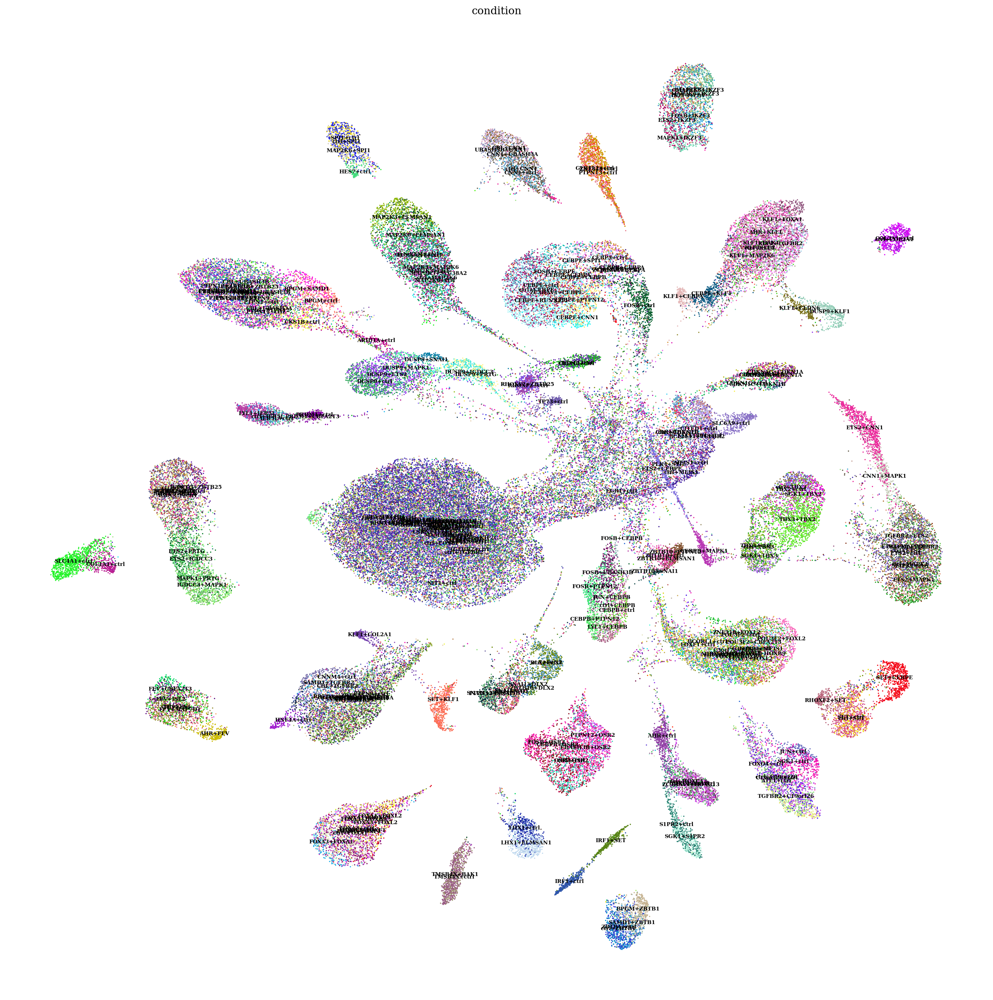

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

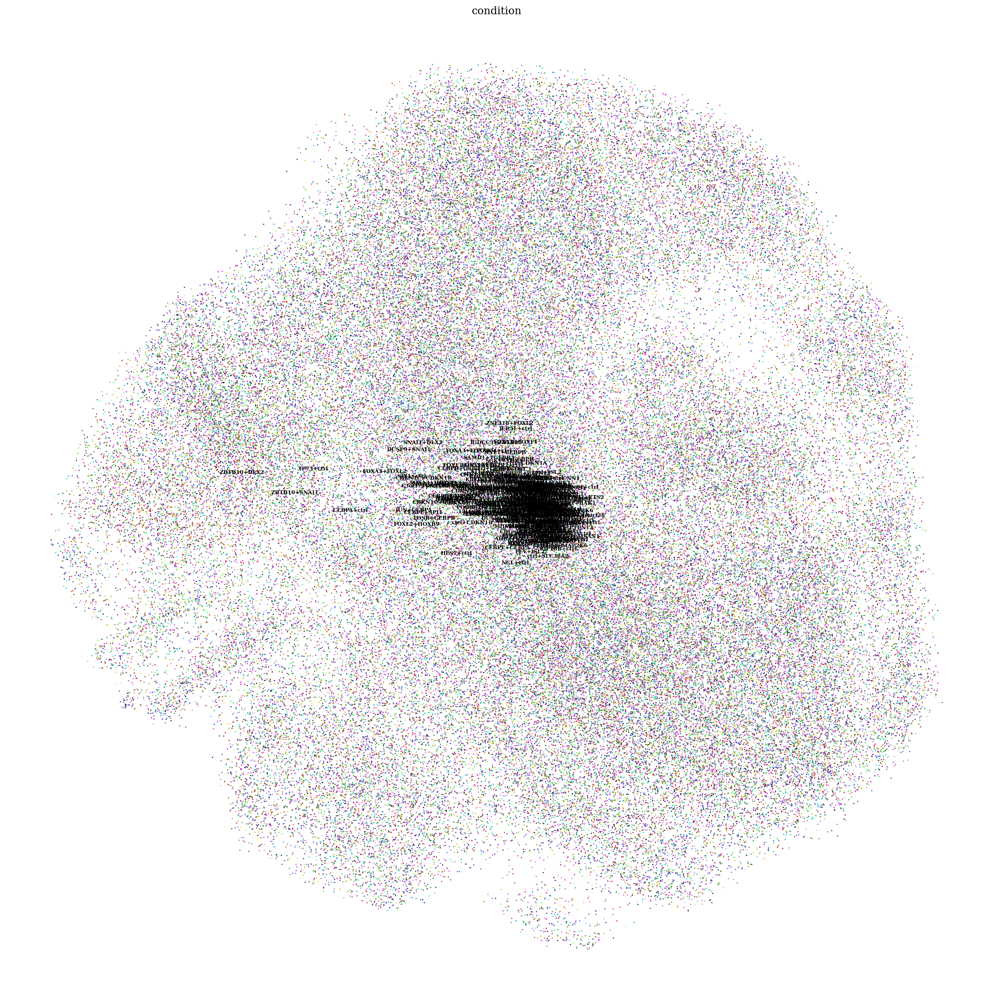

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()